# Scripts for Deviance Detection paper figures

## Specify data root path

In [16]:
# Common root path for oddball data per mouse ID
common_path_oddball = r"D:\learning\Overseas Research\Data\Shengjie Data\Oddball_TLB10-GIRSZ"

# Common root path for pure tone data (for correlation between calcium and zinc tonotopic maps) per mouse ID
common_path_spatial = r"D:\learning\Overseas Research\Data\Shengjie Data\Correlation_spatial_dFF"

## Figure 1 (calcium, A1 vs AAF, 0.5s ISI, preZX1)

### Load oddball metadata and process (calcium, A1, 0.5s ISI)

In [3]:
# Initialize experiment group object of all animals with 0.5s ISI
import lib.experiment_oop as exp

# Define path
dPaths_calcium = [
    # A1 and AAF identified (select A1)
    common_path_oddball + r"\20250630\AA0001\Oddball",
    common_path_oddball + r"\20250707\AA0001\Oddball\Control", 
    common_path_oddball + r"\20251110\AA0001\RGECO\Oddball_old_0.5secISI", 
    common_path_oddball + r"\20251205\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251209\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\RGECO\Oddball_0.5secISI_80dB", 
    # A1 and AAF not identified
    common_path_oddball + r"\20251113\AA0001\RGECO\Oddball_0.5secISI_20250710position", 
    common_path_oddball + r"\20251117\AA0001\RGECO\Oddball_0.5secISI_20250710position", 
    common_path_oddball + r"\20251208\AA0001\RGECO\Oddball_0.5secISI"
]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.0, 4.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_calcium = exp.ExperimentGroup(dPaths_calcium, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_calcium.load_qcam_data()

# Process qcam files with saved ROI
group_calcium.process_signal(mask_name='response_mask_A1', add_filtered_data=False, test_negative=False)

# Extract pure tone trials
df_pureTone_calcium_all = group_calcium.df[group_calcium.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_calcium_all['id'] = df_pureTone_calcium_all['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID

# Extract oddball trials
df_oddball_calcium_all = group_calcium.df[group_calcium.df['pulse'].str.contains('oddball')].copy()
df_oddball_calcium_all['id'] = df_oddball_calcium_all['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_calcium_all

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,f0_ROI_linFilt,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:49:05,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,16.977470,"[0.07015625000000014, 0.14390625000000057, 0.3...",2.800781,"[0.03609251986545203, 0.11053067602978572, 0.2...",2.817641,"[0.003866323376187245, 0.007930698952045567, 0...",0.154352,"[0.00212590685021799, 0.006510432693724693, 0....",0.165964,20250630
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:50:23,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.425713,"[-0.09268750000000026, -0.10393750000000068, -...",2.401687,"[-0.11901847419225575, -0.1297365353196831, -0...",2.415784,"[-0.0050565494761033, -0.00567029115223184, -0...",0.131024,"[-0.006830048917143134, -0.007445120504088603,...",0.138633,20250630
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:52:00,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.350230,"[0.48068750000000193, 0.3125625000000021, 0.21...",2.576938,"[0.4678318412539184, 0.2999665515316181, 0.198...",2.583560,"[0.026822301814542256, 0.017440948039855176, 0...",0.143793,"[0.026964014384201283, 0.01728890959751462, 0....",0.148906,20250630
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:53:37,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.594528,"[-0.09256249999999966, -6.250000000207478e-05,...",1.884313,"[-0.10339086018440113, -0.010672105433204848, ...",1.888141,"[-0.005083390254032197, -3.432403952870336e-06...",0.103484,"[-0.00587630758816033, -0.0006065582008597155,...",0.107314,20250630
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:55:14,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.396827,"[0.9978437499999977, 1.094093749999999, 0.9840...",1.812219,"[0.9869554683636181, 1.0834254336492037, 0.973...",1.816288,"[0.05497108642396121, 0.060273486793063435, 0....",0.099835,"[0.05673192337121511, 0.062277185395326284, 0....",0.104403,20250630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:02:32,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,84.623538,"[-0.5535937500000045, -0.1598437500000074, -0....",4.018906,"[-0.5766546527014214, -0.18243877587917723, -0...",4.030320,"[-0.006429485260092058, -0.0018564390124398604...",0.046676,"[-0.006814352883758464, -0.002155886877349687,...",0.047626,20260121
111,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:05:07,"(130, 174)","[[Fals

In [ ]:
import joblib
# joblib.dump(df_pureTone_calcium_all, '../data/cache/pureTone_calcium_all.joblib')
# joblib.dump(df_oddball_calcium_all, '../data/cache/oddball_calcium_all.joblib')

df_pureTone_calcium_all = joblib.load('../data/cache/pureTone_calcium_all.joblib')
df_oddball_calcium_all = joblib.load('../data/cache/oddball_calcium_all.joblib')
df_oddball_calcium_preZX1 = df_oddball_calcium_all[df_oddball_calcium_all['treatment'] == 'preZX1'].copy()  # Only include preZX1 data
df_oddball_calcium_preZX1

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,f0_ROI_linFilt,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:49:05,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,16.977470,"[0.07015625000000014, 0.14390625000000057, 0.3...",2.800781,"[0.03609251986545203, 0.11053067602978572, 0.2...",2.817641,"[0.003866323376187245, 0.007930698952045567, 0...",0.154352,"[0.00212590685021799, 0.006510432693724693, 0....",0.165964,20250630
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:50:23,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.425713,"[-0.09268750000000026, -0.10393750000000068, -...",2.401687,"[-0.11901847419225575, -0.1297365353196831, -0...",2.415784,"[-0.0050565494761033, -0.00567029115223184, -0...",0.131024,"[-0.006830048917143134, -0.007445120504088603,...",0.138633,20250630
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:52:00,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.350230,"[0.48068750000000193, 0.3125625000000021, 0.21...",2.576938,"[0.4678318412539184, 0.2999665515316181, 0.198...",2.583560,"[0.026822301814542256, 0.017440948039855176, 0...",0.143793,"[0.026964014384201283, 0.01728890959751462, 0....",0.148906,20250630
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:53:37,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.594528,"[-0.09256249999999966, -6.250000000207478e-05,...",1.884313,"[-0.10339086018440113, -0.010672105433204848, ...",1.888141,"[-0.005083390254032197, -3.432403952870336e-06...",0.103484,"[-0.00587630758816033, -0.0006065582008597155,...",0.107314,20250630
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-06-30 17:55:14,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,17.396827,"[0.9978437499999977, 1.094093749999999, 0.9840...",1.812219,"[0.9869554683636181, 1.0834254336492037, 0.973...",1.816288,"[0.05497108642396121, 0.060273486793063435, 0....",0.099835,"[0.05673192337121511, 0.062277185395326284, 0....",0.104403,20250630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:52:19,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,76.399663,"[-0.784000000000006, -0.8215000000000003, -1.2...",3.363500,"[-0.868106196513807, -0.9039070814327204, -1.3...",3.408527,"[-0.010089327222684333, -0.010571916216116225,...",0.043285,"[-0.011362696683607126, -0.011831296721219997,...",0.044614,20260121
105,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:55:04,"(130, 174)","[[False,

In [5]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_calcium_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20250630, 20250707, 20251110
deviant_pos_calcium_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_calcium_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_calcium_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_calcium_all = {
    '20250630': onset_times_calcium_halfSecISI_old,
    '20250707': onset_times_calcium_halfSecISI_old,
    '20251110': onset_times_calcium_halfSecISI_old,

    '20251113': onset_times_calcium_halfSecISI_new,
    '20251117': onset_times_calcium_halfSecISI_new,
    '20251205': onset_times_calcium_halfSecISI_new,
    '20251208': onset_times_calcium_halfSecISI_new,
    '20251209': onset_times_calcium_halfSecISI_new,
    '20251210': onset_times_calcium_halfSecISI_new,
    '20260121': onset_times_calcium_halfSecISI_new
}

# Calculate averaged whole traces re id
df_resp_trace_calcium_temp = []

for id, df_sub_calcium in df_oddball_calcium_preZX1.groupby('id', sort=False):
    onset_times_calcium = onset_times_calcium_all[id]
    
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False
    )

    # restore id column
    df_resp_trace_calcium['id'] = id

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_trace_calcium_preZX1 = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_trace_calcium_preZX1 = df_resp_trace_calcium_preZX1[
    ['id', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_calcium_preZX1

,id,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20250630,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.00212590685021799, 0.006510432693724693, 0...","[0.011702366069661635, 0.00530887938677149, 0....","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
1,20250630,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.006830048917143134, -0.007445120504088603...","[0.032569733356584696, 0.028180309487510463, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
2,20250707,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.02816900935678727, 0.019127013904734935, 0...","[0.018765435438738376, 0.004636333759947733, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
3,20250707,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.055155385985214675, 0.038993656497380555, ...","[0.026666593590146486, 0.01600959428066538, 0....","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
4,20251110,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.012285658756706789, -0.004760989917521582...","[-0.00249911471329685, 0.002849806430697197, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
5,20251110,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.042512381735019124, -0.04214378051844916,...","[-0.025151792615453663, -0.026622681358079114,...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
6,20251113,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.006309575374336701, 0.004907182565924203, ...","[0.018547230428021623, 0.016642677089689424, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
7,20251113,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.013457242767088295, 0.01794764667257647, 0...","[0.011696447294220244, 0.010862451040721234, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
8,20251117,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.02622919256647008, 0.011792641869585434, -...","[0.013848507037661752, 0.011181148649774899, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
9,20251117,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.056034086341020764, -0.034903513523896694...","[-0.011569282577741962, -0.00864096492991432, ...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."


In [6]:
# Calculate deviant/standard peak response re id
df_resp_peak_calcium_temp = []

for id, df_sub_calcium in df_resp_trace_calcium_preZX1.groupby('id', sort=False):
    df_resp_peak_calcium = signalProcess.add_oddball_respData(df_sub_calcium, t_resp=(0, 0.475))

    # restore id column
    df_resp_peak_calcium['id'] = id

    df_resp_peak_calcium_temp.append(df_resp_peak_calcium)

df_resp_peak_calcium_preZX1 = pd.concat(df_resp_peak_calcium_temp, ignore_index=True)
df_resp_peak_calcium_preZX1 = df_resp_peak_calcium_preZX1[['id', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_calcium_preZX1

,id,treatment,pulse,stimulus,trace,response
0,20250630,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.00042760450453068616, 0.011133755197...",0.029073
1,20250630,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.009582622296551109, 0.00030108061732...",0.016283
2,20250630,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0039691634781792995, -0.004676443331...",0.004102
3,20250630,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0021461648423713314, -0.002302542231...",0.006753
4,20250707,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0068705870097292565, 0.02724428439423...",0.030401
5,20250707,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.005174847808231187, 0.00839326120757...",0.031696
6,20250707,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.004114609339830447, 0.00482199750420...",0.010072
7,20250707,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0065743347578128, -0.005000406740270...",0.021513
8,20251110,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978
9,20251110,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318


### Figure 1C (representative whole trace)

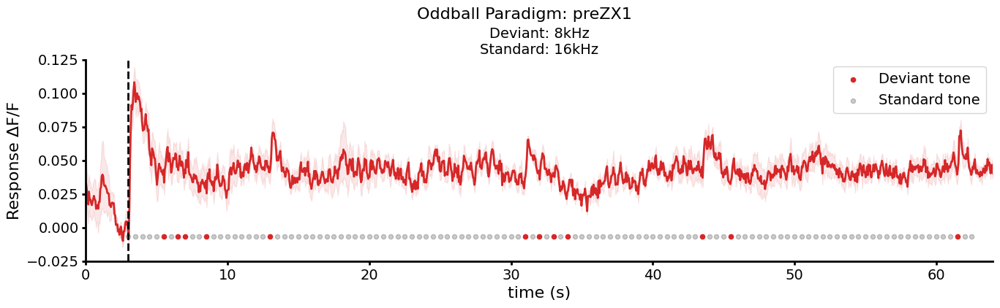

In [7]:
# Plot representative whole trace showing deviant and standard tone onsets
import seaborn as sns
calcium_trace_palette = {'Deviant': sns.color_palette("tab20")[6], 'Standard': 'k'}

df_oddball_calcium_represent = df_oddball_calcium_preZX1[
    (df_oddball_calcium_preZX1['id'] == '20250630') &
    (df_oddball_calcium_preZX1['pulse'] == 'oddball_7711Hz_std_15422Hz_80dB_500msISI_100msPulse_3sOnset_4000msAfterTrain_sinSquaredRamp5ms_67sTotal_Fs250kHz')
].copy()

df_resp_trace_calcium_represent = plotting.plot_oddball_wholeTrace(df_oddball_calcium_represent, onset_times_calcium_halfSecISI_old, 
                                                                   resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), 
                                                                   plot_errBar=True, stim_colors=calcium_trace_palette, 
                                                                   show_deviant_dots=True, show_standard_dots=True, 
                                                                   trace_color=sns.color_palette("tab20")[6], 
                                                                   Xaxis_range=(0, 64), Yaxis_range=(-0.025, 0.125), 
                                                                   Yaxis_label='Response ΔF/F')

### Figure 1D (representative average trace, Deviant vs Standard, same protocol)

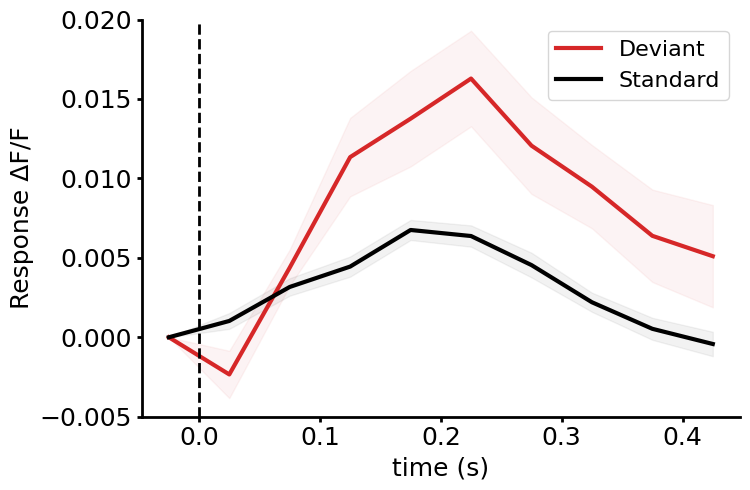

In [8]:
df_resp_peak_calcium_represent = signalProcess.add_oddball_respData(df_resp_trace_calcium_represent, t_resp=(0, 0.475))
fig = plotting.plot_oddball_trace_reTone(df_resp_peak_calcium_represent, x_col=None, y_col=None, 
                                         color_palette=calcium_trace_palette, Yaxis_label='Response ΔF/F',
                                         Yaxis_range=(-0.005, 0.020), plot_errBar=True)

### Figure 1E (response, Deviant vs Standard, re frequency)

In [9]:
df_resp_calcium_freq = df_resp_peak_calcium_preZX1.copy()

# Extract Deviant and Standard frequencies
df_resp_calcium_freq[['dev_freq', 'std_freq']] = df_resp_calcium_freq['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_calcium_freq['Frequency'] = df_resp_calcium_freq.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_calcium_freq = df_resp_calcium_freq[['id', 'Frequency', 'stimulus', 'trace', 'response']]
df_resp_calcium_freq.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_calcium_freq

,id,Frequency,stimulus,trace,Response ΔF/F
0,20250630,16kHz,Deviant,"[[0.0, -0.00042760450453068616, 0.011133755197...",0.029073
1,20250630,8kHz,Deviant,"[[0.0, -0.009582622296551109, 0.00030108061732...",0.016283
2,20250630,8kHz,Standard,"[[0.0, -0.0039691634781792995, -0.004676443331...",0.004102
3,20250630,16kHz,Standard,"[[0.0, -0.0021461648423713314, -0.002302542231...",0.006753
4,20250707,16kHz,Deviant,"[[0.0, 0.0068705870097292565, 0.02724428439423...",0.030401
5,20250707,8kHz,Deviant,"[[0.0, -0.005174847808231187, 0.00839326120757...",0.031696
6,20250707,8kHz,Standard,"[[0.0, -0.004114609339830447, 0.00482199750420...",0.010072
7,20250707,16kHz,Standard,"[[0.0, -0.0065743347578128, -0.005000406740270...",0.021513
8,20251110,16kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978
9,20251110,8kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318


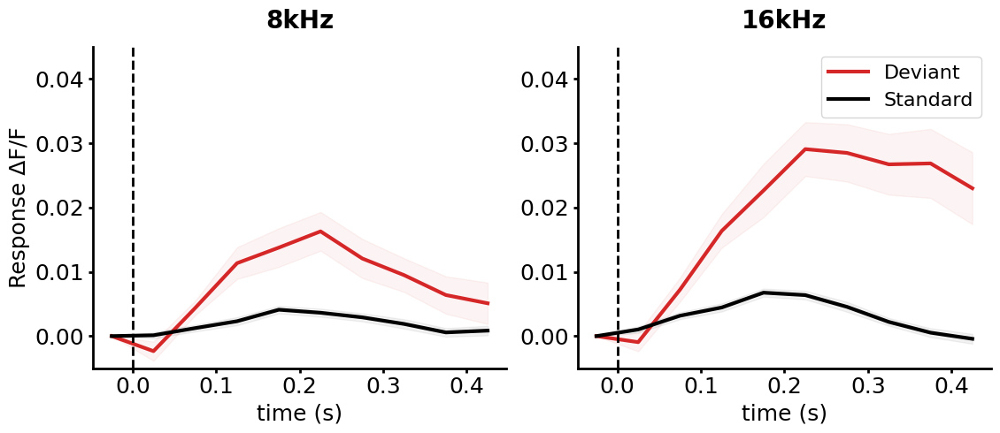

In [10]:
# Plot representative Deviant and Standard traces re frequency
import seaborn as sns
import lib.plotting as plotting

calcium_trace_freq_palette = {'Deviant': sns.color_palette("tab20")[6], 'Standard': 'k'}  # Red for Deviant and black for Standard

# Representative animal: 20250630
df_resp_calcium_freq_represent = df_resp_calcium_freq[df_resp_calcium_freq['id'] == '20250630'].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_freq_represent, trace_col='trace', x_col='Frequency', y_col=None, within_col='stimulus', 
                                         x_order=['8kHz', '16kHz'], color_palette=calcium_trace_freq_palette, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.005, 0.045), plot_errBar=True)

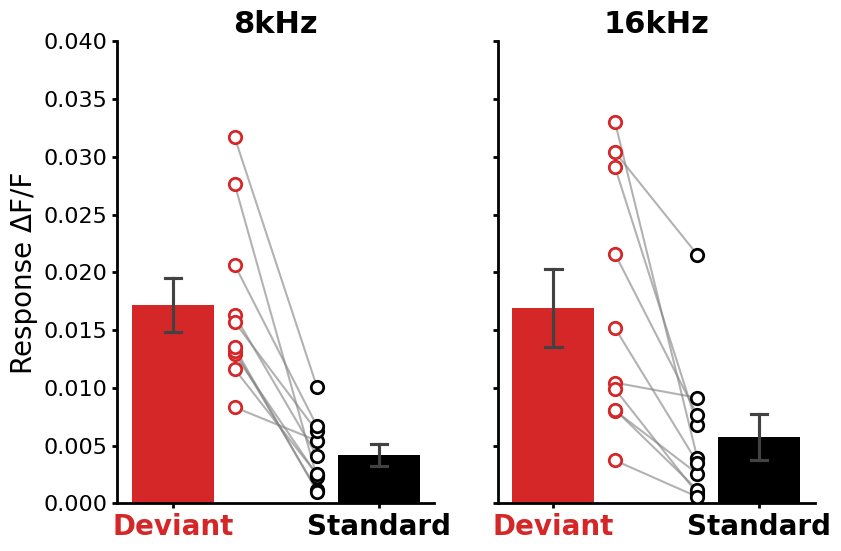

In [11]:
# Plot response amplitudes Deviant vs Standard re frequency
calcium_resp_freq_palette = [sns.color_palette("tab20")[6], 'k', 
                             sns.color_palette("tab20")[6], 'k']  # Red for Deviant and black for Standard

plotting.plot_barplot(df_resp_calcium_freq, x='stimulus', y='Response ΔF/F', group='Frequency', id='id', group_order=['8kHz', '16kHz'], 
                      palette=calcium_resp_freq_palette, offset=0.3, Yaxis_range=(0, 0.04), title_color='k')

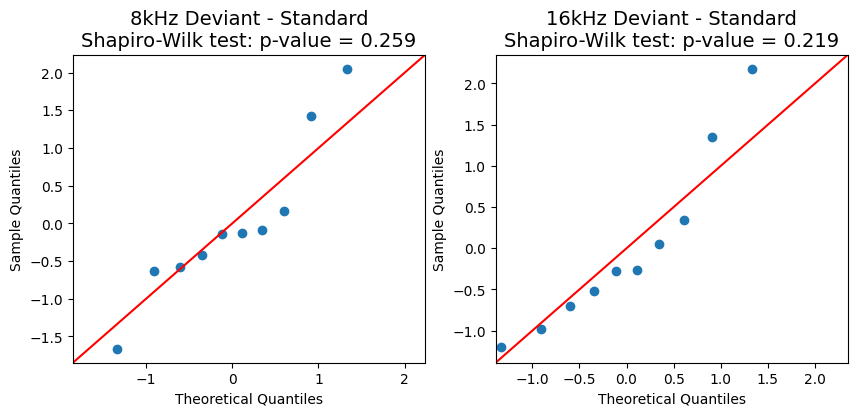

Response amplitude, 8kHz Deviant vs Standard, paired t-test, p-value = 0.0001
Response amplitude, 16kHz Deviant vs Standard, paired t-test, p-value = 0.0027


In [13]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each stimulus re frequency paired by id
df_pivot_8kHz = (
    df_resp_calcium_freq[df_resp_calcium_freq['Frequency'] == '8kHz'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_8kHz = df_pivot_8kHz.columns.tolist()
groups_8kHz = [df_pivot_8kHz[col].to_numpy() for col in group_label_8kHz]

df_pivot_16kHz = (
    df_resp_calcium_freq[df_resp_calcium_freq['Frequency'] == '16kHz'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_16kHz = df_pivot_16kHz.columns.tolist()
groups_16kHz = [df_pivot_16kHz[col].to_numpy() for col in group_label_16kHz]

# Create Q-Q plot to test normality of the differences between Deviant and Standard re frequency
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_8kHz[0] - groups_8kHz[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_16kHz[0] - groups_16kHz[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'8kHz {group_label_8kHz[0]} - {group_label_8kHz[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_8kHz[0] - groups_8kHz[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'16kHz {group_label_16kHz[0]} - {group_label_16kHz[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_16kHz[0] - groups_16kHz[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between Deviant and Standard re frequency
print(f"Response amplitude, 8kHz {group_label_8kHz[0]} vs {group_label_8kHz[1]}, paired t-test, p-value = {ttest_rel(groups_8kHz[0], groups_8kHz[1])[1]:.4f}")
print(f"Response amplitude, 16kHz {group_label_16kHz[0]} vs {group_label_16kHz[1]}, paired t-test, p-value = {ttest_rel(groups_16kHz[0], groups_16kHz[1])[1]:.4f}")

### Figure 1F (SI, 8kHz vs 16kHz)

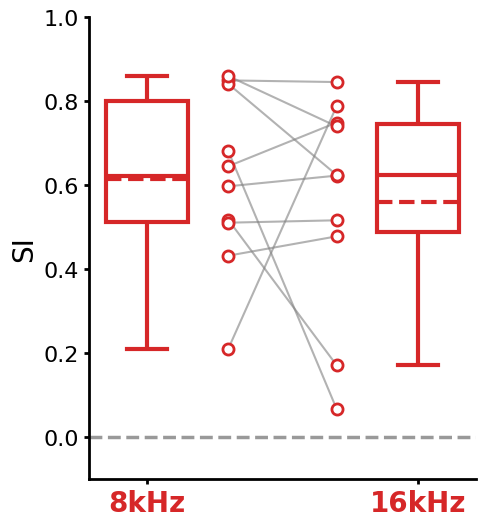

In [14]:
# Plot normalized stimulus-specific adaptation indices (SI) 8kHz vs 16kHz
import seaborn as sns
import lib.plotting as plotting

calcium_SI_freq_palette = [sns.color_palette("tab20")[6]] * 2
df_SI_calcium_freq = df_resp_peak_calcium_preZX1.copy()

# Extract Deviant and Standard frequencies
df_SI_calcium_freq[['dev_freq', 'std_freq']] = df_SI_calcium_freq['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_freq['Frequency'] = df_SI_calcium_freq.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/frequency combination
df_SI_calcium_freq = (
    df_SI_calcium_freq
    .pivot_table(index=['id', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_freq, x='Frequency', y='SI', id='id', x_order=['8kHz', '16kHz'], 
                      palette=calcium_SI_freq_palette, offset=0.3, Yaxis_range=(-0.1, 1))

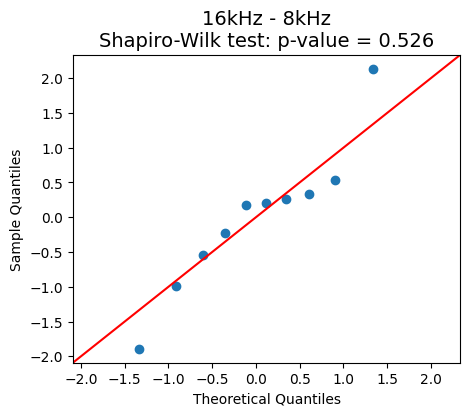

SI, 16kHz vs 8kHz, paired t-test, p-value = 0.5963


In [15]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract SI values for each frequency paired by id
df_pivot = df_SI_calcium_freq.pivot_table(index='id', columns='Frequency', values='SI', sort=False)
group_label = df_pivot.columns.tolist()
groups = [df_pivot[col].to_numpy() for col in group_label]

# Create Q-Q plot to test normality of the differences between 8kHz and 16kHz
fig, ax = plt.subplots(figsize=(5, 4))
sm.qqplot(groups[0]-groups[1], fit=True, line='45', ax=ax)
ax.set_title(f'{group_label[0]} - {group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[0]-groups[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between 8kHz and 16kHz
print(f"SI, {group_label[0]} vs {group_label[1]}, paired t-test, p-value = {ttest_rel(groups[0], groups[1])[1]:.4f}")

### Figure 1G (tonotopic distribution of A1 and AAF)

In [19]:
# Load pure tone responses (8kHz and 16kHz) of a representative animal
import lib.experiment_oop as exp

# Define path
dPaths_calcium_represent = [common_path_oddball + r"\20250908\AA0001\Oddball\Control"]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.0, 4.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_calcium_represent = exp.ExperimentGroup(dPaths_calcium_represent, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_calcium_represent.load_qcam_data()

# Process qcam files with saved ROI
group_calcium_represent.process_signal(mask_name='response_mask_A1', add_filtered_data=False, test_negative=False)

# Extract pure tone trials
df_pureTone_calcium_represent = group_calcium_represent.df[(group_calcium_represent.df['pulse'].str.contains('pureTone')) & 
                                                           (group_calcium_represent.df['treatment'] == 'preZX1')].copy()
df_pureTone_calcium_represent

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")


,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,f0_ROI_raw,f0_ROI_linFilt,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-09-08 17:19:46,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,55.959656,54.390013,"[1.3222187499999976, 0.9940937499999976, 1.195...",7.411594,"[0.31716474302481856, 0.009343864377854061, 0....",7.793774,"[0.023628071339340966, 0.01776447206106627, 0....",0.132445,"[0.005831304818352266, 0.00017179375251159872,...",0.143294
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_70dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-09-08 17:20:06,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,55.135438,51.705840,"[0.2701874999999987, 0.5464374999999961, 1.033...",12.106437,"[0.24363294785493395, 0.5204194034538219, 1.00...",12.118508,"[0.00490043268451436, 0.009910821873862816, 0....",0.219576,"[0.0047119039004879446, 0.010065002449848297, ...",0.234374
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_70dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-09-08 17:20:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,52.894312,49.234086,"[3.573187500000003, 3.605687500000002, 3.75568...",10.889437,"[2.654391364002848, 2.7054529021038007, 2.8740...",11.214264,"[0.06755334044657454, 0.06816777323648932, 0.0...",0.205872,"[0.053913692758315104, 0.05495081038696439, 0....",0.227774
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-09-08 17:20:46,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,56.371062,55.594849,"[3.153937500000005, 3.223312500000006, 2.60143...",5.955188,"[2.454984311014016, 2.538479577458176, 1.93072...",6.230533,"[0.05594958406185807, 0.05718026868838965, 0.0...",0.105643,"[0.04415848495537769, 0.0456603375132854, 0.03...",0.112070
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_70dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-09-08 17:21:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,53.267344,51.144067,"[2.2657812500000034, 1.9857812500000023, 1.587...",9.387031,"[1.70956340213192, 1.4408001263312755, 1.05328...",9.583674,"[0.04253602846490733, 0.0372795245679958, 0.02...",0.176225,"[0.03342642666591393, 0.0281714031214009, 0.02...",0.187386
5,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_70dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-09-08 17:21:46,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,54.021969,53.100131,"[-0.5682187499999998, -0.25884374999999693, -0...",7.730531,"[-0.15223288832221726, 0.14873835689641624, -0...",7.575062,"[-0.010518290302035684, -0.0047914534769708285...",0.143100,"[-0.0028669022854219653, 0.0028010920637180805...",0.142656
6,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-09-08 17:22:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,54.104219,52.882262,"[0.6476562500

7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSquaredRamp5ms_10000msTotal_250kHzFs


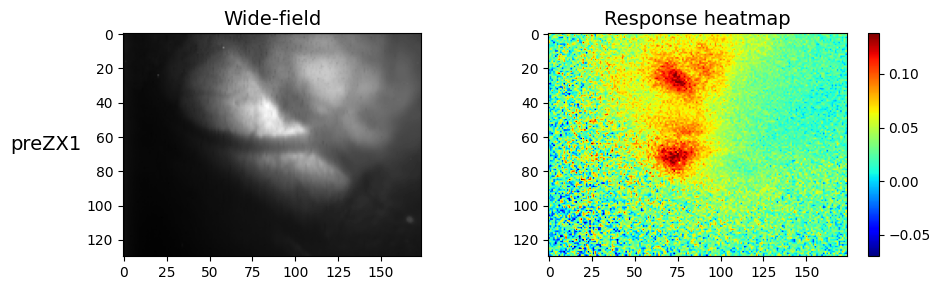

15422Hz_70dB_pureTone_100msPulse_3sOnset_sinSquaredRamp5ms_10000msTotal_250kHzFs


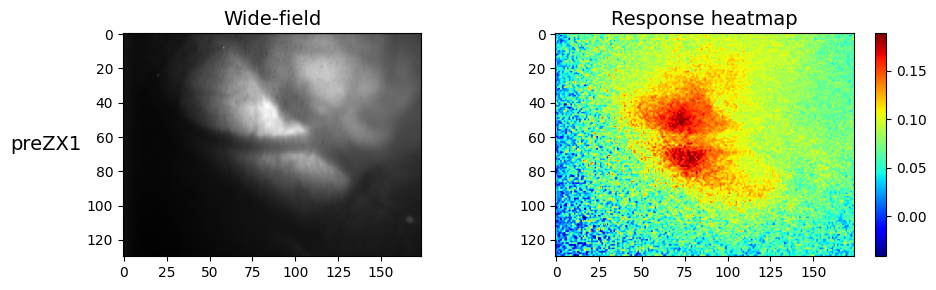

In [20]:
# Show representative spatial tonotopic distribution of A1 and AAF in response to 8kHz and 16kHz pure tones
import lib.plotting as plotting
contrast_percentile=(0.1, 99.9)  # Percentile of the color scale to prevent extreme values compressing the color range (same as MATLAB)
                                 # If None, auto-scale the heatmap based on max and min fluorescence of the original image

# Get unique pulses and sort by frequency then dB
for freq in sorted(df_pureTone_calcium_represent['pulse'].unique(), key=lambda x: int(x.split('Hz')[0])):
    print(freq)
    plotting.plot_respHeatmap(df_pureTone_calcium_represent[df_pureTone_calcium_represent['pulse']==freq], 
                              t_baseline=(2.0, 3.0), t_temporalAvg=(3.0, 4.0), 
                              dB_plot=None, contrast_percentile=contrast_percentile)

### Load oddball metadata and process (calcium, A1 & AAF, 0.5s ISI)

In [21]:
# Initialize experiment group object in A1/AAF with 0.5s ISI
import pandas as pd
import lib.experiment_oop as exp

# Define path
dPaths_calcium_halfSecISI_A1 = [
    common_path_oddball + r"\20251110\AA0001\RGECO\Oddball_old_0.5secISI", 
    common_path_oddball + r"\20251205\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251208\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251209\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\RGECO\Oddball_0.5secISI_80dB"
]

dPaths_calcium_halfSecISI_AAF = [
    common_path_oddball + r"\20251110\AA0001\RGECO\Oddball_old_0.5secISI", 
    common_path_oddball + r"\20251205\AA0001\RGECO\Oddball_0.5secISI", 
    # common_path_oddball + r"\20251208\AA0001\RGECO\Oddball_0.5secISI",  # Only one hotspot observed (assumed to be A1)
    common_path_oddball + r"\20251209\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\RGECO\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\RGECO\Oddball_0.5secISI_80dB"
]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.0, 4.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_calcium_halfSecISI_A1 = exp.ExperimentGroup(dPaths_calcium_halfSecISI_A1, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')
group_calcium_halfSecISI_AAF = exp.ExperimentGroup(dPaths_calcium_halfSecISI_AAF, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_calcium_halfSecISI_A1.load_qcam_data()
group_calcium_halfSecISI_AAF.load_qcam_data()

# Process qcam files re saved ROI
group_calcium_halfSecISI_A1.process_signal(mask_name='response_mask_A1', add_filtered_data=False, test_negative=False)
group_calcium_halfSecISI_AAF.process_signal(mask_name='response_mask_AAF', add_filtered_data=False, test_negative=False)

# Extract pure tone trials in A1/AAF and combine
df_pureTone_calcium_A1 = group_calcium_halfSecISI_A1.df[group_calcium_halfSecISI_A1.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_calcium_A1['subfield'] = 'A1'
df_pureTone_calcium_AAF = group_calcium_halfSecISI_AAF.df[group_calcium_halfSecISI_AAF.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_calcium_AAF['subfield'] = 'AAF'
df_pureTone_calcium = pd.concat([df_pureTone_calcium_A1, df_pureTone_calcium_AAF], ignore_index=True)
df_pureTone_calcium['id'] = df_pureTone_calcium['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID

# Extract oddball trials in A1/AAF and combine
df_oddball_calcium_halfSecISI_A1 = group_calcium_halfSecISI_A1.df[group_calcium_halfSecISI_A1.df['pulse'].str.contains('oddball')].copy()
df_oddball_calcium_halfSecISI_A1['subfield'] = 'A1'
df_oddball_calcium_halfSecISI_AAF = group_calcium_halfSecISI_AAF.df[group_calcium_halfSecISI_AAF.df['pulse'].str.contains('oddball')].copy()
df_oddball_calcium_halfSecISI_AAF['subfield'] = 'AAF'
df_oddball_calcium_halfSecISI = pd.concat([df_oddball_calcium_halfSecISI_A1, df_oddball_calcium_halfSecISI_AAF], ignore_index=True)
df_oddball_calcium_halfSecISI['id'] = df_oddball_calcium_halfSecISI['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_calcium_halfSecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:56:06,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-2.1991250000000093, -2.1841250000000088, -2....",7.164625,"[-2.551842579610401, -2.529716971941504, -2.64...",7.339202,"[-0.03414472254137827, -0.03391182498524995, -...",0.111242,"[-0.042512381735019124, -0.04214378051844916, ...",0.122267,A1,20251110
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:58:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.5750624999999872, -0.15756249999999028, 0....",3.283688,"[-0.6852955178396201, -0.2655685881862908, -0....",3.338247,"[-0.00956394203633674, -0.0026204431989570666,...",0.054611,"[-0.012285658756706789, -0.004760989917521582,...",0.059847,A1,20251110
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:00:38,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.4103124999999892, -0.6053124999999895, -0....",7.177813,"[-0.45673847609643303, -0.6508005775894432, -0...",7.201729,"[-0.0066424845826565165, -0.009799308938770592...",0.116200,"[-0.0077912034958881994, -0.011101582197709068...",0.122850,A1,20251110
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:03:14,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.4840624999999932, 0.6603124999999892, 0.944...",2.718438,"[0.40828690388438815, 0.5860677240079326, 0.87...",2.755943,"[0.008132471609851253, 0.011093552299299973, 0...",0.045671,"[0.0072874293301130886, 0.010460602778915976, ...",0.049190,A1,20251110
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2025-11-10 19:56:44,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.3341250000000002, 0.4316250000000039, 0.460...",6.474750,"[0.26893521053096947, 0.36775217597479326, 0.3...",6.508333,"[0.005441697695676165, 0.00702962294918442, 0....",0.105450,"[0.0045936807569458135, 0.006281572765295533, ...",0.111169,A1,20251110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:02:32,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.9213749999999976, -0.6188749999999956, -0....",4.100500,"[-0.9698429000651103, -0.6663637505688413, -0....",4.127427,"[-0.017597303227007793, -0.01181986816943633, ...",0.078315,"[-0.018918287765719844, -0.012998456955306234,...",0.080512,AAF,20260121
130,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:05:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",.

In [ ]:
import joblib
# joblib.dump(df_pureTone_calcium, '../data/cache/pureTone_calcium.joblib')
# joblib.dump(df_oddball_calcium_halfSecISI, '../data/cache/oddball_calcium_halfSecISI.joblib')

df_pureTone_calcium = joblib.load('../data/cache/pureTone_calcium.joblib')
df_oddball_calcium_halfSecISI = joblib.load('../data/cache/oddball_calcium_halfSecISI.joblib')
df_oddball_calcium_halfSecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:56:06,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-2.1991250000000093, -2.1841250000000088, -2....",7.164625,"[-2.551842579610401, -2.529716971941504, -2.64...",7.339202,"[-0.03414472254137827, -0.03391182498524995, -...",0.111242,"[-0.042512381735019124, -0.04214378051844916, ...",0.122267,A1,20251110
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:58:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.5750624999999872, -0.15756249999999028, 0....",3.283688,"[-0.6852955178396201, -0.2655685881862908, -0....",3.338247,"[-0.00956394203633674, -0.0026204431989570666,...",0.054611,"[-0.012285658756706789, -0.004760989917521582,...",0.059847,A1,20251110
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:00:38,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.4103124999999892, -0.6053124999999895, -0....",7.177813,"[-0.45673847609643303, -0.6508005775894432, -0...",7.201729,"[-0.0066424845826565165, -0.009799308938770592...",0.116200,"[-0.0077912034958881994, -0.011101582197709068...",0.122850,A1,20251110
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:03:14,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.4840624999999932, 0.6603124999999892, 0.944...",2.718438,"[0.40828690388438815, 0.5860677240079326, 0.87...",2.755943,"[0.008132471609851253, 0.011093552299299973, 0...",0.045671,"[0.0072874293301130886, 0.010460602778915976, ...",0.049190,A1,20251110
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2025-11-10 19:56:44,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.3341250000000002, 0.4316250000000039, 0.460...",6.474750,"[0.26893521053096947, 0.36775217597479326, 0.3...",6.508333,"[0.005441697695676165, 0.00702962294918442, 0....",0.105450,"[0.0045936807569458135, 0.006281572765295533, ...",0.111169,A1,20251110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:02:32,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.9213749999999976, -0.6188749999999956, -0....",4.100500,"[-0.9698429000651103, -0.6663637505688413, -0....",4.127427,"[-0.017597303227007793, -0.01181986816943633, ...",0.078315,"[-0.018918287765719844, -0.012998456955306234,...",0.080512,AAF,20260121
130,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:05:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",.

In [23]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_calcium_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20251110
deviant_pos_calcium_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_calcium_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_calcium_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_calcium_halfSecISI_all = {
    '20251110': onset_times_calcium_halfSecISI_old,

    '20251205': onset_times_calcium_halfSecISI_new,
    '20251208': onset_times_calcium_halfSecISI_new,
    '20251209': onset_times_calcium_halfSecISI_new,
    '20251210': onset_times_calcium_halfSecISI_new,
    '20260121': onset_times_calcium_halfSecISI_new,
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_calcium_temp = []

for (id, subfield), df_sub_calcium in df_oddball_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_calcium = onset_times_calcium_halfSecISI_all[id]
    
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_calcium['id'] = id
    df_resp_trace_calcium['subfield'] = subfield

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_trace_calcium_halfSecISI = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_trace_calcium_halfSecISI = df_resp_trace_calcium_halfSecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_calcium_halfSecISI

,id,subfield,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.012285658756706789, -0.004760989917521582...","[-0.00249911471329685, 0.002849806430697197, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.042512381735019124, -0.04214378051844916,...","[-0.025151792615453663, -0.026622681358079114,...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
2,20251110,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.024424126926125764, 0.02740615695068655, 0...","[0.012174498306397455, 0.019019366262969382, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
3,20251110,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.0045936807569458135, 0.006281572765295533,...","[-0.0027269210395723547, -0.004779366336754104...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
4,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.0018709092340910827, 0.003897177571842280...","[-0.02429638469955094, -0.02481373417961108, -...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
5,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.08631286666537263, -0.08417741382050307, ...","[-0.019565179355345647, -0.015677906177571522,...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
6,20251205,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.020892182324491203, 0.010397455974016201, ...","[0.011487082069957402, 0.010120693528975025, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
7,20251205,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.02001699654285302, -0.01695947131449592, ...","[0.010712621790874108, 0.01280267236354693, 0....","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
8,20251208,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.012042775059722552, 0.0196613606544929, 0....","[0.010861153623484578, 0.007402454319802712, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
9,20251208,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.08624389155799893, -0.08067994757607824, ...","[-0.026754219749238823, -0.025394437816520926,...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."


In [24]:
# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_calcium_temp = []

for (id, subfield), df_sub_calcium in df_resp_trace_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_calcium = signalProcess.add_oddball_respData(df_sub_calcium, t_resp=(0, 0.475))

    # Restore metadata columns
    df_resp_peak_calcium['id'] = id
    df_resp_peak_calcium['subfield'] = subfield

    df_resp_peak_calcium_temp.append(df_resp_peak_calcium)

df_resp_peak_calcium_halfSecISI = pd.concat(df_resp_peak_calcium_temp, ignore_index=True)
df_resp_peak_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_calcium_halfSecISI

,id,subfield,treatment,pulse,stimulus,trace,response
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318
2,20251110,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0030091325364793916, 0.0102642235556...",0.014429
3,20251110,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.0011540600780237387, 0.00629169129981...",0.008251
4,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0001977644519279842, 0.0030473702945...",0.005420
...,...,...,...,...,...,...,...
83,20260121,AAF,postZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0020725559712061054, 0.0053162027484...",0.020699
84,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0075839984492133555, -0.005943052641...",0.002959
85,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0010148533884228872, -0.000503588637...",0.002599
86,20260121,AAF,postZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.007111408581005049, -0.0048636579342...",0.000862


### Figure 1H (SI, A1 vs AAF)

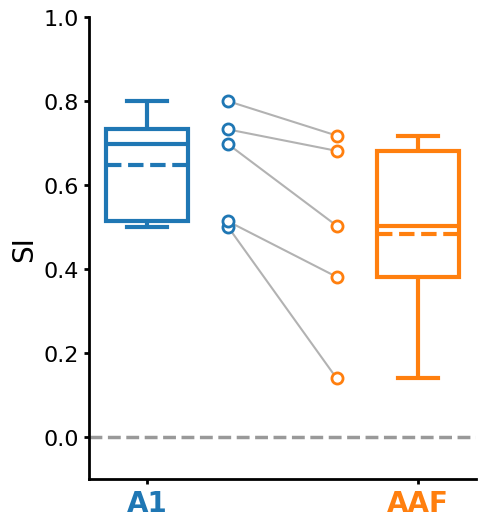

In [25]:
# Plot normalized stimulus-specific adaptation indices (SI) A1 vs AAF (preZX1)
import seaborn as sns
import lib.plotting as plotting

calcium_A1_AAF_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[2]]  # Blue for A1, orange for AAF
df_SI_calcium_halfSecISI_A1_AAF = df_resp_peak_calcium_halfSecISI[(df_resp_peak_calcium_halfSecISI['treatment'] == 'preZX1') & 
                                                                  (df_resp_peak_calcium_halfSecISI['id'] != '20251208')].copy()  # Exclude animal with only A1 identified

# Extract Deviant and Standard frequencies
df_SI_calcium_halfSecISI_A1_AAF[['dev_freq', 'std_freq']] = df_SI_calcium_halfSecISI_A1_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_halfSecISI_A1_AAF['Frequency'] = df_SI_calcium_halfSecISI_A1_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/subfield/frequency combination
df_SI_calcium_halfSecISI_A1_AAF = (
    df_SI_calcium_halfSecISI_A1_AAF
    .pivot_table(index=['id', 'subfield', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_calcium_halfSecISI_A1_AAF = (
    df_SI_calcium_halfSecISI_A1_AAF
    .groupby(['id', 'subfield'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_halfSecISI_A1_AAF, x='subfield', y='SI', id='id', 
                      palette=calcium_A1_AAF_palette, offset=0.3, Yaxis_range=(-0.1, 1))

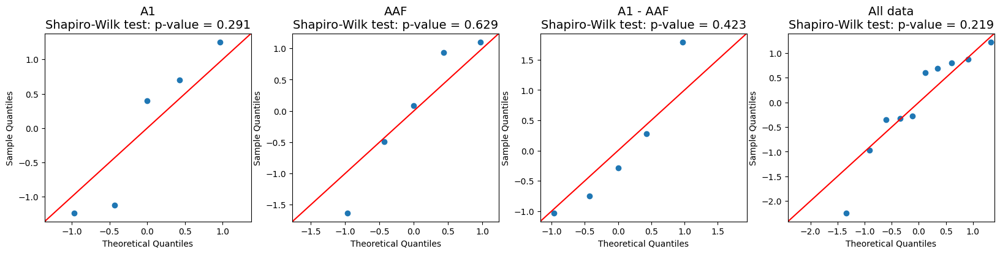

SI, A1 vs 0, one-sample t-test, p-value = 0.0004
SI, AAF vs 0, one-sample t-test, p-value = 0.0101
SI, A1 vs AAF, paired t-test, p-value = 0.0402


In [26]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each subfield paired by id
df_pivot = df_SI_calcium_halfSecISI_A1_AAF.pivot_table(index='id', columns='subfield', values='SI', sort=False)
group_label = df_pivot.columns.tolist()
groups = [df_pivot[col].to_numpy() for col in group_label]

# Create Q-Q plot to test normality of each subfield and the differences between A1 and AAF
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups[0], fit=True, line='45', ax=ax[0])
sm.qqplot(groups[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups[0]-groups[1], fit=True, line='45', ax=ax[2])
sm.qqplot(np.concatenate(groups), fit=True, line='45', ax=ax[3])
ax[0].set_title(f'{group_label[0]}\nShapiro-Wilk test: p-value = {shapiro(groups[0])[1]:.3f}', fontsize=14)
ax[1].set_title(f'{group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'{group_label[0]} - {group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[0]-groups[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'All data\nShapiro-Wilk test: p-value = {shapiro(np.concatenate(groups))[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 re subfield
print(f"SI, {group_label[0]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[0], 0)[1]:.4f}")
print(f"SI, {group_label[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[1], 0)[1]:.4f}")

# Paired t-test between A1 and AAF
print(f"SI, {group_label[0]} vs {group_label[1]}, paired t-test, p-value = {ttest_rel(groups[0], groups[1])[1]:.4f}")

### Figure 1I (response, A1 vs AAF, re stimulus)

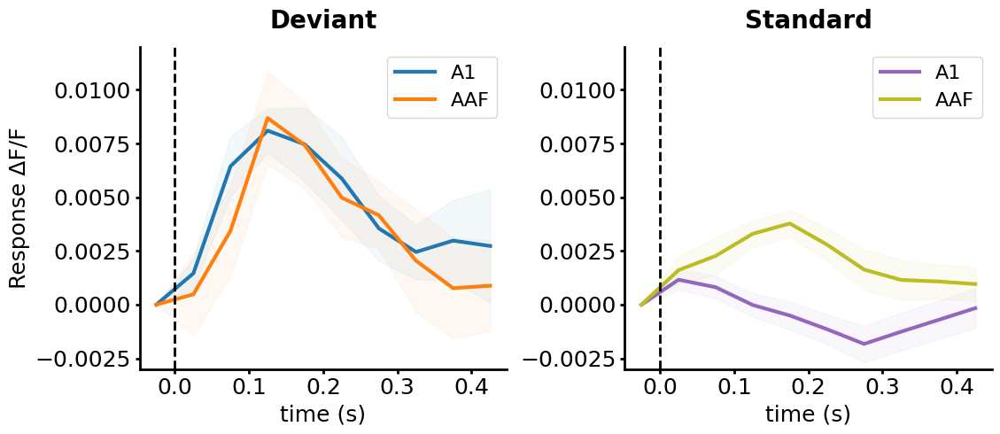

In [27]:
# Plot representative traces in A1 vs AAF re stimulus type (preZX1)
import seaborn as sns
import lib.plotting as plotting

df_resp_calcium_A1_AAF = df_resp_peak_calcium_halfSecISI[(df_resp_peak_calcium_halfSecISI['treatment'] == 'preZX1') & 
                                                         (df_resp_peak_calcium_halfSecISI['id'] != '20251208')].copy()  # Exclude animal with only A1 identified

# Extract Deviant and Standard frequencies
df_resp_calcium_A1_AAF[['dev_freq', 'std_freq']] = df_resp_calcium_A1_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_calcium_A1_AAF['Frequency'] = df_resp_calcium_A1_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_calcium_A1_AAF.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_calcium_A1_AAF = df_resp_calcium_A1_AAF[['id', 'subfield', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
calcium_trace_palette_A1_AAF = {('Deviant', 'A1'): sns.color_palette("tab20")[0], ('Deviant', 'AAF'): sns.color_palette("tab20")[2], 
                                ('Standard', 'A1'): sns.color_palette("tab20")[8], ('Standard', 'AAF'): sns.color_palette("tab20")[16]}

# Representative animal: 20251210, 16kHz
df_resp_calcium_A1_AAF_represent = df_resp_calcium_A1_AAF[
    (df_resp_calcium_A1_AAF['id'] == '20251210') & (df_resp_calcium_A1_AAF['Frequency'] == '16kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_A1_AAF_represent, trace_col='trace', x_col='stimulus', y_col=None, within_col='subfield', 
                                         color_palette=calcium_trace_palette_A1_AAF, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.003, 0.012), plot_errBar=True)

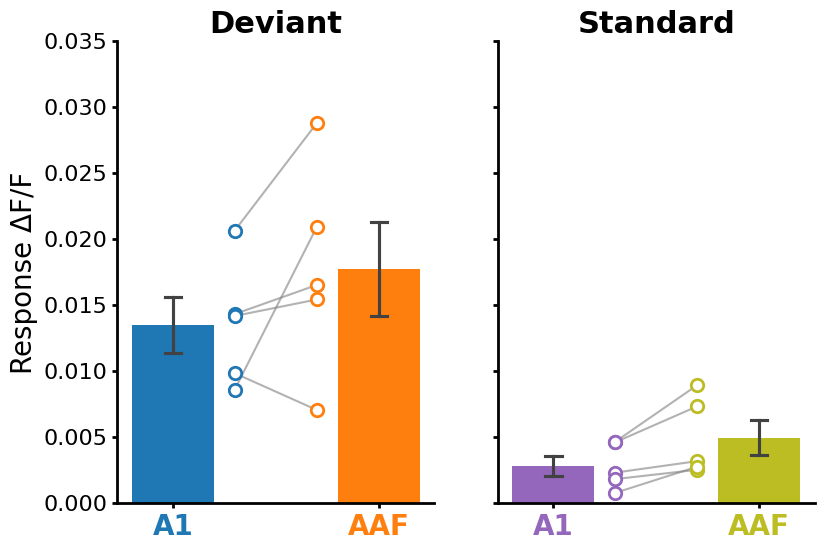

In [28]:
# Plot response amplitude in A1 vs AAF re stimulus type (preZX1)

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
calcium_resp_palette_A1_AAF = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[2], 
                               sns.color_palette("tab20")[8], sns.color_palette("tab20")[16]]

# Average across the two pulse protocols
df_resp_calcium_A1_AAF = (
    df_resp_calcium_A1_AAF
    .groupby(['id', 'subfield', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_calcium_A1_AAF, x='subfield', y='Response ΔF/F', group='stimulus', id='id', 
                      palette=calcium_resp_palette_A1_AAF, offset=0.3, Yaxis_range=(0, 0.035), title_color='k')

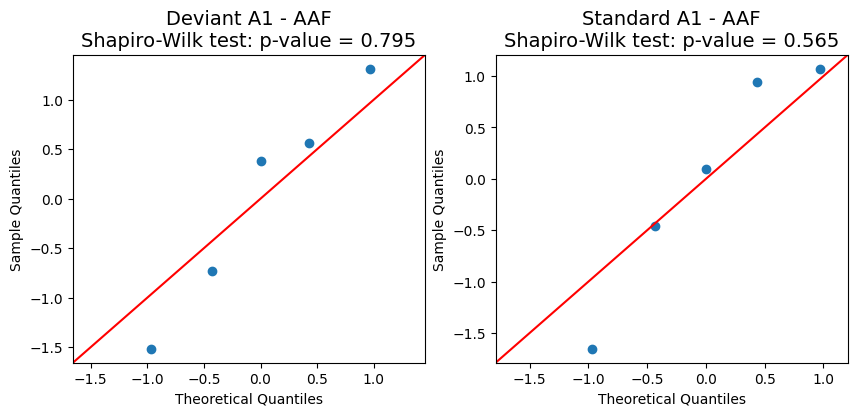

Response amplitude, Deviant A1 vs AAF, paired t-test, p-value = 0.1892
Response amplitude, Standard A1 vs AAF, paired t-test, p-value = 0.0324


In [29]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each subfield re stimulus paired by id
df_pivot_deviant = (
    df_resp_calcium_A1_AAF[df_resp_calcium_A1_AAF['stimulus'] == 'Deviant'].copy()
    .pivot_table(index='id', columns='subfield', values='Response ΔF/F', sort=False)
)
group_label_deviant = df_pivot_deviant.columns.tolist()
groups_deviant = [df_pivot_deviant[col].to_numpy() for col in group_label_deviant]

df_pivot_standard = (
    df_resp_calcium_A1_AAF[df_resp_calcium_A1_AAF['stimulus'] == 'Standard'].copy()
    .pivot_table(index='id', columns='subfield', values='Response ΔF/F', sort=False)
)
group_label_standard = df_pivot_standard.columns.tolist()
groups_standard = [df_pivot_standard[col].to_numpy() for col in group_label_standard]

# Create Q-Q plot to test normality of the differences between A1 and AAF re stimulus
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_deviant[0] - groups_deviant[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_standard[0] - groups_standard[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'Deviant {group_label_deviant[0]} - {group_label_deviant[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_deviant[0] - groups_deviant[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'Standard {group_label_standard[0]} - {group_label_standard[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_standard[0] - groups_standard[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between A1 and AAF re stimulus
print(f"Response amplitude, Deviant {group_label_deviant[0]} vs {group_label_deviant[1]}, paired t-test, p-value = {ttest_rel(groups_deviant[0], groups_deviant[1])[1]:.4f}")
print(f"Response amplitude, Standard {group_label_standard[0]} vs {group_label_standard[1]}, paired t-test, p-value = {ttest_rel(groups_standard[0], groups_standard[1])[1]:.4f}")

### Load oddball metadata and process (calcium, adaptation, A1 & AAF, 0.5s ISI)

In [30]:
import joblib
import pandas as pd
import numpy as np
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load data with both preZX1 and postZX1 conditions with 0.5s ISI
df_oddball_calcium_halfSecISI = joblib.load('../data/cache/oddball_calcium_halfSecISI.joblib')

# Exclude animal with old protocol to have more standard responses at the beginning
df_resp_calcium_halfSecISI_adapt = df_oddball_calcium_halfSecISI[df_oddball_calcium_halfSecISI['id'] != '20251110'].copy().reset_index(drop=True)

# Load deviant tone positions
deviant_pos_calcium_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]

# Calculate deviant/standard tone onset times
onset_times_calcium_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_calcium_temp = []

for (id, subfield), df_sub_calcium in df_resp_calcium_halfSecISI_adapt.groupby(['id', 'subfield'], sort=False): 
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium_halfSecISI_new, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_calcium['id'] = id
    df_resp_trace_calcium['subfield'] = subfield

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_calcium_halfSecISI_adapt = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_calcium_halfSecISI_adapt = df_resp_calcium_halfSecISI_adapt[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]

# Extract standard tone onset times before the first deviant tone
df_resp_calcium_halfSecISI_adapt['standard_times_pre'] = df_resp_calcium_halfSecISI_adapt.apply(
    lambda x: x['standard_times'][x['standard_times'] < x['deviant_times'][0]], 
    axis=1
)

# Have equal number of standard tones before the first deviant
min_pre = df_resp_calcium_halfSecISI_adapt['standard_times_pre'].apply(len).min()
df_resp_calcium_halfSecISI_adapt['common_standard_times'] = df_resp_calcium_halfSecISI_adapt['standard_times_pre'].apply(lambda x: x[:min_pre])

# Add indices of standard tone positions as: 0, 1, 2, ..., min_pre-1
df_resp_calcium_halfSecISI_adapt['standard_posIDX'] = [np.arange(min_pre)] * len(df_resp_calcium_halfSecISI_adapt)

# Get traces within each common standard response windows and store as 2D array of shape [toneNumber, frame]
df_resp_calcium_halfSecISI_adapt['trace'] = df_resp_calcium_halfSecISI_adapt.apply(
    lambda x: signalProcess.calc_train_peakDFF(x['avg_trace'], x['time'], x['common_standard_times'], 
                                               t_resp=(0, 0.475), initial_t_excl=None)[0],  # Do not exclude any initial responses
    axis=1
)

# Calculate peak amplitude within each response window
df_resp_calcium_halfSecISI_adapt['response'] = df_resp_calcium_halfSecISI_adapt.apply(
    lambda x: signalProcess.getBaseResp(x['trace'], signalProcess.getTimeVec(x['trace'].shape[1], delayAdjust = -0.025), 
                                        t_base = (-0.025, -0.025), t_resp = (0, 0.475))[1], 
    axis=1
)

# Convert negative traces and responses to NaNs
df_resp_calcium_halfSecISI_adapt['trace'] = df_resp_calcium_halfSecISI_adapt.apply(
    lambda x: np.where((x['response'] < 0)[:, np.newaxis], np.nan, x['trace']),
    axis=1
)
df_resp_calcium_halfSecISI_adapt['response'] = df_resp_calcium_halfSecISI_adapt['response'].apply(lambda x: np.where(x < 0, np.nan, x))

# Average across the two pulse protocols
df_resp_calcium_halfSecISI_adapt = (
    df_resp_calcium_halfSecISI_adapt
    .groupby(['id', 'subfield', 'treatment'], sort=False)
    .agg({'standard_posIDX': 'first', 
          'trace': lambda x: np.nanmean(np.stack(x), axis=0),
          'response': lambda x: np.nanmean(np.stack(x), axis=0)})
    .reset_index()
)
df_resp_calcium_halfSecISI_adapt.rename(columns={'standard_posIDX': 'Standard Tone Position Index', 'response': 'Response ΔF/F'}, inplace=True)

df_resp_calcium_halfSecISI_adapt

C:\Users\18440\AppData\Local\Temp\ipykernel_41456\2024809891.py:77: RuntimeWarning: Mean of empty slice
  'trace': lambda x: np.nanmean(np.stack(x), axis=0),
C:\Users\18440\AppData\Local\Temp\ipykernel_41456\2024809891.py:78: RuntimeWarning: Mean of empty slice
  'response': lambda x: np.nanmean(np.stack(x), axis=0)})


,id,subfield,treatment,Standard Tone Position Index,trace,Response ΔF/F
0,20251205,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.005602476902208536, 0.034078542023854...","[0.049367010961457104, 0.045567794343698946, 0..."
1,20251205,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0017613048407859686, 0.02591765717380...","[0.05362205890140892, 0.06092494317325987, 0.0..."
2,20251208,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, -0.0016725927248612742, 0.0165111087760...","[0.05624969712284041, 0.01537912222640755, 0.0..."
3,20251208,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, -0.0007228859804920198, 0.0100276484813...","[0.022969772622644415, 0.010186063499667712, 0..."
4,20251209,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, -0.0001460535278039383, 0.0170546618431...","[0.02671611398817088, 0.008913934146557494, 0...."
5,20251209,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, -0.00010017043215370248, 0.007471661722...","[0.012871958820950989, 0.01254643630876851, 0...."
6,20251210,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0008134957594574789, 0.01935099702188...","[0.04570522703149114, 0.014087218631829728, 0...."
7,20251210,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.003725101253893867, 0.013319832575592...","[0.01961211580223091, 0.002319007790299296, 0...."
8,20260121,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0011525363473834042, 0.00758460842624...","[0.030562718170969692, 0.0072752668194420115, ..."
9,20260121,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0010174207952625069, 0.00757686731311...","[0.022349960710841874, 0.005659747149105013, 0..."


### Figure 1J (average adaptation trace, A1 vs AAF)

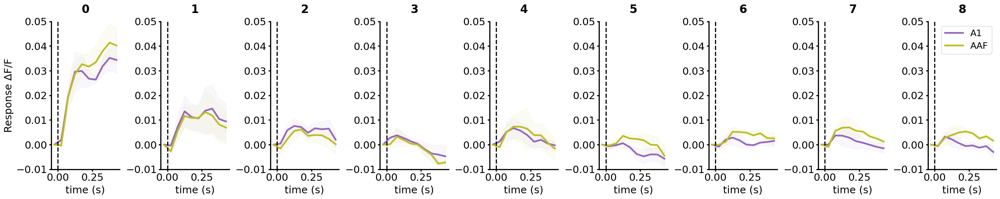

In [31]:
# Plot animal-averaged traces in response to standard tones before the first deviant tone (preZX1, A1 vs AAF)
import seaborn as sns
import lib.plotting as plotting

# Purple for A1 and olive yellow for AAF
calcium_halfSecISI_adapt_A1_AAF_dict = {'A1': sns.color_palette("tab20")[8], 'AAF': sns.color_palette("tab20")[16]}

df_resp_calcium_halfSecISI_adapt_pre = df_resp_calcium_halfSecISI_adapt[
    (df_resp_calcium_halfSecISI_adapt['treatment'] == 'preZX1') & 
    (df_resp_calcium_halfSecISI_adapt['id'] != '20251208')  # Exclude animal with only A1 identified
].copy()

# Transform the DataFrame to long format
standard_posIDX = df_resp_calcium_halfSecISI_adapt_pre['Standard Tone Position Index'].iloc[0]  # Constant across all rows

id = np.repeat(df_resp_calcium_halfSecISI_adapt_pre['id'].values, len(standard_posIDX))
subfield = np.repeat(df_resp_calcium_halfSecISI_adapt_pre['subfield'].values, len(standard_posIDX))
pos = np.tile(standard_posIDX, len(df_resp_calcium_halfSecISI_adapt_pre))
trace = np.vstack(df_resp_calcium_halfSecISI_adapt_pre['trace'].values)  # 2D array of shape [n_rows*n_pos, frame]

df_resp_calcium_halfSecISI_adapt_A1_AAF = pd.DataFrame({
    'id': id,
    'subfield': subfield,
    'Standard Tone Position Index': pos,
    'trace': list(trace),
})

# Average across animals re subfield/position combination
df_resp_calcium_halfSecISI_adapt_A1_AAF = (
    df_resp_calcium_halfSecISI_adapt_A1_AAF
    .groupby(['subfield', 'Standard Tone Position Index'], sort=False)
    .agg({'trace': lambda x: np.vstack(x.values)})
    .reset_index()
)

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_halfSecISI_adapt_A1_AAF, x_col='Standard Tone Position Index', y_col=None, within_col='subfield', 
                                         color_palette=calcium_halfSecISI_adapt_A1_AAF_dict, Yaxis_label='Response ΔF/F', Yaxis_range=(-0.01, 0.05), plot_errBar=True)

### Figure 1K (adaptation response, A1 vs AAF)

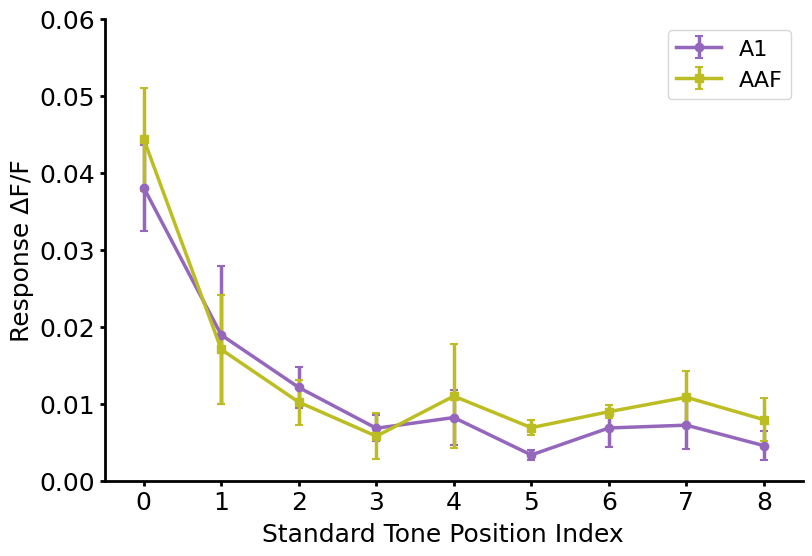

In [32]:
# Purple for A1 and olive yellow for AAF
calcium_halfSecISI_adapt_A1_AAF_palette = [sns.color_palette("tab20")[8], sns.color_palette("tab20")[16]]

plotting.plot_lineplot_adaptation(df_resp_calcium_halfSecISI_adapt_pre, x='Standard Tone Position Index', y='Response ΔF/F', 
                                  group='subfield', palette=calcium_halfSecISI_adapt_A1_AAF_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 0.06))

In [33]:
# Test significance of fixed-effect parameters (subfield and standard_posIDX) using mixed linear model regression
import statsmodels.formula.api as smf

df_mlm = df_resp_calcium_halfSecISI_adapt_pre.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Response ΔF/F': 'response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['response'] = df_mlm['response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['response'] = df_mlm['response'].astype(float)

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("response ~ subfield * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                  Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       response
No. Observations:         71            Method:                   REML    
No. Groups:               4             Scale:                    0.0001  
Min. group size:          17            Log-Likelihood:           201.0816
Max. group size:          18            Converged:                Yes     
Mean group size:          17.8                                            
--------------------------------------------------------------------------
                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------------
Intercept                        0.024    0.004  6.041 0.000  0.016  0.032
subfield[T.AAF]                  0.001    0.004  0.201 0.841 -0.008  0.010
standard_posIDX                 -0.003    0.001 -4.665 0.000 -0.004 -0.002
subfield[T.AAF]:standard_posIDX  0.000    0.

C:\Users\18440\AppData\Local\Temp\ipykernel_41456\3135083056.py:18: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


## Figure 2 (calcium, preZX1 vs postZX1, re subfield, 0.5s ISI)

### Reload oddball metadata and process (calcium, A1 & AAF, 0.5s ISI)

In [34]:
import joblib

df_pureTone_calcium = joblib.load('../data/cache/pureTone_calcium.joblib')
df_oddball_calcium_halfSecISI = joblib.load('../data/cache/oddball_calcium_halfSecISI.joblib')
df_oddball_calcium_halfSecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:56:06,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-2.1991250000000093, -2.1841250000000088, -2....",7.164625,"[-2.551842579610401, -2.529716971941504, -2.64...",7.339202,"[-0.03414472254137827, -0.03391182498524995, -...",0.111242,"[-0.042512381735019124, -0.04214378051844916, ...",0.122267,A1,20251110
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 18:58:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.5750624999999872, -0.15756249999999028, 0....",3.283688,"[-0.6852955178396201, -0.2655685881862908, -0....",3.338247,"[-0.00956394203633674, -0.0026204431989570666,...",0.054611,"[-0.012285658756706789, -0.004760989917521582,...",0.059847,A1,20251110
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:00:38,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.4103124999999892, -0.6053124999999895, -0....",7.177813,"[-0.45673847609643303, -0.6508005775894432, -0...",7.201729,"[-0.0066424845826565165, -0.009799308938770592...",0.116200,"[-0.0077912034958881994, -0.011101582197709068...",0.122850,A1,20251110
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-11-10 19:03:14,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.4840624999999932, 0.6603124999999892, 0.944...",2.718438,"[0.40828690388438815, 0.5860677240079326, 0.87...",2.755943,"[0.008132471609851253, 0.011093552299299973, 0...",0.045671,"[0.0072874293301130886, 0.010460602778915976, ...",0.049190,A1,20251110
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2025-11-10 19:56:44,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.3341250000000002, 0.4316250000000039, 0.460...",6.474750,"[0.26893521053096947, 0.36775217597479326, 0.3...",6.508333,"[0.005441697695676165, 0.00702962294918442, 0....",0.105450,"[0.0045936807569458135, 0.006281572765295533, ...",0.111169,A1,20251110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:02:32,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.9213749999999976, -0.6188749999999956, -0....",4.100500,"[-0.9698429000651103, -0.6663637505688413, -0....",4.127427,"[-0.017597303227007793, -0.01181986816943633, ...",0.078315,"[-0.018918287765719844, -0.012998456955306234,...",0.080512,AAF,20260121
130,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,postZX1,1340,2026-01-21 21:05:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",.

In [35]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_calcium_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20251110
deviant_pos_calcium_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_calcium_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_calcium_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_calcium_halfSecISI_all = {
    '20251110': onset_times_calcium_halfSecISI_old,

    '20251205': onset_times_calcium_halfSecISI_new,
    '20251208': onset_times_calcium_halfSecISI_new,
    '20251209': onset_times_calcium_halfSecISI_new,
    '20251210': onset_times_calcium_halfSecISI_new,
    '20260121': onset_times_calcium_halfSecISI_new,
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_calcium_temp = []

for (id, subfield), df_sub_calcium in df_oddball_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_calcium = onset_times_calcium_halfSecISI_all[id]
    
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_calcium['id'] = id
    df_resp_trace_calcium['subfield'] = subfield

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_trace_calcium_halfSecISI = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_trace_calcium_halfSecISI = df_resp_trace_calcium_halfSecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_calcium_halfSecISI

,id,subfield,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.012285658756706789, -0.004760989917521582...","[-0.00249911471329685, 0.002849806430697197, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.042512381735019124, -0.04214378051844916,...","[-0.025151792615453663, -0.026622681358079114,...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
2,20251110,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.024424126926125764, 0.02740615695068655, 0...","[0.012174498306397455, 0.019019366262969382, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
3,20251110,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.0045936807569458135, 0.006281572765295533,...","[-0.0027269210395723547, -0.004779366336754104...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
4,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.0018709092340910827, 0.003897177571842280...","[-0.02429638469955094, -0.02481373417961108, -...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
5,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.08631286666537263, -0.08417741382050307, ...","[-0.019565179355345647, -0.015677906177571522,...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
6,20251205,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.020892182324491203, 0.010397455974016201, ...","[0.011487082069957402, 0.010120693528975025, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
7,20251205,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.02001699654285302, -0.01695947131449592, ...","[0.010712621790874108, 0.01280267236354693, 0....","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
8,20251208,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.012042775059722552, 0.0196613606544929, 0....","[0.010861153623484578, 0.007402454319802712, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
9,20251208,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.08624389155799893, -0.08067994757607824, ...","[-0.026754219749238823, -0.025394437816520926,...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."


In [36]:
# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_calcium_temp = []

for (id, subfield), df_sub_calcium in df_resp_trace_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_calcium = signalProcess.add_oddball_respData(df_sub_calcium, t_resp=(0, 0.475))

    # Restore metadata columns
    df_resp_peak_calcium['id'] = id
    df_resp_peak_calcium['subfield'] = subfield

    df_resp_peak_calcium_temp.append(df_resp_peak_calcium)

df_resp_peak_calcium_halfSecISI = pd.concat(df_resp_peak_calcium_temp, ignore_index=True)
df_resp_peak_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_calcium_halfSecISI

,id,subfield,treatment,pulse,stimulus,trace,response
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318
2,20251110,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0030091325364793916, 0.0102642235556...",0.014429
3,20251110,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.0011540600780237387, 0.00629169129981...",0.008251
4,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0001977644519279842, 0.0030473702945...",0.005420
...,...,...,...,...,...,...,...
83,20260121,AAF,postZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0020725559712061054, 0.0053162027484...",0.020699
84,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0075839984492133555, -0.005943052641...",0.002959
85,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0010148533884228872, -0.000503588637...",0.002599
86,20260121,AAF,postZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.007111408581005049, -0.0048636579342...",0.000862


### Figure 2A (SI, preZX1 vs postZX1, re subfield)

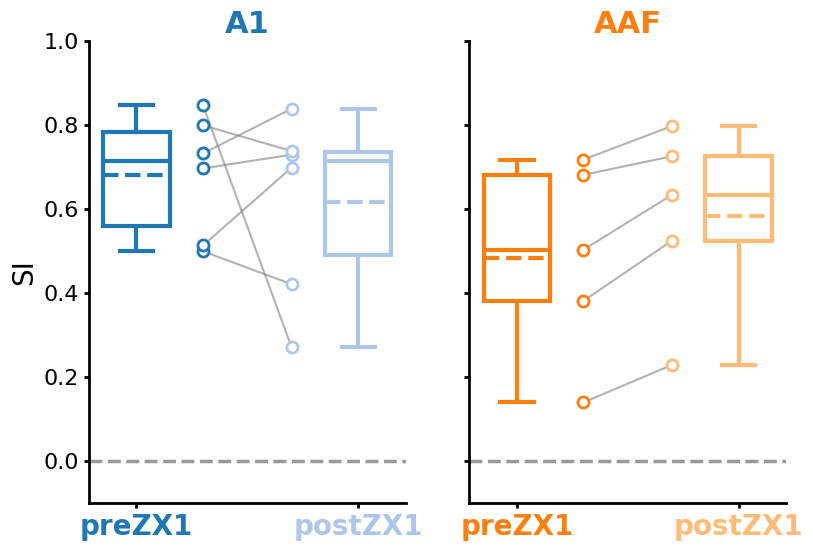

In [37]:
# Plot normalized stimulus-specific adaptation indices (SI) preZX1 vs postZX1 re subfield
import seaborn as sns
import lib.plotting as plotting

# Blue for A1, orange for AAF. Darker color for preZX1, lighter color for postZX1
calcium_prePost_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[1], 
                           sns.color_palette("tab20")[2], sns.color_palette("tab20")[3]]
# df_SI_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI[df_resp_peak_calcium_halfSecISI['id'] != '20251208'].copy()  # Exclude animal with only A1 identified
df_SI_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI.copy()

# Extract Deviant and Standard frequencies
df_SI_calcium_halfSecISI[['dev_freq', 'std_freq']] = df_SI_calcium_halfSecISI['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_halfSecISI['Frequency'] = df_SI_calcium_halfSecISI.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/subfield/treatment/frequency combination
df_SI_calcium_halfSecISI = (
    df_SI_calcium_halfSecISI
    .pivot_table(index=['id', 'subfield', 'treatment', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_calcium_halfSecISI = (
    df_SI_calcium_halfSecISI
    .groupby(['id', 'subfield', 'treatment'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_halfSecISI, x='treatment', y='SI', group='subfield', id='id', 
                      palette=calcium_prePost_palette, offset=0.3, Yaxis_range=(-0.1, 1))

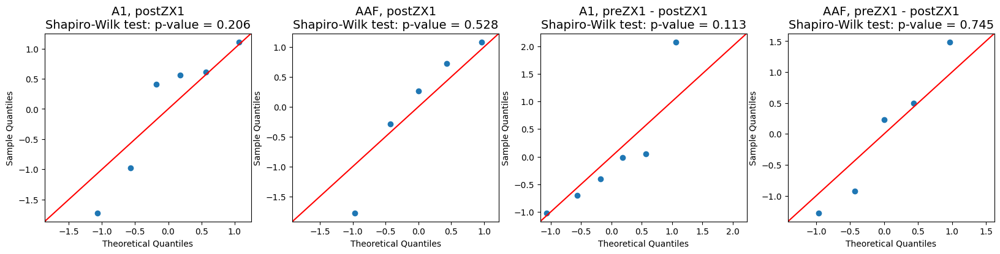

SI, A1, postZX1 vs 0, one-sample t-test, p-value = 0.0010
SI, AAF, postZX1 vs 0, one-sample t-test, p-value = 0.0042
SI, A1, preZX1 vs postZX1, paired t-test, p-value = 0.5789
SI, AAF, preZX1 vs postZX1, paired t-test, p-value = 0.0055


In [38]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each treatment paired by id re subfield
df_pivot_A1 = df_SI_calcium_halfSecISI[df_SI_calcium_halfSecISI['subfield'] == 'A1'].pivot_table(index='id', columns='treatment', values='SI', sort=False)
group_label_A1 = df_pivot_A1.columns.tolist()
groups_A1 = [df_pivot_A1[col].to_numpy() for col in group_label_A1]

df_pivot_AAF = df_SI_calcium_halfSecISI[df_SI_calcium_halfSecISI['subfield'] == 'AAF'].pivot_table(index='id', columns='treatment', values='SI', sort=False)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of postZX1 and the differences between preZX1 and postZX1 re subfield
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups_A1[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_AAF[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups_A1[0]-groups_A1[1], fit=True, line='45', ax=ax[2])
sm.qqplot(groups_AAF[0]-groups_AAF[1], fit=True, line='45', ax=ax[3])
ax[0].set_title(f'A1, {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'AAF, {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'A1, {group_label_A1[0]} - {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[0]-groups_A1[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'AAF, {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0]-groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 for postZX1 re subfield
print(f"SI, A1, {group_label_A1[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_A1[1], 0)[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_AAF[1], 0)[1]:.4f}")

# Paired t-test between preZX1 and postZX1 re subfield
print(f"SI, A1, {group_label_A1[0]} vs {group_label_A1[1]}, paired t-test, p-value = {ttest_rel(groups_A1[0], groups_A1[1])[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

### Figure 2B (response, preZX1 vs postZX1, re stimulus, AAF)

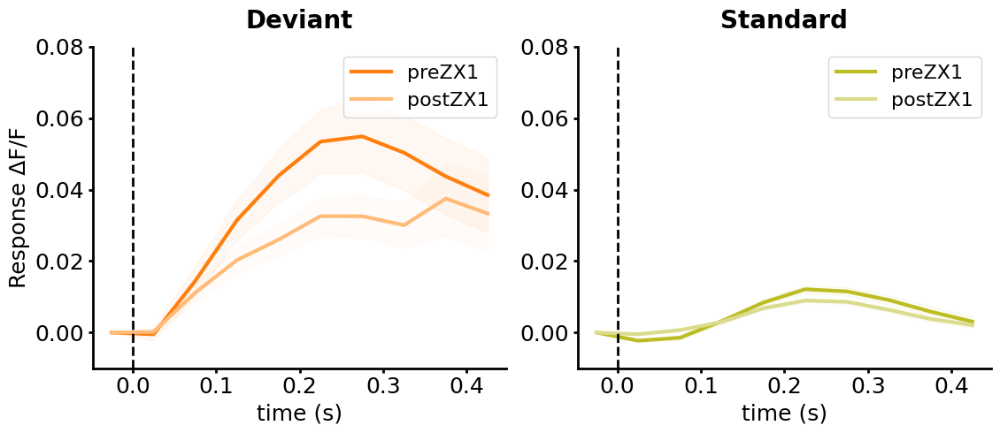

In [39]:
# Plot representative traces preZX1 vs postZX1 re stimulus type (AAF)
import seaborn as sns
import lib.plotting as plotting

df_resp_calcium_halfSecISI_AAF = df_resp_peak_calcium_halfSecISI[df_resp_peak_calcium_halfSecISI['subfield'] == 'AAF'].copy()

# Extract Deviant and Standard frequencies
df_resp_calcium_halfSecISI_AAF[['dev_freq', 'std_freq']] = df_resp_calcium_halfSecISI_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_calcium_halfSecISI_AAF['Frequency'] = df_resp_calcium_halfSecISI_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_calcium_halfSecISI_AAF.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_calcium_halfSecISI_AAF = df_resp_calcium_halfSecISI_AAF[['id', 'treatment', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Orange for Deviant and olive yellow for Standard, darker color for preZX1 and lighter color for postZX1
calcium_trace_palette_AAF = {('Deviant', 'preZX1'): sns.color_palette("tab20")[2], ('Deviant', 'postZX1'): sns.color_palette("tab20")[3],
                            ('Standard', 'preZX1'): sns.color_palette("tab20")[16], ('Standard', 'postZX1'): sns.color_palette("tab20")[17]}

# Representative animal: 20251110, 16kHz
df_resp_calcium_halfSecISI_AAF_represent = df_resp_calcium_halfSecISI_AAF[
    (df_resp_calcium_halfSecISI_AAF['id'] == '20251110') & (df_resp_calcium_halfSecISI_AAF['Frequency'] == '16kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_halfSecISI_AAF_represent, trace_col='trace', x_col='stimulus', y_col=None, within_col='treatment', 
                                         color_palette=calcium_trace_palette_AAF, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.01, 0.08), plot_errBar=True)

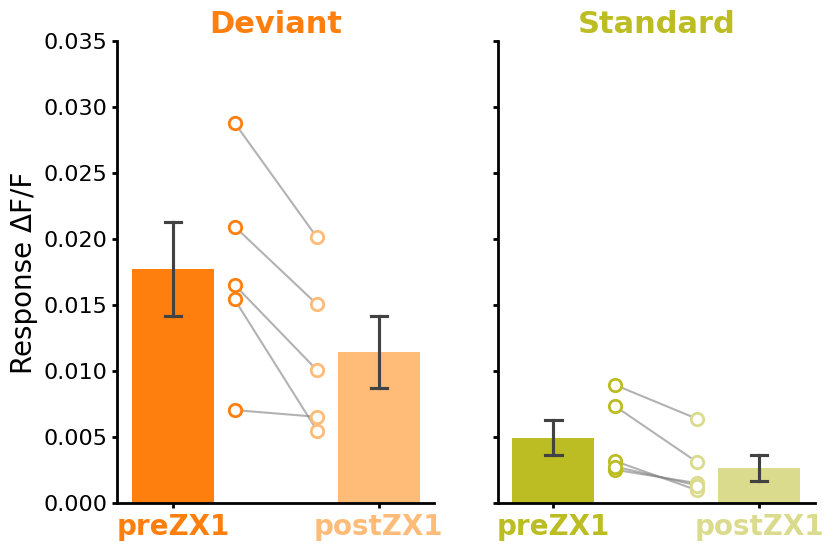

In [40]:
# Orange for Deviant and olive yellow for Standard, darker color for preZX1 and lighter color for postZX1
calcium_resp_palette_AAF = [sns.color_palette("tab20")[2], sns.color_palette("tab20")[3], 
                            sns.color_palette("tab20")[16], sns.color_palette("tab20")[17]]

# Average across the two pulse protocols
df_resp_calcium_halfSecISI_AAF = (
    df_resp_calcium_halfSecISI_AAF
    .groupby(['id', 'treatment', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_calcium_halfSecISI_AAF, x='treatment', y='Response ΔF/F', group='stimulus', 
                      id='id', palette=calcium_resp_palette_AAF, offset=0.3, Yaxis_range=(0, 0.035))

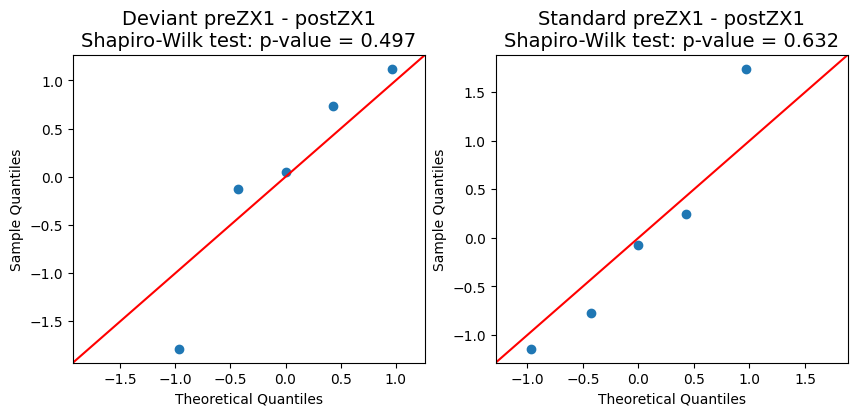

Response amplitude, Deviant preZX1 vs postZX1, paired t-test, p-value = 0.0178
Response amplitude, Standard preZX1 vs postZX1, paired t-test, p-value = 0.0148


In [41]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each treatment re stimulus paired by id
df_pivot_deviant = (
    df_resp_calcium_halfSecISI_AAF[df_resp_calcium_halfSecISI_AAF['stimulus'] == 'Deviant'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_deviant = df_pivot_deviant.columns.tolist()
groups_deviant = [df_pivot_deviant[col].to_numpy() for col in group_label_deviant]

df_pivot_standard = (
    df_resp_calcium_halfSecISI_AAF[df_resp_calcium_halfSecISI_AAF['stimulus'] == 'Standard'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_standard = df_pivot_standard.columns.tolist()
groups_standard = [df_pivot_standard[col].to_numpy() for col in group_label_standard]

# Create Q-Q plot to test normality of the differences between preZX1 and postZX1 re stimulus
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_deviant[0] - groups_deviant[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_standard[0] - groups_standard[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'Deviant {group_label_deviant[0]} - {group_label_deviant[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_deviant[0] - groups_deviant[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'Standard {group_label_standard[0]} - {group_label_standard[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_standard[0] - groups_standard[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between preZX1 and postZX1 re stimulus
print(f"Response amplitude, Deviant {group_label_deviant[0]} vs {group_label_deviant[1]}, paired t-test, p-value = {ttest_rel(groups_deviant[0], groups_deviant[1])[1]:.4f}")
print(f"Response amplitude, Standard {group_label_standard[0]} vs {group_label_standard[1]}, paired t-test, p-value = {ttest_rel(groups_standard[0], groups_standard[1])[1]:.4f}")

### Figure 2C (response percentage changed by ZX1, Deviant vs Standard, AAF)

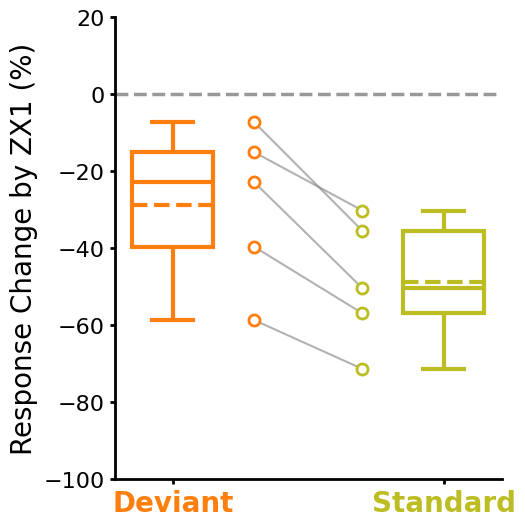

In [42]:
# Plot changed response amplitude relative to preZX1 ((postZX1-preZX1)/preZX1) Deviant vs Standard in AAF
import seaborn as sns
import lib.plotting as plotting

# Orange for AAF Deviant, olive yellow for AAF Standard
calcium_devStd_palette = [sns.color_palette("tab20")[2], sns.color_palette("tab20")[16]]
df_percent_calcium_halfSecISI_AAF = df_resp_peak_calcium_halfSecISI[df_resp_peak_calcium_halfSecISI['subfield'] == 'AAF'].copy()

# Extract Deviant and Standard frequencies
df_percent_calcium_halfSecISI_AAF[['dev_freq', 'std_freq']] = df_percent_calcium_halfSecISI_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_percent_calcium_halfSecISI_AAF['Frequency'] = df_percent_calcium_halfSecISI_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate relative response amplitude change re id/frequency/stimulus combination
df_percent_calcium_halfSecISI_AAF = (
    df_percent_calcium_halfSecISI_AAF
    .pivot_table(index=['id', 'Frequency', 'stimulus'], columns='treatment', values='response', sort=False)
    .assign(percentage_change=lambda df: 100 * (df['postZX1'] - df['preZX1']) / df['preZX1'])
    .reset_index()
)

# Average across the two frequencies
df_percent_calcium_halfSecISI_AAF = (
    df_percent_calcium_halfSecISI_AAF
    .groupby(['id', 'stimulus'], sort=False)['percentage_change']
    .mean()
    .reset_index()
)
df_percent_calcium_halfSecISI_AAF.rename(columns={'percentage_change': 'Response Change by ZX1 (%)'}, inplace=True)

plotting.plot_boxplot(df_percent_calcium_halfSecISI_AAF, x='stimulus', y='Response Change by ZX1 (%)', 
                      id='id', palette=calcium_devStd_palette, offset=0.3, Yaxis_range=(-100, 20), title_color='k')

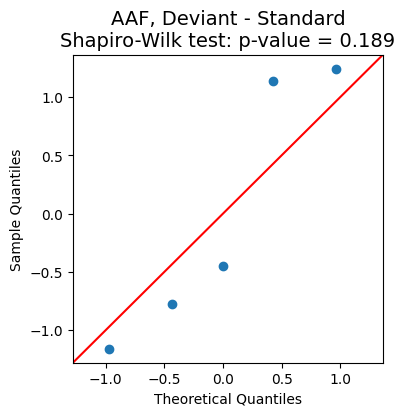

Response Change by ZX1 (%), AAF, Deviant vs Standard, paired t-test, p-value = 0.0034


In [43]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract Deviant and Standard response change percentage by ZX1 paired by id in AAF
df_pivot_AAF = (
    df_percent_calcium_halfSecISI_AAF.copy()
    .pivot_table(index='id', columns='stimulus', values='Response Change by ZX1 (%)', sort=False)
)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of the differences between Deviant and Standard
fig, ax = plt.subplots(figsize=(4, 4))
sm.qqplot(groups_AAF[0]-groups_AAF[1], fit=True, line='45', ax=ax)
ax.set_title(f'AAF, {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0]-groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between Deviant and Standard
print(f"Response Change by ZX1 (%), AAF, {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

### Figure 2D (response, preZX1 vs postZX1, re stimulus, A1)

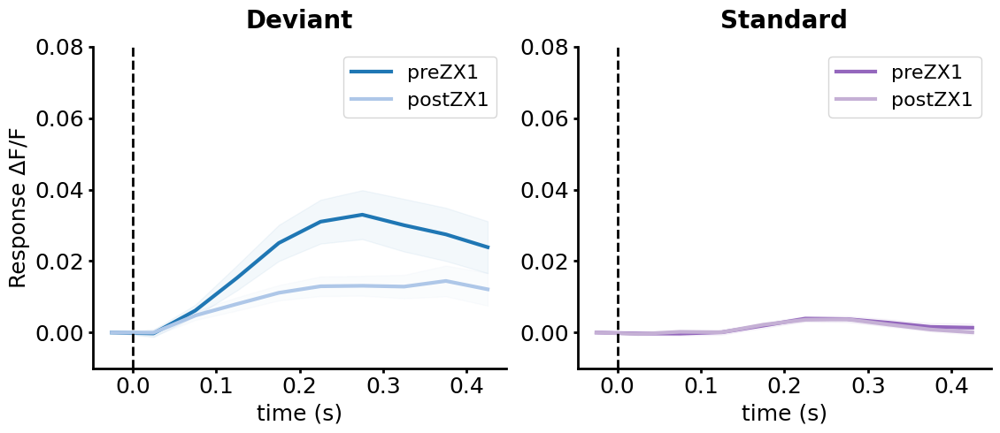

In [44]:
# Plot representative traces preZX1 vs postZX1 re stimulus type (A1)
import seaborn as sns
import lib.plotting as plotting

df_resp_calcium_halfSecISI_A1 = df_resp_peak_calcium_halfSecISI[df_resp_peak_calcium_halfSecISI['subfield'] == 'A1'].copy()

# Extract Deviant and Standard frequencies
df_resp_calcium_halfSecISI_A1[['dev_freq', 'std_freq']] = df_resp_calcium_halfSecISI_A1['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_calcium_halfSecISI_A1['Frequency'] = df_resp_calcium_halfSecISI_A1.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_calcium_halfSecISI_A1.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_calcium_halfSecISI_A1 = df_resp_calcium_halfSecISI_A1[['id', 'treatment', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Blue for Deviant and purple for Standard, darker color for preZX1 and lighter color for postZX1
calcium_trace_palette_A1 = {('Deviant', 'preZX1'): sns.color_palette("tab20")[0], ('Deviant', 'postZX1'): sns.color_palette("tab20")[1],
                            ('Standard', 'preZX1'): sns.color_palette("tab20")[8], ('Standard', 'postZX1'): sns.color_palette("tab20")[9]}

# Representative animal: 20251110, 16kHz
df_resp_calcium_halfSecISI_A1_represent = df_resp_calcium_halfSecISI_A1[
    (df_resp_calcium_halfSecISI_A1['id'] == '20251110') & (df_resp_calcium_halfSecISI_A1['Frequency'] == '16kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_halfSecISI_A1_represent, trace_col='trace', x_col='stimulus', y_col=None, within_col='treatment', 
                                         color_palette=calcium_trace_palette_A1, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.01, 0.08), plot_errBar=True)

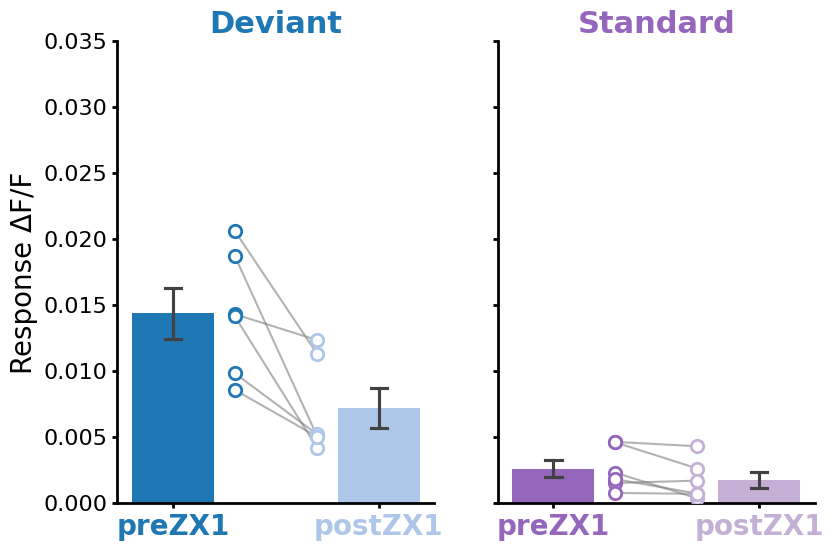

In [45]:
# Plot response amplitude preZX1 vs postZX1 for Deviant and Standard re subfield

# Blue for Deviant and purple for Standard, darker color for preZX1 and lighter color for postZX1
calcium_resp_palette_A1 = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[1], 
                           sns.color_palette("tab20")[8], sns.color_palette("tab20")[9]]

# Average across the two pulse protocols
df_resp_calcium_halfSecISI_A1 = (
    df_resp_calcium_halfSecISI_A1
    .groupby(['id', 'treatment', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_calcium_halfSecISI_A1, x='treatment', y='Response ΔF/F', group='stimulus', 
                      id='id', palette=calcium_resp_palette_A1, offset=0.3, Yaxis_range=(0, 0.035))

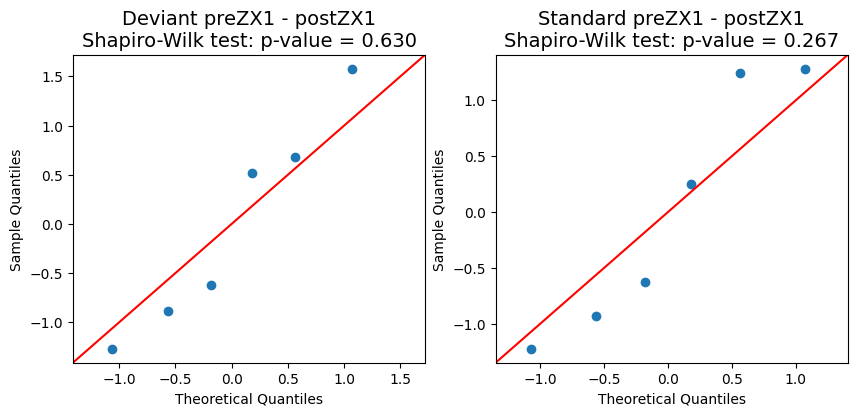

Response amplitude, Deviant preZX1 vs postZX1, paired t-test, p-value = 0.0113
Response amplitude, Standard preZX1 vs postZX1, paired t-test, p-value = 0.0729


In [46]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each treatment re stimulus paired by id
df_pivot_deviant = (
    df_resp_calcium_halfSecISI_A1[df_resp_calcium_halfSecISI_A1['stimulus'] == 'Deviant'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_deviant = df_pivot_deviant.columns.tolist()
groups_deviant = [df_pivot_deviant[col].to_numpy() for col in group_label_deviant]

df_pivot_standard = (
    df_resp_calcium_halfSecISI_A1[df_resp_calcium_halfSecISI_A1['stimulus'] == 'Standard'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_standard = df_pivot_standard.columns.tolist()
groups_standard = [df_pivot_standard[col].to_numpy() for col in group_label_standard]

# Create Q-Q plot to test normality of the differences between preZX1 and postZX1 re stimulus
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_deviant[0] - groups_deviant[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_standard[0] - groups_standard[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'Deviant {group_label_deviant[0]} - {group_label_deviant[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_deviant[0] - groups_deviant[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'Standard {group_label_standard[0]} - {group_label_standard[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_standard[0] - groups_standard[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between preZX1 and postZX1 re stimulus
print(f"Response amplitude, Deviant {group_label_deviant[0]} vs {group_label_deviant[1]}, paired t-test, p-value = {ttest_rel(groups_deviant[0], groups_deviant[1])[1]:.4f}")
print(f"Response amplitude, Standard {group_label_standard[0]} vs {group_label_standard[1]}, paired t-test, p-value = {ttest_rel(groups_standard[0], groups_standard[1])[1]:.4f}")

### Figure 2E (adaptation response, preZX1 vs postZX1, AAF)

#### Raw

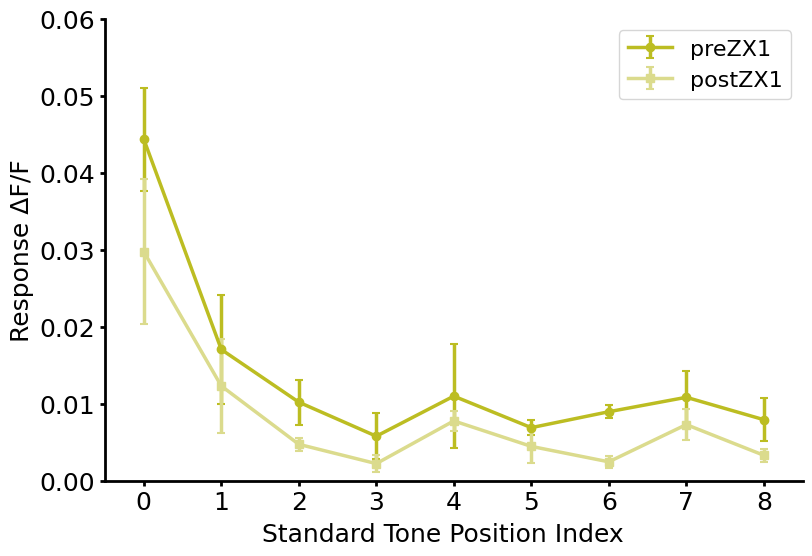

In [47]:
# AAF, preZX1 vs postZX1
import seaborn as sns
import lib.plotting as plotting

# Olive yellow for AAF, darker color for preZX1 and lighter color for postZX1
calcium_halfSecISI_adapt_AAF_palette = [sns.color_palette("tab20")[16], sns.color_palette("tab20")[17]]
df_resp_calcium_halfSecISI_adapt_AAF = df_resp_calcium_halfSecISI_adapt[df_resp_calcium_halfSecISI_adapt['subfield'] == 'AAF'].copy()

plotting.plot_lineplot_adaptation(df_resp_calcium_halfSecISI_adapt_AAF, x='Standard Tone Position Index', y='Response ΔF/F', 
                                  group='treatment', palette=calcium_halfSecISI_adapt_AAF_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 0.06))

In [48]:
# Test significance of fixed-effect parameters (treatment and standard_posIDX) using mixed linear model regression (AAF)
import statsmodels.formula.api as smf

df_mlm = df_resp_calcium_halfSecISI_adapt_AAF.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Response ΔF/F': 'response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['response'] = df_mlm['response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['response'] = df_mlm['response'].astype(float)

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("response ~ treatment * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                    Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         response
No. Observations:         70              Method:                     REML    
No. Groups:               4               Scale:                      0.0001  
Min. group size:          17              Log-Likelihood:             196.8272
Max. group size:          18              Converged:                  Yes     
Mean group size:          17.5                                                
------------------------------------------------------------------------------
                                    Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------
Intercept                            0.016    0.004  4.466 0.000  0.009  0.024
treatment[T.preZX1]                  0.008    0.005  1.850 0.064 -0.001  0.017
standard_posIDX                     -0.002    0.001 -3.048 0.002 -0.003 -

C:\Users\18440\AppData\Local\Temp\ipykernel_41456\538219138.py:18: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


#### Normalized

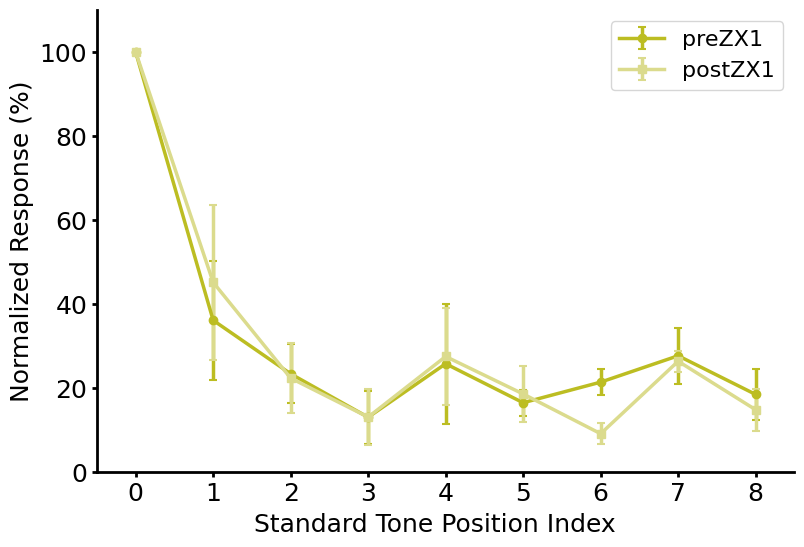

In [49]:
# Normalize to the first standard response for both preZX1 and postZX1
df_resp_calcium_halfSecISI_adapt_norm = df_resp_calcium_halfSecISI_adapt.copy()
df_resp_calcium_halfSecISI_adapt_norm['Normalized Response (%)'] = df_resp_calcium_halfSecISI_adapt_norm['Response ΔF/F'].apply(lambda x: x / x[0] * 100)

# AAF, preZX1 vs postZX1
# Olive yellow for AAF, darker color for preZX1 and lighter color for postZX1
calcium_halfSecISI_adapt_AAF_palette = [sns.color_palette("tab20")[16], sns.color_palette("tab20")[17]]
df_resp_calcium_halfSecISI_adapt_norm_AAF = df_resp_calcium_halfSecISI_adapt_norm[df_resp_calcium_halfSecISI_adapt_norm['subfield'] == 'AAF'].copy()

plotting.plot_lineplot_adaptation(df_resp_calcium_halfSecISI_adapt_norm_AAF, x='Standard Tone Position Index', y='Normalized Response (%)', 
                                  group='treatment', palette=calcium_halfSecISI_adapt_AAF_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 110))

In [50]:
# Test significance of fixed-effect parameters (treatment and standard_posIDX) using mixed linear model regression (AAF)
df_mlm = df_resp_calcium_halfSecISI_adapt_norm_AAF.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Normalized Response (%)': 'norm_response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['norm_response'] = df_mlm['norm_response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'norm_response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['norm_response'] = df_mlm['norm_response'].astype(float)

# Skip the first standard response
df_mlm = df_mlm[df_mlm['standard_posIDX'] != 0]

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("norm_response ~ treatment * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                     Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       norm_response
No. Observations:         62            Method:                   REML         
No. Groups:               4             Scale:                    267.1007     
Min. group size:          15            Log-Likelihood:           -254.8958    
Max. group size:          16            Converged:                Yes          
Mean group size:          15.5                                                 
-------------------------------------------------------------------------------
                                    Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
-------------------------------------------------------------------------------
Intercept                           33.318    7.306  4.560 0.000  18.999 47.638
treatment[T.preZX1]                 -5.329    9.057 -0.588 0.556 -23.081 12.423
standard_posIDX                     -2.522    1.262 -1.999 0.

### Figure 2F (adaptation response, preZX1 vs postZX1, A1)

#### Raw

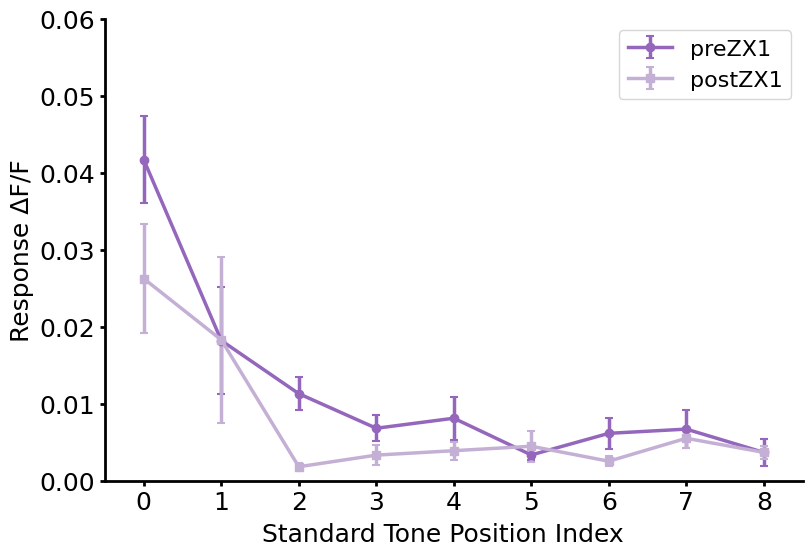

In [51]:
# A1, preZX1 vs postZX1
import seaborn as sns
import lib.plotting as plotting

# Purple for A1, darker color for preZX1 and lighter color for postZX1
calcium_halfSecISI_adapt_A1_palette = [sns.color_palette("tab20")[8], sns.color_palette("tab20")[9]]
df_resp_calcium_halfSecISI_adapt_A1 = df_resp_calcium_halfSecISI_adapt[df_resp_calcium_halfSecISI_adapt['subfield'] == 'A1'].copy()

plotting.plot_lineplot_adaptation(df_resp_calcium_halfSecISI_adapt_A1, x='Standard Tone Position Index', y='Response ΔF/F', 
                                  group='treatment', palette=calcium_halfSecISI_adapt_A1_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 0.06))

In [52]:
# Test significance of fixed-effect parameters (treatment and standard_posIDX) using mixed linear model regression (A1)
import statsmodels.formula.api as smf

df_mlm = df_resp_calcium_halfSecISI_adapt_A1.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Response ΔF/F': 'response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['response'] = df_mlm['response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['response'] = df_mlm['response'].astype(float)

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("response ~ treatment * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                    Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         response
No. Observations:         86              Method:                     REML    
No. Groups:               5               Scale:                      0.0001  
Min. group size:          16              Log-Likelihood:             249.9662
Max. group size:          18              Converged:                  Yes     
Mean group size:          17.2                                                
------------------------------------------------------------------------------
                                    Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------
Intercept                            0.017    0.004  4.784 0.000  0.010  0.024
treatment[T.preZX1]                  0.009    0.004  2.239 0.025  0.001  0.016
standard_posIDX                     -0.002    0.001 -3.800 0.000 -0.003 -

C:\Users\18440\AppData\Local\Temp\ipykernel_41456\2564086132.py:18: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


#### Normalized

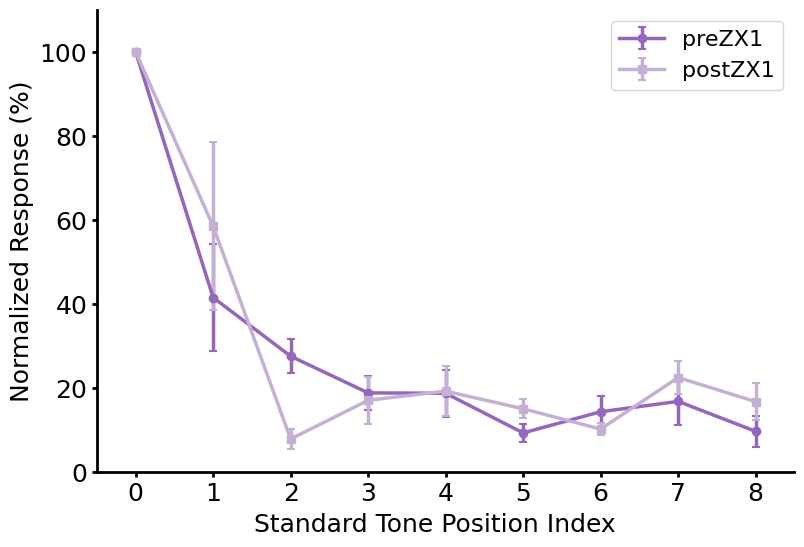

In [53]:
# Normalize to the first standard response for both preZX1 and postZX1
df_resp_calcium_halfSecISI_adapt_norm = df_resp_calcium_halfSecISI_adapt.copy()
df_resp_calcium_halfSecISI_adapt_norm['Normalized Response (%)'] = df_resp_calcium_halfSecISI_adapt_norm['Response ΔF/F'].apply(lambda x: x / x[0] * 100)

# A1, preZX1 vs postZX1
# Purple for A1, darker color for preZX1 and lighter color for postZX1
calcium_halfSecISI_adapt_A1_palette = [sns.color_palette("tab20")[8], sns.color_palette("tab20")[9]]
df_resp_calcium_halfSecISI_adapt_norm_A1 = df_resp_calcium_halfSecISI_adapt_norm[df_resp_calcium_halfSecISI_adapt_norm['subfield'] == 'A1'].copy()

plotting.plot_lineplot_adaptation(df_resp_calcium_halfSecISI_adapt_norm_A1, x='Standard Tone Position Index', y='Normalized Response (%)', 
                                  group='treatment', palette=calcium_halfSecISI_adapt_A1_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 110))

In [54]:
# Test significance of fixed-effect parameters (treatment and standard_posIDX) using mixed linear model regression (A1)
df_mlm = df_resp_calcium_halfSecISI_adapt_norm_A1.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Normalized Response (%)': 'norm_response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['norm_response'] = df_mlm['norm_response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'norm_response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['norm_response'] = df_mlm['norm_response'].astype(float)

# Skip the first standard response
df_mlm = df_mlm[df_mlm['standard_posIDX'] != 0]

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("norm_response ~ treatment * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                     Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       norm_response
No. Observations:         76            Method:                   REML         
No. Groups:               5             Scale:                    311.3102     
Min. group size:          14            Log-Likelihood:           -319.1886    
Max. group size:          16            Converged:                Yes          
Mean group size:          15.2                                                 
-------------------------------------------------------------------------------
                                    Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
-------------------------------------------------------------------------------
Intercept                           35.081    6.646  5.279 0.000  22.056 48.106
treatment[T.preZX1]                  0.934    8.893  0.105 0.916 -16.497 18.365
standard_posIDX                     -3.043    1.232 -2.470 0.

## Figure 3 (zinc, Deviant vs Standard, 0.5s ISI)

### Load oddball metadata and process (zinc, A1, 0.5s ISI)

In [55]:
# Initialize experiment group object of all animals with 0.5s ISI
import lib.experiment_oop as exp

# Define path
dPaths_zinc = [
    # A1 and AAF identified (select A1)
    common_path_oddball + r"\20250527\AA0001\Oddball", 
    common_path_oddball + r"\20250530\AA0001\Oddball", 
    common_path_oddball + r"\20250626\AA0001\Oddball", 
    common_path_oddball + r"\20251205\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251209\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260107\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\GRISZ\Oddball_0.5secISI", 
    # A1 and AAF not identified
    common_path_oddball + r"\20250624\AA0001\Oddball"
]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.3, 5.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_zinc = exp.ExperimentGroup(dPaths_zinc, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_zinc.load_qcam_data()

# Process qcam files with saved ROI
cutoff_freq = 2  # Cutoff frequency of low-pass Butterworth filter
group_zinc.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_A1')

# Extract pure tone trials
df_pureTone_zinc_all = group_zinc.df[group_zinc.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_zinc_all = df_pureTone_zinc_all[df_pureTone_zinc_all.valid]  # Exclude negative responses caused by motion artifacts
df_pureTone_zinc_all['id'] = df_pureTone_zinc_all['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID

# Extract oddball trials
df_oddball_zinc_all = group_zinc.df[group_zinc.df['pulse'].str.contains('oddball')].copy()
df_oddball_zinc_all['id'] = df_oddball_zinc_all['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_zinc_all

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c


,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,id
14,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:49:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.4862628118723364, 1.2024119053436948, 0.958...",1.838954,"[0.02688175718235205, 0.01734076950946439, 0.0...",0.029724,"[0.023641160941593273, 0.014050061154549645, 0...",0.033149,"[0.023523174474850795, 0.019030648425096323, 0...",0.029105,True,20250527
15,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:52:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.3513213801578345, 1.1990024472897858, 1.060...",1.264276,"[0.023909856816270014, 0.020137924978471205, 0...",0.022822,"[0.02181959201462254, 0.018036529256677928, 0....",0.025397,"[0.021929781603856516, 0.01945788929091269, 0....",0.020517,True,20250527
16,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:56:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[2.088999046195042, 1.7341610323763348, 1.4092...",1.322428,"[0.03707141733643799, 0.02533398312099213, 0.0...",0.023385,"[0.03493840014174903, 0.023127825199117855, 0....",0.025714,"[0.03484952873346583, 0.028929977175591915, 0....",0.022061,True,20250527
17,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:58:40,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.8591252003797933, 1.8070294785606293, 1.750...",1.225424,"[0.045051477684989724, 0.044447933859780075, 0...",0.014864,"[0.03082937842581293, 0.030691800329629836, 0....",0.021299,"[0.030862389291297494, 0.029997574782373762, 0...",0.020343,True,20250527
18,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 19:00:09,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.1733324227780173, -0.10273870070031421, -0...",0.613085,"[-0.0022638775695011625, 0.0001970905178153266...",0.012395,"[-0.0030335058568100376, -0.000543765442959254...",0.012906,"[-0.0029707185242181158, -0.001760823257604818...",0.010508,True,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:03:08,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.11117860166746141, 0.19877897323891602, 0....",1.073707,"[0.03480235890758307, 0.029730682176350474, 0....",0.000676,"[-0.00040011320379463894, 0.003472868640615474...",0.005677,"[-0.0004114884383527448, 0.0007357103619642176...",0.003974,True,20260121
223,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:05:52,"(

In [ ]:
import joblib
# joblib.dump(df_pureTone_zinc_all, '../data/cache/pureTone_zinc_all.joblib')
# joblib.dump(df_oddball_zinc_all, '../data/cache/oddball_zinc_all.joblib')

df_pureTone_zinc_all = joblib.load('../data/cache/pureTone_zinc_all.joblib')
df_oddball_zinc_all = joblib.load('../data/cache/oddball_zinc_all.joblib')
df_oddball_zinc_all

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,id
14,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:49:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.4862628118723364, 1.2024119053436948, 0.958...",1.838954,"[0.02688175718235205, 0.01734076950946439, 0.0...",0.029724,"[0.023641160941593273, 0.014050061154549645, 0...",0.033149,"[0.023523174474850795, 0.019030648425096323, 0...",0.029105,True,20250527
15,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:52:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.3513213801578345, 1.1990024472897858, 1.060...",1.264276,"[0.023909856816270014, 0.020137924978471205, 0...",0.022822,"[0.02181959201462254, 0.018036529256677928, 0....",0.025397,"[0.021929781603856516, 0.01945788929091269, 0....",0.020517,True,20250527
16,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:56:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[2.088999046195042, 1.7341610323763348, 1.4092...",1.322428,"[0.03707141733643799, 0.02533398312099213, 0.0...",0.023385,"[0.03493840014174903, 0.023127825199117855, 0....",0.025714,"[0.03484952873346583, 0.028929977175591915, 0....",0.022061,True,20250527
17,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:58:40,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.8591252003797933, 1.8070294785606293, 1.750...",1.225424,"[0.045051477684989724, 0.044447933859780075, 0...",0.014864,"[0.03082937842581293, 0.030691800329629836, 0....",0.021299,"[0.030862389291297494, 0.029997574782373762, 0...",0.020343,True,20250527
18,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 19:00:09,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.1733324227780173, -0.10273870070031421, -0...",0.613085,"[-0.0022638775695011625, 0.0001970905178153266...",0.012395,"[-0.0030335058568100376, -0.000543765442959254...",0.012906,"[-0.0029707185242181158, -0.001760823257604818...",0.010508,True,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:03:08,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.11117860166746141, 0.19877897323891602, 0....",1.073707,"[0.03480235890758307, 0.029730682176350474, 0....",0.000676,"[-0.00040011320379463894, 0.003472868640615474...",0.005677,"[-0.0004114884383527448, 0.0007357103619642176...",0.003974,True,20260121
223,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:05:52,"(

In [57]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_zinc_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20250527, 20250530, 20250624, 20250626
deviant_pos_zinc_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_zinc_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_zinc_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_zinc_all = {
    '20250527': onset_times_zinc_halfSecISI_old,
    '20250530': onset_times_zinc_halfSecISI_old,
    '20250624': onset_times_zinc_halfSecISI_old,
    '20250626': onset_times_zinc_halfSecISI_old,

    '20251205': onset_times_zinc_halfSecISI_new,
    '20251209': onset_times_zinc_halfSecISI_new,
    '20251210': onset_times_zinc_halfSecISI_new, 
    '20260107': onset_times_zinc_halfSecISI_new,
    '20260121': onset_times_zinc_halfSecISI_new,
}

# Calculate averaged whole traces re id
df_resp_trace_zinc_temp = []

for id, df_sub_zinc in df_oddball_zinc_all.groupby('id', sort=False):
    onset_times_zinc = onset_times_zinc_all[id]
    
    df_resp_trace_zinc = plotting.plot_oddball_wholeTrace(
        df_sub_zinc, onset_times_zinc, 
        resp_col='dFF_ROI_logFilt_butterFilt', 
        negative_exclude=True,  # Exclude windows of negative responses
        t_resp=(0.3, 0.475),  # Skip first 300ms after tone onset to avoid motion artifacts
        plot_traces=False
    )

    # restore id column
    df_resp_trace_zinc['id'] = id

    df_resp_trace_zinc_temp.append(df_resp_trace_zinc)

df_resp_trace_zinc_all = pd.concat(df_resp_trace_zinc_temp, ignore_index=True)
df_resp_trace_zinc_all = df_resp_trace_zinc_all[['id', 'treatment', 'pulse', 'time', 'individual_traces', 
                                                 'avg_trace', 'deviant_times', 'standard_times']]
df_resp_trace_zinc_all

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Igno

,id,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20250527,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.023523174474850795, 0.019030648425096323, ...","[0.006615163493555691, 0.005195818670579684, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
1,20250527,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.021929781603856516, 0.01945788929091269, 0...","[0.009067199137709342, 0.008449719874394121, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
2,20250530,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.010975274256050974, 0.010661358347304828, ...","[0.004969759589212038, 0.004410782217380195, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
3,20250530,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.01547234714460456, 0.015571119055994573, 0...","[0.009390250922010773, 0.008699220311000011, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
4,20250624,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.0023102051039278594, -0.00137863625481409...","[-0.0015042578795162488, -0.000734763811416642...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
5,20250624,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.004492770858687913, 0.002559733874256165, ...","[-0.0011035666508360034, -0.00114360282950203,...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
6,20250624,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.0023454625114197355, 0.002314773537971912,...","[0.001506532210617216, 0.0007224064466497387, ...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
7,20250624,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.0004412915418224428, -9.30943083584656e-0...","[0.0027252368758276754, 0.003266365560669785, ...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
8,20250626,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.008402733373856193, 0.004318815537408918, ...","[0.009072616709707207, 0.008009229789358686, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
9,20250626,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.02173609831282732, 0.019993204115728705, 0...","[0.008961733637062845, 0.007958930717388091, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."


In [58]:
# Calculate deviant/standard peak response re id
df_resp_peak_zinc_temp = []

for id, df_sub_zinc in df_resp_trace_zinc_all.groupby('id', sort=False):
    df_resp_peak_zinc = signalProcess.add_oddball_respData(df_sub_zinc, t_resp=(0.3, 0.475))

    # restore id column
    df_resp_peak_zinc['id'] = id

    df_resp_peak_zinc_temp.append(df_resp_peak_zinc)

df_resp_peak_zinc_all = pd.concat(df_resp_peak_zinc_temp, ignore_index=True)
df_resp_peak_zinc_all = df_resp_peak_zinc_all[['id', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_zinc_all

,id,treatment,pulse,stimulus,trace,response
0,20250527,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -8.082466640273699e-06, 2.5865094060192...",0.002021
1,20250527,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -3.234155468967784e-05, -0.000100369164...",0.000632
2,20250527,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, 0.00013316896939138696, 0.0003070954323...",0.000572
3,20250527,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.0003618788181888122, 0.00082284772190...",0.000661
4,20250530,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.00019871321392279223, 0.0003476497167...",0.000737
5,20250530,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.00014375328415751126, 0.0002742704173...",0.000815
6,20250530,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -4.663620128505429e-05, -7.640634347871...",0.000479
7,20250530,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.0001673917961041755, 0.00032389694295...",0.000634
8,20250624,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0003067210130271352, 0.00062451116556...",0.001506
9,20250624,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 3.964409104309811e-05, 0.00023196267334...",0.001494


### Figure 3B (representative whole trace)

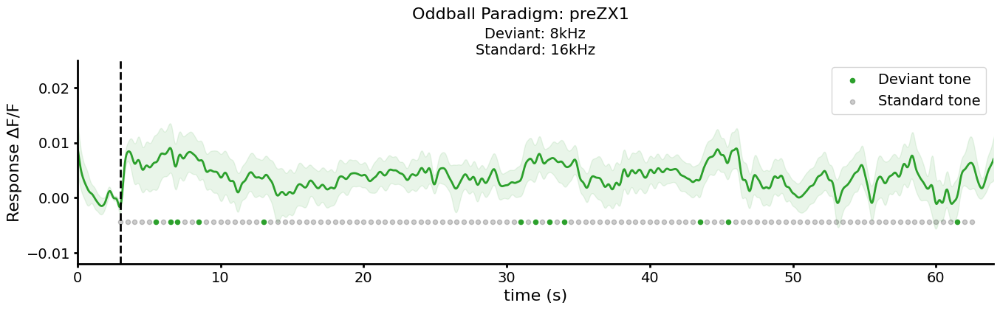

In [59]:
# Plot representative whole trace showing deviant and standard tone onsets
import seaborn as sns
zinc_trace_palette = {'Deviant': sns.color_palette("tab20")[4], 'Standard': 'k'}

df_oddball_zinc_represent = df_oddball_zinc_all[
    (df_oddball_zinc_all['id'] == '20250626') & 
    (df_oddball_zinc_all['treatment'] == 'preZX1') & 
    (df_oddball_zinc_all['pulse'] == 'oddball_7711Hz_std_15422Hz_80dB_500msISI_100msPulse_3sOnset_4000msAfterTrain_sinSquaredRamp5ms_67sTotal_Fs250kHz')
].copy()

df_resp_trace_zinc_represent = plotting.plot_oddball_wholeTrace(df_oddball_zinc_represent, onset_times_zinc_halfSecISI_old, 
                                                                resp_col='dFF_ROI_logFilt_butterFilt', negative_exclude=True, 
                                                                t_resp=(0.3, 0.475), plot_errBar=True, stim_colors=zinc_trace_palette, 
                                                                show_deviant_dots=True, show_standard_dots=True, 
                                                                trace_color=sns.color_palette("tab20")[4], 
                                                                Xaxis_range=(0, 64), Yaxis_range=(-0.012, 0.025), 
                                                                Yaxis_label='Response ΔF/F')

### Figure 3C (representative average trace, Deviant vs Standard, same protocol)

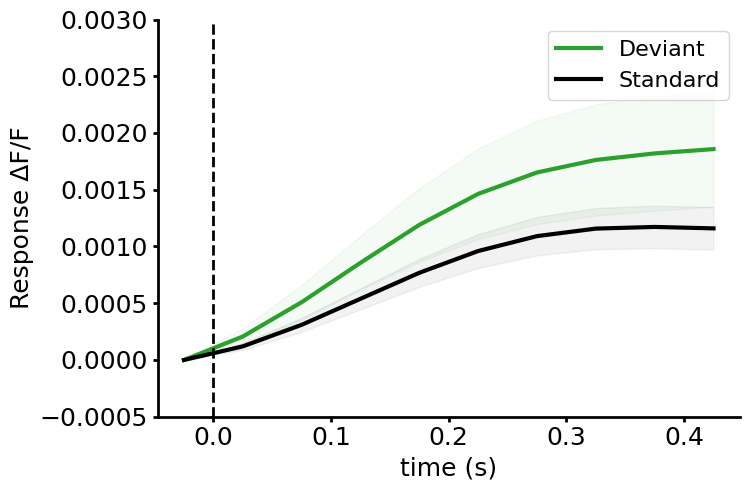

In [60]:
df_resp_peak_zinc_represent = signalProcess.add_oddball_respData(df_resp_trace_zinc_represent, t_resp=(0.3, 0.475))
fig = plotting.plot_oddball_trace_reTone(df_resp_peak_zinc_represent, x_col=None, y_col=None, color_palette=zinc_trace_palette, 
                                         Yaxis_label='Response ΔF/F', Yaxis_range=(-0.0005, 0.0030), plot_errBar=True)

### Figure 3D (response, Deviant vs Standard, re frequency)

In [61]:
df_resp_zinc_freq = df_resp_peak_zinc_all[df_resp_peak_zinc_all['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_resp_zinc_freq[['dev_freq', 'std_freq']] = df_resp_zinc_freq['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_zinc_freq['Frequency'] = df_resp_zinc_freq.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_zinc_freq = df_resp_zinc_freq[['id', 'Frequency', 'stimulus', 'trace', 'response']]
df_resp_zinc_freq.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_zinc_freq

,id,Frequency,stimulus,trace,Response ΔF/F
0,20250527,16kHz,Deviant,"[[0.0, -8.082466640273699e-06, 2.5865094060192...",0.002021
1,20250527,8kHz,Deviant,"[[0.0, -3.234155468967784e-05, -0.000100369164...",0.000632
2,20250527,8kHz,Standard,"[[0.0, 0.00013316896939138696, 0.0003070954323...",0.000572
3,20250527,16kHz,Standard,"[[0.0, 0.0003618788181888122, 0.00082284772190...",0.000661
4,20250530,16kHz,Deviant,"[[0.0, 0.00019871321392279223, 0.0003476497167...",0.000737
5,20250530,8kHz,Deviant,"[[0.0, 0.00014375328415751126, 0.0002742704173...",0.000815
6,20250530,8kHz,Standard,"[[0.0, -4.663620128505429e-05, -7.640634347871...",0.000479
7,20250530,16kHz,Standard,"[[0.0, 0.0001673917961041755, 0.00032389694295...",0.000634
8,20250624,16kHz,Deviant,"[[0.0, 0.0003067210130271352, 0.00062451116556...",0.001506
9,20250624,8kHz,Deviant,"[[0.0, 3.964409104309811e-05, 0.00023196267334...",0.001494


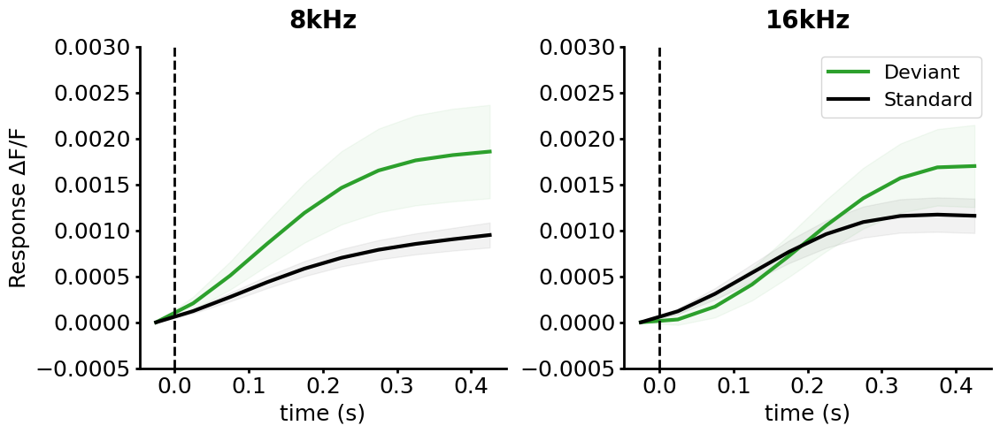

In [62]:
# Plot representative Deviant and Standard traces re frequency
import seaborn as sns
import lib.plotting as plotting

zinc_trace_freq_palette = {'Deviant': sns.color_palette("tab20")[4], 'Standard': 'k'}  # Green for Deviant and black for Standard

# Representative animal: 20250626
df_resp_zinc_freq_represent = df_resp_zinc_freq[df_resp_zinc_freq['id'] == '20250626'].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_zinc_freq_represent, trace_col='trace', x_col='Frequency', y_col=None, within_col='stimulus', 
                                         x_order=['8kHz', '16kHz'], color_palette=zinc_trace_freq_palette, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.0005, 0.0030), plot_errBar=True)

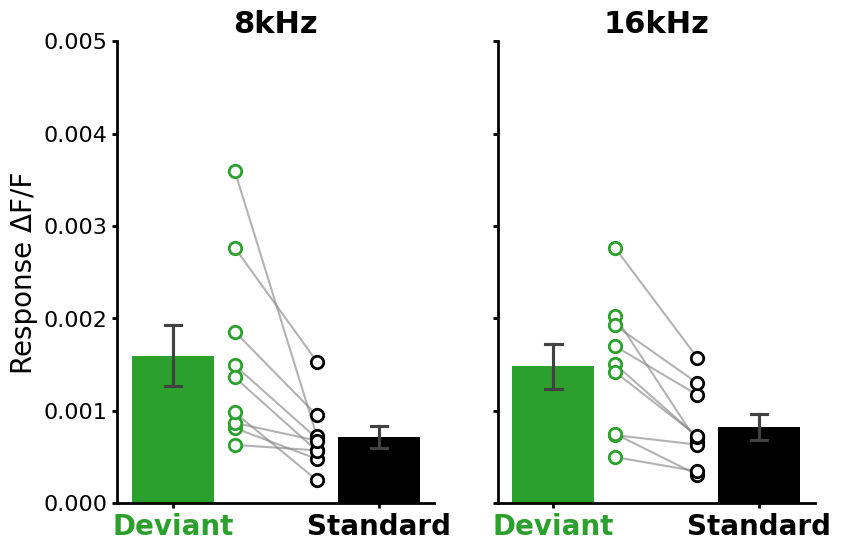

In [63]:
# Plot response amplitudes Deviant vs Standard re frequency
zinc_resp_freq_palette = [sns.color_palette("tab20")[4], 'k', 
                          sns.color_palette("tab20")[4], 'k']  # Green for Deviant and black for Standard

plotting.plot_barplot(df_resp_zinc_freq, x='stimulus', y='Response ΔF/F', group='Frequency', id='id', group_order=['8kHz', '16kHz'], 
                      palette=zinc_resp_freq_palette, offset=0.3, title_color='k', Yaxis_range=(0, 0.005))

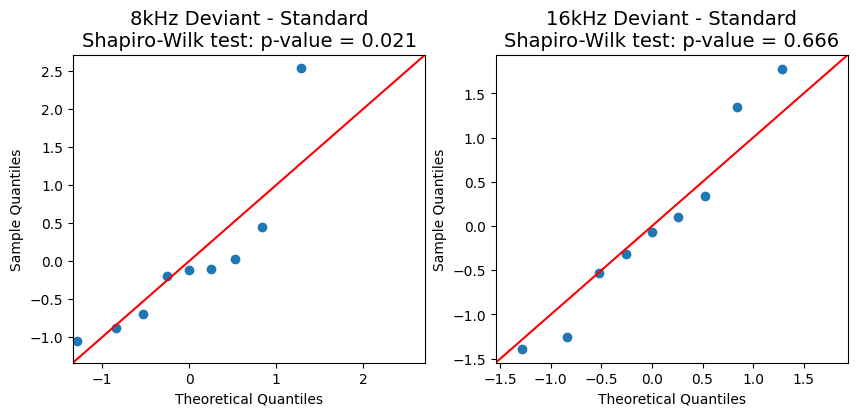

Response amplitude, 8kHz Deviant vs Standard, Wilcoxon test, p-value = 0.0039
Response amplitude, 16kHz Deviant vs Standard, paired t-test, p-value = 0.0016


In [64]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel, wilcoxon

# Extract response amplitude values for each stimulus re frequency paired by id
df_pivot_8kHz = (
    df_resp_zinc_freq[df_resp_zinc_freq['Frequency'] == '8kHz'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_8kHz = df_pivot_8kHz.columns.tolist()
groups_8kHz = [df_pivot_8kHz[col].to_numpy() for col in group_label_8kHz]

df_pivot_16kHz = (
    df_resp_zinc_freq[df_resp_zinc_freq['Frequency'] == '16kHz'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_16kHz = df_pivot_16kHz.columns.tolist()
groups_16kHz = [df_pivot_16kHz[col].to_numpy() for col in group_label_16kHz]

# Create Q-Q plot to test normality of the differences between Deviant and Standard re frequency
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_8kHz[0] - groups_8kHz[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_16kHz[0] - groups_16kHz[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'8kHz {group_label_8kHz[0]} - {group_label_8kHz[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_8kHz[0] - groups_8kHz[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'16kHz {group_label_16kHz[0]} - {group_label_16kHz[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_16kHz[0] - groups_16kHz[1])[1]:.3f}', fontsize=14)
plt.show()

# Wilcoxon signed-rank test between Deviant and Standard for 8kHz (not normally distributed)
print(f"Response amplitude, 8kHz {group_label_8kHz[0]} vs {group_label_8kHz[1]}, Wilcoxon test, p-value = {wilcoxon(groups_8kHz[0], groups_8kHz[1])[1]:.4f}")

# Paired t-test between Deviant and Standard for 16kHz
print(f"Response amplitude, 16kHz {group_label_16kHz[0]} vs {group_label_16kHz[1]}, paired t-test, p-value = {ttest_rel(groups_16kHz[0], groups_16kHz[1])[1]:.4f}")

### Figure 3E (SI, 8kHz vs 16kHz)

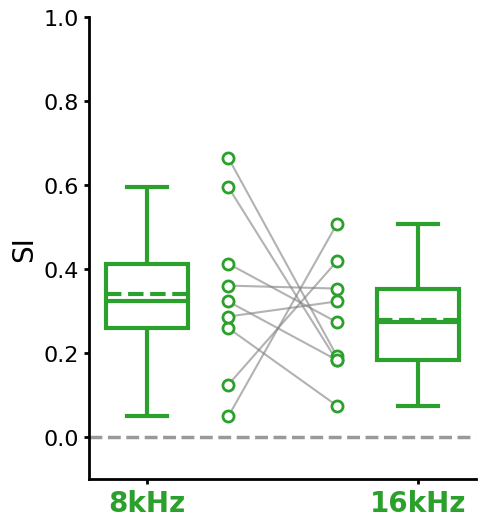

In [65]:
# Plot normalized stimulus-specific adaptation indices (SI) 8kHz vs 16kHz
import seaborn as sns
import lib.plotting as plotting

zinc_SI_freq_palette = [sns.color_palette("tab20")[4]] * 2
df_SI_zinc_freq = df_resp_peak_zinc_all[df_resp_peak_zinc_all['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_SI_zinc_freq[['dev_freq', 'std_freq']] = df_SI_zinc_freq['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_zinc_freq['Frequency'] = df_SI_zinc_freq.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/frequency combination
df_SI_zinc_freq = (
    df_SI_zinc_freq
    .pivot_table(index=['id', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

plotting.plot_boxplot(df_SI_zinc_freq, x='Frequency', y='SI', id='id', x_order=['8kHz', '16kHz'], 
                      palette=zinc_SI_freq_palette, offset=0.3, Yaxis_range=(-0.1, 1))

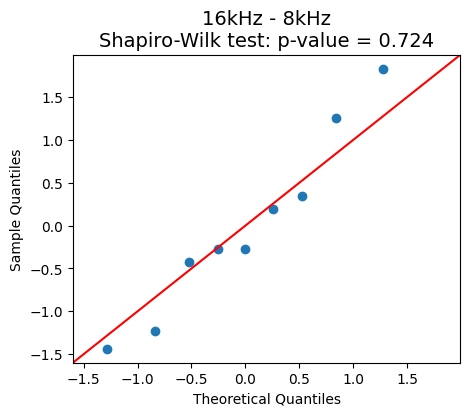

SI, 16kHz vs 8kHz, paired t-test, p-value = 0.5478


In [66]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract SI values for each frequency paired by id
df_pivot = df_SI_zinc_freq.pivot_table(index='id', columns='Frequency', values='SI', sort=False)
group_label = df_pivot.columns.tolist()
groups = [df_pivot[col].to_numpy() for col in group_label]

# Create Q-Q plot to test normality of the differences between 8kHz and 16kHz
fig, ax = plt.subplots(figsize=(5, 4))
sm.qqplot(groups[0]-groups[1], fit=True, line='45', ax=ax)
ax.set_title(f'{group_label[0]} - {group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[0]-groups[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between 8kHz and 16kHz
print(f"SI, {group_label[0]} vs {group_label[1]}, paired t-test, p-value = {ttest_rel(groups[0], groups[1])[1]:.4f}")

### Figure 3F (response, preZX1 vs postZX1, re stimulus)

In [67]:
df_resp_zinc_prePost = df_resp_peak_zinc_all[~df_resp_peak_zinc_all['id'].isin(['20250527', '20250530', '20260121'])].copy()  # Exclude animals with only preZX1 data

# Extract Deviant and Standard frequencies
df_resp_zinc_prePost[['dev_freq', 'std_freq']] = df_resp_zinc_prePost['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_zinc_prePost['Frequency'] = df_resp_zinc_prePost.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_zinc_prePost = df_resp_zinc_prePost[['id', 'treatment', 'Frequency', 'stimulus', 'trace', 'response']]
df_resp_zinc_prePost.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_zinc_prePost

,id,treatment,Frequency,stimulus,trace,Response ΔF/F
8,20250624,preZX1,16kHz,Deviant,"[[0.0, 0.0003067210130271352, 0.00062451116556...",0.001506
9,20250624,preZX1,8kHz,Deviant,"[[0.0, 3.964409104309811e-05, 0.00023196267334...",0.001494
10,20250624,postZX1,16kHz,Deviant,"[[0.0, -3.973819004848313e-06, 6.1729310877335...",0.000186
11,20250624,postZX1,8kHz,Deviant,"[[0.0, 1.3401305135696837e-05, 1.2549631638295...",0.000315
12,20250624,preZX1,8kHz,Standard,"[[0.0, 2.1762659427800382e-05, -5.637455564917...",0.000701
13,20250624,preZX1,16kHz,Standard,"[[0.0, 6.11837024893188e-05, 0.000248126699127...",0.000718
14,20250624,postZX1,8kHz,Standard,"[[0.0, 5.327071986410345e-05, 0.00021966236870...",0.000631
15,20250624,postZX1,16kHz,Standard,"[[0.0, 0.0002016863312102454, 0.00046402087498...",0.000550
16,20250626,preZX1,16kHz,Deviant,"[[0.0, 0.000310280889340743, 0.000674870332515...",0.001701
17,20250626,preZX1,8kHz,Deviant,"[[0.0, 6.354583164039362e-05, 0.00024628485447...",0.001858


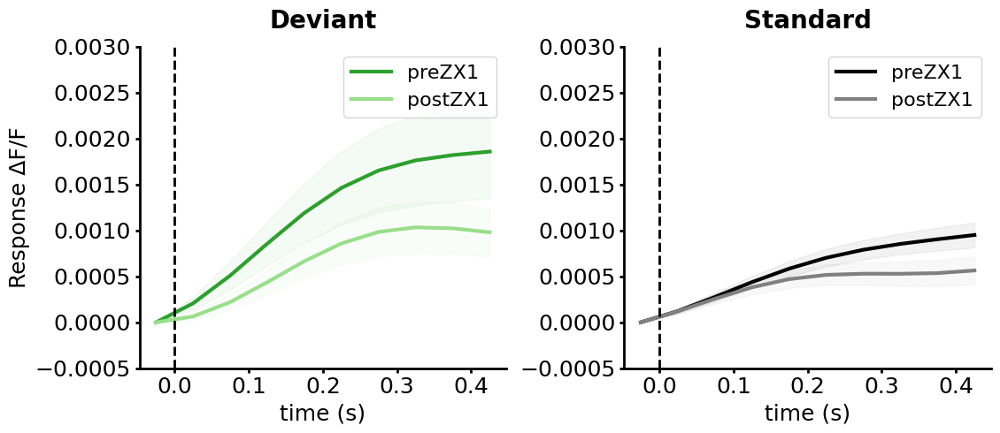

In [68]:
# Plot representative traces preZX1 vs postZX1 re stimulus
import seaborn as sns
import lib.plotting as plotting

# Green for Deviant and black for Standard, dark for preZX1 and light for postZX1
zinc_trace_palette_prePost = {('Deviant', 'preZX1'): sns.color_palette("tab20")[4], ('Deviant', 'postZX1'): sns.color_palette("tab20")[5], 
                              ('Standard', 'preZX1'): 'k', ('Standard', 'postZX1'): 'gray'}

# Representative animal: 20250626, 8kHz
df_resp_zinc_prePost_represent = df_resp_zinc_prePost[
    (df_resp_zinc_prePost['id'] == '20250626') & (df_resp_zinc_prePost['Frequency'] == '8kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_zinc_prePost_represent, trace_col='trace', x_col='stimulus', y_col=None, within_col='treatment', 
                                         color_palette=zinc_trace_palette_prePost, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.0005, 0.0030), plot_errBar=True)

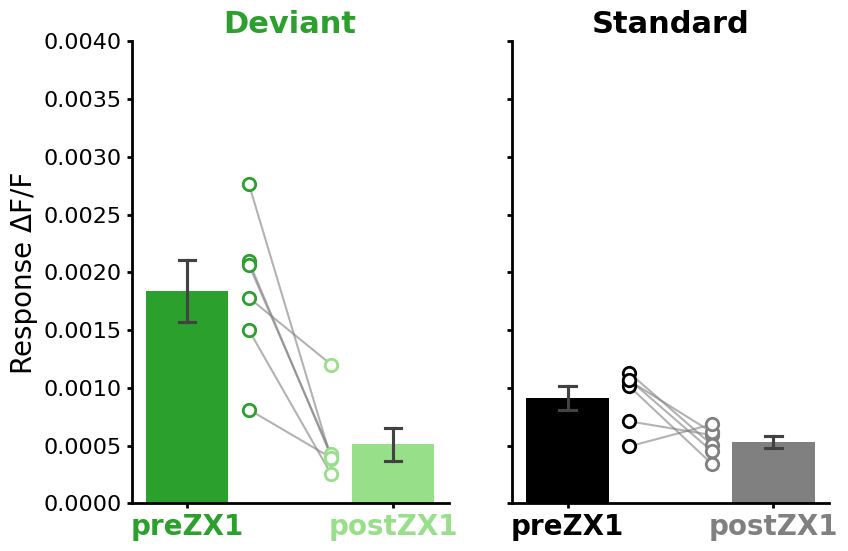

In [69]:
# Plot response amplitude preZX1 vs postZX1 re stimulus

# Green for Deviant and black for Standard, dark for preZX1 and light for postZX1
zinc_resp_palette_prePost = [sns.color_palette("tab20")[4], sns.color_palette("tab20")[5], 'k', 'gray']

# Average across the two pulse protocols
df_resp_zinc_prePost = (
    df_resp_zinc_prePost
    .groupby(['id', 'treatment', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_zinc_prePost, x='treatment', y='Response ΔF/F', group='stimulus', 
                      id='id', palette=zinc_resp_palette_prePost, offset=0.3, Yaxis_range=(0, 0.004))

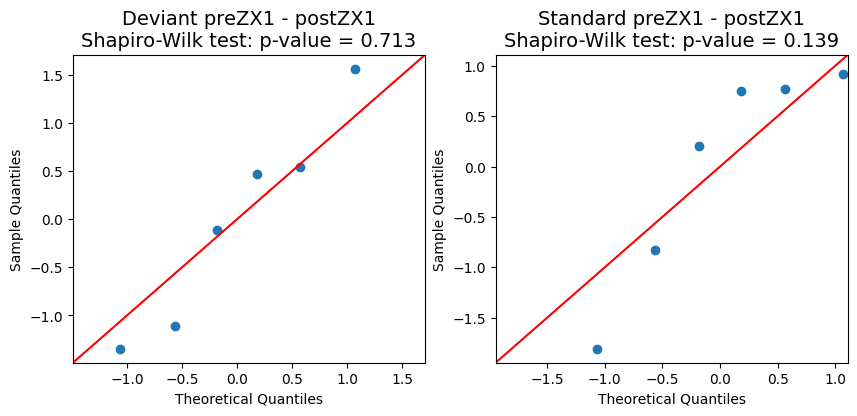

Response amplitude, Deviant preZX1 vs postZX1, paired t-test, p-value = 0.0070
Response amplitude, Standard preZX1 vs postZX1, paired t-test, p-value = 0.0428


In [70]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each treatment re stimulus paired by id
df_pivot_deviant = (
    df_resp_zinc_prePost[df_resp_zinc_prePost['stimulus'] == 'Deviant'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_deviant = df_pivot_deviant.columns.tolist()
groups_deviant = [df_pivot_deviant[col].to_numpy() for col in group_label_deviant]

df_pivot_standard = (
    df_resp_zinc_prePost[df_resp_zinc_prePost['stimulus'] == 'Standard'].copy()
    .pivot_table(index='id', columns='treatment', values='Response ΔF/F', sort=False)
)
group_label_standard = df_pivot_standard.columns.tolist()
groups_standard = [df_pivot_standard[col].to_numpy() for col in group_label_standard]

# Create Q-Q plot to test normality of the differences between preZX1 and postZX1 re stimulus
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_deviant[0] - groups_deviant[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_standard[0] - groups_standard[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'Deviant {group_label_deviant[0]} - {group_label_deviant[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_deviant[0] - groups_deviant[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'Standard {group_label_standard[0]} - {group_label_standard[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_standard[0] - groups_standard[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between preZX1 and postZX1 for Standard (normally distributed)
print(f"Response amplitude, Deviant {group_label_deviant[0]} vs {group_label_deviant[1]}, paired t-test, p-value = {ttest_rel(groups_deviant[0], groups_deviant[1])[1]:.4f}")
print(f"Response amplitude, Standard {group_label_standard[0]} vs {group_label_standard[1]}, paired t-test, p-value = {ttest_rel(groups_standard[0], groups_standard[1])[1]:.4f}")

## Figure 4 (zinc, A1 vs AAF, 0.5s ISI)

### Load oddball metadata and process (zinc, A1 & AAF, 0.5s ISI)

In [71]:
# Initialize experiment group object in A1/AAF with 0.5s ISI
import pandas as pd
import lib.experiment_oop as exp

# Define path
dPaths_zinc_halfSecISI_A1 = [
    common_path_oddball + r"\20250527\AA0001\Oddball", 
    common_path_oddball + r"\20250530\AA0001\Oddball", 
    common_path_oddball + r"\20250626\AA0001\Oddball", 
    common_path_oddball + r"\20251205\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251209\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260107\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\GRISZ\Oddball_0.5secISI"
]

dPaths_zinc_halfSecISI_AAF = dPaths_zinc_halfSecISI_A1.copy()  # Both A1 and AAF are identified in all animals

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.3, 5.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_zinc_halfSecISI_A1 = exp.ExperimentGroup(dPaths_zinc_halfSecISI_A1, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')
group_zinc_halfSecISI_AAF = exp.ExperimentGroup(dPaths_zinc_halfSecISI_AAF, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_zinc_halfSecISI_A1.load_qcam_data()
group_zinc_halfSecISI_AAF.load_qcam_data()

# Process qcam files re saved ROI
cutoff_freq = 2  # Cutoff frequency of low-pass Butterworth filter
group_zinc_halfSecISI_A1.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_A1')
group_zinc_halfSecISI_AAF.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_AAF')

# Extract pure tone trials in A1/AAF and combine
df_pureTone_zinc_A1 = group_zinc_halfSecISI_A1.df[group_zinc_halfSecISI_A1.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_zinc_A1['subfield'] = 'A1'
df_pureTone_zinc_AAF = group_zinc_halfSecISI_AAF.df[group_zinc_halfSecISI_AAF.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_zinc_AAF['subfield'] = 'AAF'
df_pureTone_zinc = pd.concat([df_pureTone_zinc_A1, df_pureTone_zinc_AAF], ignore_index=True)
df_pureTone_zinc = df_pureTone_zinc[df_pureTone_zinc.valid]  # Exclude negative responses caused by motion artifacts
df_pureTone_zinc['id'] = df_pureTone_zinc['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID

# Extract oddball trials in A1/AAF and combine
df_oddball_zinc_halfSecISI_A1 = group_zinc_halfSecISI_A1.df[group_zinc_halfSecISI_A1.df['pulse'].str.contains('oddball')].copy()
df_oddball_zinc_halfSecISI_A1['subfield'] = 'A1'
df_oddball_zinc_halfSecISI_AAF = group_zinc_halfSecISI_AAF.df[group_zinc_halfSecISI_AAF.df['pulse'].str.contains('oddball')].copy()
df_oddball_zinc_halfSecISI_AAF['subfield'] = 'AAF'
df_oddball_zinc_halfSecISI = pd.concat([df_oddball_zinc_halfSecISI_A1, df_oddball_zinc_halfSecISI_AAF], ignore_index=True)
df_oddball_zinc_halfSecISI['id'] = df_oddball_zinc_halfSecISI['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_zinc_halfSecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:49:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.838954,"[0.02688175718235205, 0.01734076950946439, 0.0...",0.029724,"[0.023641160941593273, 0.014050061154549645, 0...",0.033149,"[0.023523174474850795, 0.019030648425096323, 0...",0.029105,True,A1,20250527
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:52:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.264276,"[0.023909856816270014, 0.020137924978471205, 0...",0.022822,"[0.02181959201462254, 0.018036529256677928, 0....",0.025397,"[0.021929781603856516, 0.01945788929091269, 0....",0.020517,True,A1,20250527
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:56:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.322428,"[0.03707141733643799, 0.02533398312099213, 0.0...",0.023385,"[0.03493840014174903, 0.023127825199117855, 0....",0.025714,"[0.03484952873346583, 0.028929977175591915, 0....",0.022061,True,A1,20250527
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:58:40,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.225424,"[0.045051477684989724, 0.044447933859780075, 0...",0.014864,"[0.03082937842581293, 0.030691800329629836, 0....",0.021299,"[0.030862389291297494, 0.029997574782373762, 0...",0.020343,True,A1,20250527
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 19:00:09,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.613085,"[-0.0022638775695011625, 0.0001970905178153266...",0.012395,"[-0.0030335058568100376, -0.000543765442959254...",0.012906,"[-0.0029707185242181158, -0.001760823257604818...",0.010508,True,A1,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:03:08,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.811302,"[0.037555133707672474, 0.035979499487919064, 0...",0.003949,"[-0.0013569016247789371, 0.008032194357823711,...",0.008951,"[-0.0013330030655853554, 0.001716740463324203,...",0.007024,True,AAF,20260121
190,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:05:52,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.224427,"[0.04494236469485979, 0.04232413419691126, 0.0...",-0.002027,"[0.005489855750236024, 0.016117775809105568, 0...",0.002737,"[0.005549838327715979, 0.009814571807965104, 0...",0.001983,True,AAF,20260121
191,D:\learning\Overseas Research\Dat

In [2]:
import joblib
# joblib.dump(df_pureTone_zinc, '../data/cache/pureTone_zinc.joblib')
# joblib.dump(df_oddball_zinc_halfSecISI, '../data/cache/oddball_zinc_halfSecISI.joblib')

df_pureTone_zinc = joblib.load('../data/cache/pureTone_zinc.joblib')
df_oddball_zinc_halfSecISI = joblib.load('../data/cache/oddball_zinc_halfSecISI.joblib')
df_oddball_zinc_halfSecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:49:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.838954,"[0.02688175718235205, 0.01734076950946439, 0.0...",0.029724,"[0.023641160941593273, 0.014050061154549645, 0...",0.033149,"[0.023523174474850795, 0.019030648425096323, 0...",0.029105,True,A1,20250527
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:52:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.264276,"[0.023909856816270014, 0.020137924978471205, 0...",0.022822,"[0.02181959201462254, 0.018036529256677928, 0....",0.025397,"[0.021929781603856516, 0.01945788929091269, 0....",0.020517,True,A1,20250527
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:56:16,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.322428,"[0.03707141733643799, 0.02533398312099213, 0.0...",0.023385,"[0.03493840014174903, 0.023127825199117855, 0....",0.025714,"[0.03484952873346583, 0.028929977175591915, 0....",0.022061,True,A1,20250527
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 18:58:40,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.225424,"[0.045051477684989724, 0.044447933859780075, 0...",0.014864,"[0.03082937842581293, 0.030691800329629836, 0....",0.021299,"[0.030862389291297494, 0.029997574782373762, 0...",0.020343,True,A1,20250527
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_80dB_500msISI_100ms...,None,preZX1,1340,2025-05-27 19:00:09,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.613085,"[-0.0022638775695011625, 0.0001970905178153266...",0.012395,"[-0.0030335058568100376, -0.000543765442959254...",0.012906,"[-0.0029707185242181158, -0.001760823257604818...",0.010508,True,A1,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:03:08,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.811302,"[0.037555133707672474, 0.035979499487919064, 0...",0.003949,"[-0.0013569016247789371, 0.008032194357823711,...",0.008951,"[-0.0013330030655853554, 0.001716740463324203,...",0.007024,True,AAF,20260121
190,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_500msISI_100ms...,None,preZX1,1340,2026-01-21 19:05:52,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.224427,"[0.04494236469485979, 0.04232413419691126, 0.0...",-0.002027,"[0.005489855750236024, 0.016117775809105568, 0...",0.002737,"[0.005549838327715979, 0.009814571807965104, 0...",0.001983,True,AAF,20260121
191,D:\learning\Overseas Research\Dat

In [3]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_zinc_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20250527, 20250530, 20250626
deviant_pos_zinc_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_zinc_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_zinc_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_zinc_halfSecISI_all = {
    '20250527': onset_times_zinc_halfSecISI_old,
    '20250530': onset_times_zinc_halfSecISI_old,
    '20250626': onset_times_zinc_halfSecISI_old,
    
    '20251205': onset_times_zinc_halfSecISI_new,
    '20251209': onset_times_zinc_halfSecISI_new,
    '20251210': onset_times_zinc_halfSecISI_new,
    '20260107': onset_times_zinc_halfSecISI_new,
    '20260121': onset_times_zinc_halfSecISI_new
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_zinc_temp = []

for (id, subfield), df_sub_zinc in df_oddball_zinc_halfSecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_zinc = onset_times_zinc_halfSecISI_all[id]

    df_resp_trace_zinc = plotting.plot_oddball_wholeTrace(
        df_sub_zinc, onset_times_zinc, 
        resp_col='dFF_ROI_logFilt_butterFilt', 
        negative_exclude=True,  # Exclude windows of negative responses
        t_resp=(0.3, 0.475),  # Skip first 300ms after tone onset to avoid motion artifacts
        plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_zinc['id'] = id
    df_resp_trace_zinc['subfield'] = subfield

    df_resp_trace_zinc_temp.append(df_resp_trace_zinc)

df_resp_trace_zinc_halfSecISI = pd.concat(df_resp_trace_zinc_temp, ignore_index=True)
df_resp_trace_zinc_halfSecISI = df_resp_trace_zinc_halfSecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_zinc_halfSecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Igno

,id,subfield,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20250527,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.023523174474850795, 0.019030648425096323, ...","[0.006615163493555691, 0.005195818670579684, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
1,20250527,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.021929781603856516, 0.01945788929091269, 0...","[0.009067199137709342, 0.008449719874394121, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
2,20250530,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.010975274256050974, 0.010661358347304828, ...","[0.004969759589212038, 0.004410782217380195, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
3,20250530,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.01547234714460456, 0.015571119055994573, 0...","[0.009390250922010773, 0.008699220311000011, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
4,20250626,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.008402733373856193, 0.004318815537408918, ...","[0.009072616709707207, 0.008009229789358686, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
5,20250626,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.02173609831282732, 0.019993204115728705, 0...","[0.008961733637062845, 0.007958930717388091, 0...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
6,20250626,A1,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.0015624007552748644, 0.007559799373583927,...","[-0.0024006043909471377, -0.000406607035449217...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
7,20250626,A1,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.014581302662580146, -0.011865431079007229...","[-0.0007733161919578923, -0.000100918472865428...","[5.5, 6.5, 7.0, 8.5, 13.0, 31.0, 32.0, 33.0, 3...","[3.0, 3.5, 4.0, 4.5, 5.0, 6.0, 7.5, 8.0, 9.0, ..."
8,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.034106038169295756, 0.029961749183402952, ...","[0.009146576286522084, 0.010938855460035589, 0...","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."
9,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.03251882723638786, 0.02870463056155702, 0....","[0.01574860902406662, 0.015604327139149934, 0....","[7.5, 9.0, 13.0, 19.0, 29.0, 33.0, 34.0, 38.0,...","[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ..."


In [4]:
# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_zinc_temp = []

for (id, subfield), df_sub_zinc in df_resp_trace_zinc_halfSecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_zinc = signalProcess.add_oddball_respData(df_sub_zinc, t_resp=(0.3, 0.475))
    
    # Restore metadata columns
    df_resp_peak_zinc['id'] = id
    df_resp_peak_zinc['subfield'] = subfield

    df_resp_peak_zinc_temp.append(df_resp_peak_zinc)

df_resp_peak_zinc_halfSecISI = pd.concat(df_resp_peak_zinc_temp, ignore_index=True)
df_resp_peak_zinc_halfSecISI = df_resp_peak_zinc_halfSecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_zinc_halfSecISI

,id,subfield,treatment,pulse,stimulus,trace,response
0,20250527,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -8.082466640273699e-06, 2.5865094060192...",0.002021
1,20250527,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -3.234155468967784e-05, -0.000100369164...",0.000632
2,20250527,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, 0.00013316896939138696, 0.0003070954323...",0.000572
3,20250527,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.0003618788181888122, 0.00082284772190...",0.000661
4,20250530,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.00019871321392279223, 0.0003476497167...",0.000737
...,...,...,...,...,...,...,...
99,20260107,AAF,postZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 8.462919561282164e-05, 2.53339547903548...",0.000995
100,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0004274360271429578, -0.000690409829...",0.001049
101,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.00015431652718342608, 0.0003376150541...",0.001671
102,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, 0.00023625858006281163, 0.0006196669636...",0.000488


### Figure 4A (SI, A1 vs AAF)

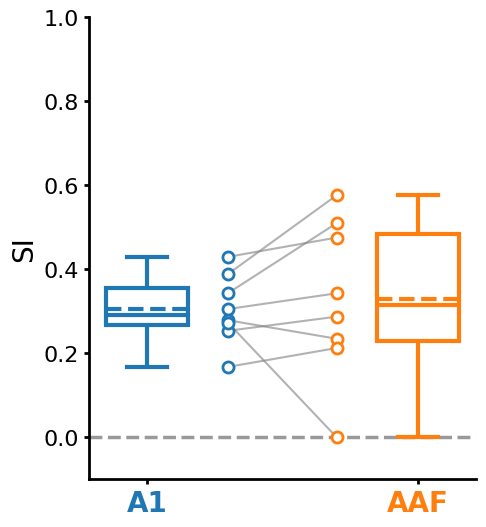

In [5]:
# Plot normalized stimulus-specific adaptation indices (SI) A1 vs AAF
import seaborn as sns
import lib.plotting as plotting

zinc_A1_AAF_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[2]]  # Blue for A1, orange for AAF
df_SI_zinc_halfSecISI_A1_AAF = df_resp_peak_zinc_halfSecISI[df_resp_peak_zinc_halfSecISI['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_SI_zinc_halfSecISI_A1_AAF[['dev_freq', 'std_freq']] = df_SI_zinc_halfSecISI_A1_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_zinc_halfSecISI_A1_AAF['Frequency'] = df_SI_zinc_halfSecISI_A1_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/subfield/frequency combination
df_SI_zinc_halfSecISI_A1_AAF = (
    df_SI_zinc_halfSecISI_A1_AAF
    .pivot_table(index=['id', 'subfield', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_zinc_halfSecISI_A1_AAF = (
    df_SI_zinc_halfSecISI_A1_AAF
    .groupby(['id', 'subfield'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_zinc_halfSecISI_A1_AAF, x='subfield', y='SI', id='id', 
                      palette=zinc_A1_AAF_palette, offset=0.3, Yaxis_range=(-0.1, 1))

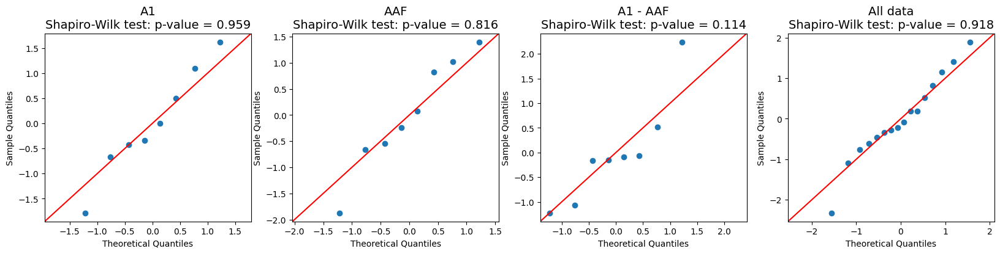

SI, A1 vs 0, one-sample t-test, p-value = 0.0000
SI, AAF vs 0, one-sample t-test, p-value = 0.0016
SI, A1 vs AAF, paired t-test, p-value = 0.6342


In [6]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each subfield paired by id
df_pivot = df_SI_zinc_halfSecISI_A1_AAF.pivot_table(index='id', columns='subfield', values='SI', sort=False)
group_label = df_pivot.columns.tolist()
groups = [df_pivot[col].to_numpy() for col in group_label]

# Create Q-Q plot to test normality of each subfield and the differences between A1 and AAF
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups[0], fit=True, line='45', ax=ax[0])
sm.qqplot(groups[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups[0]-groups[1], fit=True, line='45', ax=ax[2])
sm.qqplot(np.concatenate(groups), fit=True, line='45', ax=ax[3])
ax[0].set_title(f'{group_label[0]}\nShapiro-Wilk test: p-value = {shapiro(groups[0])[1]:.3f}', fontsize=14)
ax[1].set_title(f'{group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'{group_label[0]} - {group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[0]-groups[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'All data\nShapiro-Wilk test: p-value = {shapiro(np.concatenate(groups))[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 re subfield
print(f"SI, {group_label[0]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[0], 0)[1]:.4f}")
print(f"SI, {group_label[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[1], 0)[1]:.4f}")

# Paired t-test between A1 and AAF
print(f"SI, {group_label[0]} vs {group_label[1]}, paired t-test, p-value = {ttest_rel(groups[0], groups[1])[1]:.4f}")

### Figure 4B (response ~ baseline fluorescence)

In [2]:
# Initialize experiment group object of all animals in which single pure tone responses were recorded
import lib.experiment_oop as exp

# Define path
dPaths_zinc_baseF = [
    common_path_oddball + r"\20250527\AA0001\Oddball", 
    common_path_oddball + r"\20250530\AA0001\Oddball", 
    common_path_oddball + r"\20250626\AA0001\Oddball", 
    common_path_oddball + r"\20250715\AA0001\Oddball_1secISI", 
    common_path_oddball + r"\20250820\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251002\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251105\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251110\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251202\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251205\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251209\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20251210\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260107\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20260121\AA0001\GRISZ\Oddball_0.5secISI", 
    common_path_oddball + r"\20250624\AA0001\Oddball", 
    common_path_oddball + r"\20250815\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20250917\AA0001\Oddball", 
    common_path_oddball + r"\20251013\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251028\AA0001\Oddball", 
    common_path_oddball + r"\20251117\AA0001\GRISZ\Oddball"
]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.3, 5.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_zinc_baseF = exp.ExperimentGroup(dPaths_zinc_baseF, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_zinc_baseF.load_qcam_data()

# Process qcam files with saved ROI in A1 for consistency
cutoff_freq = 2  # Cutoff frequency of low-pass Butterworth filter
group_zinc_baseF.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_A1')

# Extract pure tone trials
df_pureTone_zinc_baseF = group_zinc_baseF.df[group_zinc_baseF.df['pulse'].str.contains('pureTone')].copy()
df_pureTone_zinc_baseF = df_pureTone_zinc_baseF[df_pureTone_zinc_baseF.valid]  # Exclude negative responses caused by motion artifacts
df_pureTone_zinc_baseF['id'] = df_pureTone_zinc_baseF['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_pureTone_zinc_baseF

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c


,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_80dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-05-27 18:08:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.14841721526263996, -0.04169043522220761, 0...",0.921664,"[-0.001553595388610835, -0.004904576920319908,...",0.016781,"[-0.0021228887833609537, -0.005476267437325133...",0.017268,"[-0.002177096567624945, -0.0006115470046007914...",0.013520,True,20250527
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:08:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.3056261042741113, 0.19319191938558333, 0.11...",0.866019,"[0.006549154161730638, -0.0037151682800162017,...",0.013641,"[0.004602796192766719, -0.005601341853086498, ...",0.014135,"[0.004519105368639506, 0.0028566101778077545, ...",0.012805,True,20250527
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_80dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-05-27 18:09:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.2324497985622713, 1.1551626698103377, 1.092...",1.226131,"[0.013115778151955242, 0.005234569292875415, 0...",0.026323,"[0.019055709881851134, 0.010934562436592802, 0...",0.024150,"[0.018728107011786392, 0.017553664353279364, 0...",0.018632,True,20250527
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:12:41,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.512146181656945, -0.3993701631168278, -0.3...",1.497739,"[-0.004884116047829781, 0.0047244403296043645,...",0.024343,"[-0.007642780180550265, 0.002038567542665971, ...",0.026692,"[-0.00766530954857804, -0.00597738699301123, -...",0.022417,True,20250527
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:16:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.7113944732404036, 0.5674154999175727, 0.441...",0.923975,"[0.012145187831966407, 0.004392838588155116, 0...",0.017986,"[0.010758479254120646, 0.003005325448649127, 0...",0.018619,"[0.01092398821597771, 0.008713084607515652, 0....",0.014188,True,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2026-01-21 18:46:18,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.002797016976217, 2.185932088994207, 3.12669...",1.062213,"[0.04370107412055139, 0.037032879788161555, 0....",0.003404,"[0.003582522929655443, 0.018088322822168657, 0...",0.005932,"[0.0035730071260100657, 0.007788566179126963, ...",0.003785,True,20260121
387,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2026-01-21 18:46:58,"(130, 174)","

In [7]:
import joblib
# joblib.dump(df_pureTone_zinc_baseF, '../data/cache/pureTone_zinc_baseF.joblib')

df_pureTone_zinc_baseF = joblib.load('../data/cache/pureTone_zinc_baseF.joblib')
df_pureTone_zinc_baseF

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_80dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-05-27 18:08:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.14841721526263996, -0.04169043522220761, 0...",0.921664,"[-0.001553595388610835, -0.004904576920319908,...",0.016781,"[-0.0021228887833609537, -0.005476267437325133...",0.017268,"[-0.002177096567624945, -0.0006115470046007914...",0.013520,True,20250527
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:08:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.3056261042741113, 0.19319191938558333, 0.11...",0.866019,"[0.006549154161730638, -0.0037151682800162017,...",0.013641,"[0.004602796192766719, -0.005601341853086498, ...",0.014135,"[0.004519105368639506, 0.0028566101778077545, ...",0.012805,True,20250527
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,15422Hz_80dB_pureTone_100msPulse_3sOnset_sinSq...,None,preZX1,200,2025-05-27 18:09:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.2324497985622713, 1.1551626698103377, 1.092...",1.226131,"[0.013115778151955242, 0.005234569292875415, 0...",0.026323,"[0.019055709881851134, 0.010934562436592802, 0...",0.024150,"[0.018728107011786392, 0.017553664353279364, 0...",0.018632,True,20250527
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:12:41,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-0.512146181656945, -0.3993701631168278, -0.3...",1.497739,"[-0.004884116047829781, 0.0047244403296043645,...",0.024343,"[-0.007642780180550265, 0.002038567542665971, ...",0.026692,"[-0.00766530954857804, -0.00597738699301123, -...",0.022417,True,20250527
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_80dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2025-05-27 18:16:26,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[0.7113944732404036, 0.5674154999175727, 0.441...",0.923975,"[0.012145187831966407, 0.004392838588155116, 0...",0.017986,"[0.010758479254120646, 0.003005325448649127, 0...",0.018619,"[0.01092398821597771, 0.008713084607515652, 0....",0.014188,True,20250527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2026-01-21 18:46:18,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.002797016976217, 2.185932088994207, 3.12669...",1.062213,"[0.04370107412055139, 0.037032879788161555, 0....",0.003404,"[0.003582522929655443, 0.018088322822168657, 0...",0.005932,"[0.0035730071260100657, 0.007788566179126963, ...",0.003785,True,20260121
387,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,7711Hz_70dB_pureTone_100msPulse_3sOnset_sinSqu...,None,preZX1,200,2026-01-21 18:46:58,"(130, 174)","

In [8]:
# Plot the correlation between baseline fluorescence (F0) and response amplitude (ΔF/F)
import lib.signalProcess as signalProcess

freqRegex = r'(\d+)\s*Hz'  # Extract unique frequencies before 'Hz'
freq_map = {7711: 8, 15422: 16}  # Simplify frequency values

df_pureTone_zinc_baseF_pre = df_pureTone_zinc_baseF[df_pureTone_zinc_baseF['treatment'] == 'preZX1'].copy()
df_pureTone_zinc_baseF_pre['Frequency (kHz)'] = (
    df_pureTone_zinc_baseF_pre['pulse']
    .str.extract(freqRegex)[0]
    .astype(int)
    .map(freq_map)
)

df_pureTone_zinc_baseF_pre = df_pureTone_zinc_baseF_pre[
    ['id', 'Frequency (kHz)', 'time', 'baseWindow', 'respWindow', 'f0_ROI_logFilt_butterFilt', 'dFF_ROI_logFilt_butterFilt']
].copy().reset_index(drop=True)
df_pureTone_zinc_baseF_pre.rename(columns={'f0_ROI_logFilt_butterFilt': 'Baseline Fluorescence', 'dFF_ROI_logFilt_butterFilt': 'response_trace'}, inplace=True)

# Calculate peak response amplitudes from averaged traces and average baseline fluorescence id/frequency combination
df_pureTone_zinc_baseF_pre = (
    df_pureTone_zinc_baseF_pre
    .groupby(['id', 'Frequency (kHz)'], sort=False, as_index=False)
    .agg({'time': 'first', 'baseWindow': 'first', 'respWindow': 'first', 'Baseline Fluorescence': 'mean', 'response_trace': 'mean'})
)
df_pureTone_zinc_baseF_pre['Response ΔF/F'] = df_pureTone_zinc_baseF_pre.apply(
    lambda x: signalProcess.getBaseResp(x['response_trace'], x['time'], t_base=x['baseWindow'], t_resp=x['respWindow'])[1] - 
              signalProcess.getBaseResp(x['response_trace'], x['time'], t_base=x['baseWindow'], t_resp=x['respWindow'])[0], 
    axis=1
)

# Average both baseline fluorescence and response amplitudes across the two frequencies
df_pureTone_zinc_baseF_pre = (
    df_pureTone_zinc_baseF_pre
    .groupby('id', sort=False, as_index=False)
    .agg({'Baseline Fluorescence': 'mean', 'Response ΔF/F': 'mean'})
)

df_pureTone_zinc_baseF_pre

,id,Baseline Fluorescence,Response ΔF/F
0,20250527,63.537922,0.012786
1,20250530,271.453986,0.002936
2,20250624,139.068204,0.004539
3,20250626,95.419925,0.009391
4,20250715,80.705200,0.004776
5,20250815,77.308781,0.007322
6,20250820,62.017367,0.012369
7,20250917,271.284196,0.004566
8,20251002,262.034279,0.006391
9,20251013,180.903355,0.004946


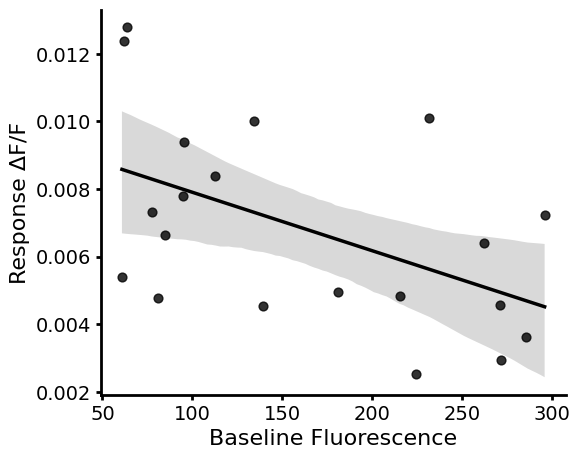

Pearson correlation coefficient: -0.505, p-value: 0.0231


In [9]:
# Plot the correlation between baseline fluorescence (F0) and response amplitude (ΔF/F)
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

fig, ax = plt.subplots(figsize=(6, 5))
sns.regplot(data=df_pureTone_zinc_baseF_pre, x='Baseline Fluorescence', y='Response ΔF/F', 
            scatter_kws={'s': 40, 'color': 'k'}, line_kws={'color': 'k', 'linewidth': 2.5}, ax=ax)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.set_xlabel('Baseline Fluorescence', fontsize=16)
ax.set_ylabel('Response ΔF/F', fontsize=16)
ax.tick_params(axis='both', labelsize=14, width=2)

plt.show()

# Calculate Pearson correlation coefficient (Pearson's r) and p-value
corr_coef, p_value = pearsonr(df_pureTone_zinc_baseF_pre['Baseline Fluorescence'], df_pureTone_zinc_baseF_pre['Response ΔF/F'])
print(f"Pearson correlation coefficient: {corr_coef:.3f}, p-value: {p_value:.4f}")

### Figure 4C (response, A1 vs AAF, re stimulus)

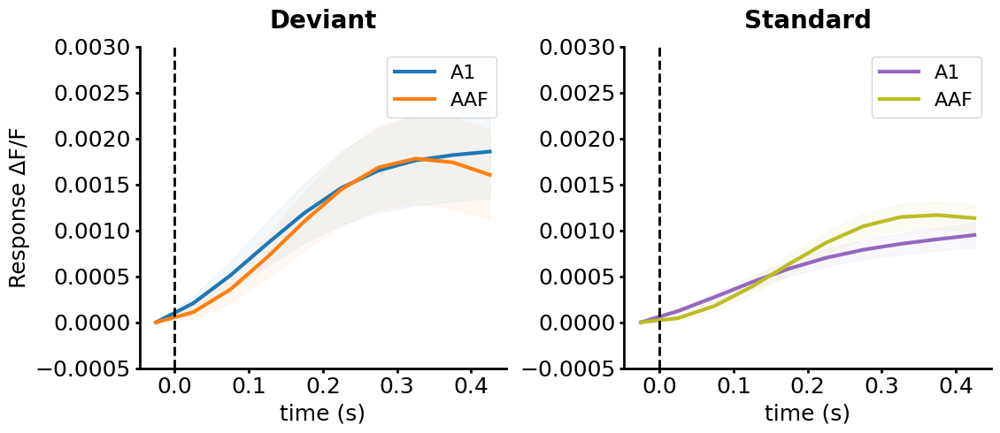

In [10]:
# Plot representative traces (0.5s ISI, A1 vs AAF) re stimulus
import seaborn as sns
import lib.plotting as plotting

df_resp_zinc_halfSecISI_A1_AAF = df_resp_peak_zinc_halfSecISI[df_resp_peak_zinc_halfSecISI['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_resp_zinc_halfSecISI_A1_AAF[['dev_freq', 'std_freq']] = df_resp_zinc_halfSecISI_A1_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_zinc_halfSecISI_A1_AAF['Frequency'] = df_resp_zinc_halfSecISI_A1_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_zinc_halfSecISI_A1_AAF.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_zinc_halfSecISI_A1_AAF = df_resp_zinc_halfSecISI_A1_AAF[['id', 'subfield', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
zinc_trace_palette_A1_AAF = {('Deviant', 'A1'): sns.color_palette("tab20")[0], ('Deviant', 'AAF'): sns.color_palette("tab20")[2], 
                             ('Standard', 'A1'): sns.color_palette("tab20")[8], ('Standard', 'AAF'): sns.color_palette("tab20")[16]}

# Representative animal: 20250626, 8kHz
df_resp_zinc_halfSecISI_A1_AAF_represent = df_resp_zinc_halfSecISI_A1_AAF[
    (df_resp_zinc_halfSecISI_A1_AAF['id'] == '20250626') & (df_resp_zinc_halfSecISI_A1_AAF['Frequency'] == '8kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_zinc_halfSecISI_A1_AAF_represent, trace_col='trace', x_col='stimulus', y_col=None, within_col='subfield', 
                                         color_palette=zinc_trace_palette_A1_AAF, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.0005, 0.003), plot_errBar=True)

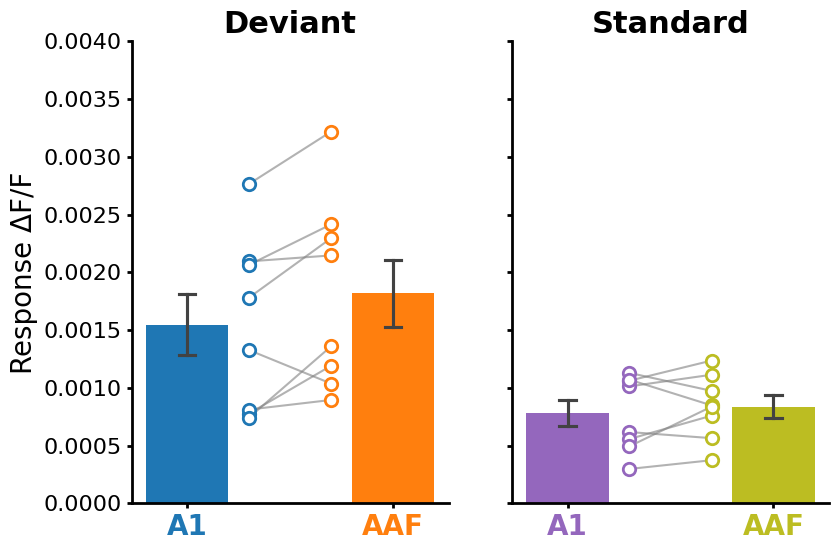

In [11]:
# Plot response amplitude (0.5s ISI, A1 vs AAF) re stimulus

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
zinc_resp_palette_A1_AAF = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[2], sns.color_palette("tab20")[8], sns.color_palette("tab20")[16]]

# Average across the two pulse protocols
df_resp_zinc_halfSecISI_A1_AAF = (
    df_resp_zinc_halfSecISI_A1_AAF
    .rename(columns={'response': 'Response ΔF/F'})
    .groupby(['id', 'subfield', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

# Add baseline fluorescence (F0) to include hpGRISZ expression level as a second effect factor
df_oddball_zinc_halfSecISI_expression = df_oddball_zinc_halfSecISI[df_oddball_zinc_halfSecISI['treatment'] == 'preZX1'].copy()
df_oddball_zinc_halfSecISI_expression = (
    df_oddball_zinc_halfSecISI_expression[['id', 'subfield', 'pulse', 'f0_ROI_logFilt_butterFilt']]
    .rename(columns={'f0_ROI_logFilt_butterFilt': 'Baseline Fluorescence'})
    .groupby(['id', 'subfield', 'pulse'], sort=False)['Baseline Fluorescence']
    .mean()  # Average baseline fluorescence across all trials re id/subfield/pulse combination
    .reset_index()
)
df_oddball_zinc_halfSecISI_expression = (
    df_oddball_zinc_halfSecISI_expression
    .groupby(['id', 'subfield'], sort=False)['Baseline Fluorescence']
    .mean()  # Average across the two pulse protocols
    .reset_index()
)
df_resp_zinc_halfSecISI_A1_AAF = df_resp_zinc_halfSecISI_A1_AAF.merge(
    df_oddball_zinc_halfSecISI_expression, on=['id', 'subfield'], how='left'
)  # Merge baseline fluorescence into response DataFrame

plotting.plot_barplot(df_resp_zinc_halfSecISI_A1_AAF, x='subfield', y='Response ΔF/F', group='stimulus', 
                      id='id', palette=zinc_resp_palette_A1_AAF, Yaxis_range=(0, 0.004), title_color='k')

In [12]:
# Test significance of fixed-effect parameters (subfield, baseline fluorescence) using mixed linear model regression

# !pip install statsmodels
import statsmodels.formula.api as smf

# Deviant response amplitude
df_resp_zinc_halfSecISI_dev = df_resp_zinc_halfSecISI_A1_AAF[df_resp_zinc_halfSecISI_A1_AAF['stimulus'] == 'Deviant'].copy()
df_resp_zinc_halfSecISI_dev.rename(columns={'Response ΔF/F': 'response', 'Baseline Fluorescence': 'f0'}, inplace=True)
model = smf.mixedlm("response ~ subfield * f0", df_resp_zinc_halfSecISI_dev, groups=df_resp_zinc_halfSecISI_dev['id'])
result = model.fit()
print("Deviant response amplitude:")
print(result.summary())

Deviant response amplitude:
            Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   response
No. Observations:    16        Method:               REML    
No. Groups:          8         Scale:                0.0000  
Min. group size:     2         Log-Likelihood:       62.3769 
Max. group size:     2         Converged:            Yes     
Mean group size:     2.0                                     
-------------------------------------------------------------
                   Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------
Intercept           0.002    0.000  4.546 0.000  0.001  0.003
subfield[T.AAF]     0.000    0.000  0.126 0.900 -0.001  0.001
f0                 -0.000    0.000 -1.215 0.224 -0.000  0.000
subfield[T.AAF]:f0  0.000    0.000  0.109 0.914 -0.000  0.000
Group Var           0.000    0.002                           



C:\Users\18440\AppData\Local\Temp\ipykernel_7216\4218409.py:10: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


In [13]:
# Standard response amplitude
df_resp_zinc_halfSecISI_std = df_resp_zinc_halfSecISI_A1_AAF[df_resp_zinc_halfSecISI_A1_AAF['stimulus'] == 'Standard'].copy()
df_resp_zinc_halfSecISI_std.rename(columns={'Response ΔF/F': 'response', 'Baseline Fluorescence': 'f0'}, inplace=True)
model = smf.mixedlm("response ~ subfield * f0", df_resp_zinc_halfSecISI_std, groups=df_resp_zinc_halfSecISI_std['id'])
result = model.fit()
print("Standard response amplitude:")
print(result.summary())

Standard response amplitude:
            Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   response
No. Observations:    16        Method:               REML    
No. Groups:          8         Scale:                0.0000  
Min. group size:     2         Log-Likelihood:       70.4787 
Max. group size:     2         Converged:            Yes     
Mean group size:     2.0                                     
-------------------------------------------------------------
                   Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------
Intercept           0.001    0.000  3.902 0.000  0.000  0.001
subfield[T.AAF]     0.000    0.000  0.151 0.880 -0.001  0.001
f0                 -0.000    0.000 -0.550 0.582 -0.000  0.000
subfield[T.AAF]:f0 -0.000    0.000 -0.105 0.916 -0.000  0.000
Group Var           0.000    0.000                           



C:\Users\18440\AppData\Local\Temp\ipykernel_7216\2426763850.py:5: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


### Load pure tone metadata and process (tonotopic map, calcium & zinc)

In [14]:
# Initialize experiment group object of pure tone responses with RGECO and hpGRISZ
import lib.experiment_oop as exp

# Define path
dPaths_calcium_spatial = [
    common_path_spatial + r"\20250725\AA0001\RGECO",
    common_path_spatial + r"\20250916\AA0001\RGECO",
    common_path_spatial + r"\20251002\AA0001\RGECO",
    common_path_spatial + r"\20251110\AA0001\RGECO",
    common_path_spatial + r"\20251202\AA0001\RGECO",
    common_path_spatial + r"\20251205\AA0001\RGECO", 
    common_path_spatial + r"\20251209\AA0001\RGECO", 
    common_path_spatial + r"\20260121\AA0001\RGECO"
]

dPaths_zinc_spatial = [
    common_path_spatial + r"\20250725\AA0001\GRISZ", 
    common_path_spatial + r"\20250916\AA0001\GRISZ", 
    common_path_spatial + r"\20251002\AA0001\GRISZ", 
    common_path_spatial + r"\20251110\AA0001\GRISZ", 
    common_path_spatial + r"\20251202\AA0001\GRISZ", 
    common_path_spatial + r"\20251205\AA0001\GRISZ", 
    common_path_spatial + r"\20251209\AA0001\GRISZ", 
    common_path_spatial + r"\20260121\AA0001\GRISZ"
]

# Define baseline and response windows
t_base_calcium = (2.0, 3.0)
t_resp_calcium = (3.0, 4.0)
t_base_zinc = (2.0, 3.0)
t_resp_zinc = (3.3, 5.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_calcium_spatial = exp.ExperimentGroup(dPaths_calcium_spatial, subfolder=True, drop_missing_dB=False, t_base=t_base_calcium, t_resp=t_resp_calcium, format='SHY')
group_zinc_spatial = exp.ExperimentGroup(dPaths_zinc_spatial, subfolder=True, drop_missing_dB=False, t_base=t_base_zinc, t_resp=t_resp_zinc, format='SHY')

# Load qcam data
group_calcium_spatial.load_qcam_data()
group_zinc_spatial.load_qcam_data()

In [15]:
# Extract spatialDFF for common frequencies
import os

# Extract unique frequencies before 'Hz' for calcium and zinc
freqRegex = r'(\d+)\s*Hz'
freq_calcium = group_calcium_spatial.getPulseFreqs(freqRegex)
freq_zinc = group_zinc_spatial.getPulseFreqs(freqRegex)

# Find common frequencies
common_freqs_reAnimal = {}
for dir_calcium, dir_zinc in zip(freq_calcium.keys(), freq_zinc.keys()):
    # Assume directories are in the same order and correspond to each other
    common_dir = os.path.commonpath([dir_calcium, dir_zinc])
    common_freqs = sorted(set(freq_calcium[dir_calcium]) & set(freq_zinc[dir_zinc]))
    common_freqs_reAnimal[common_dir] = common_freqs
common_freqs = common_freqs_reAnimal  # Simplify variable name

# Extract spatialDFF within response window for common frequencies re animal
freq2dFFresp_calcium = group_calcium_spatial.freq2spatialDFFresp(common_freqs, freqRegex)
freq2dFFresp_zinc = group_zinc_spatial.freq2spatialDFFresp(common_freqs, freqRegex)

# Simplify frequency values
freq_map = {5000: 5, 5946: 6, 7711: 8, 11892: 12, 15422: 16, 23784: 24}
freq2dFFresp_calcium = {
    dir: {
        freq_map[freq]: value 
        for freq, value in freq_dict.items()
    }
    for dir, freq_dict in freq2dFFresp_calcium.items()
}
freq2dFFresp_zinc = {
    dir: {
        freq_map[freq]: value 
        for freq, value in freq_dict.items()
    }
    for dir, freq_dict in freq2dFFresp_zinc.items()
}

In [16]:
# Calculate Spearman correlation coefficient after Gaussian blurring and normalizing spatialDFF
from glob import glob
import joblib
import re
import lib.plotting as plotting

# Specify ROI mask file name
mask_name = 'response_mask_80by80'

# Initialize dictionaries to store results re animal
freq2dFFrespArray_calcium_reAnimal, freq2dFFrespArray_zinc_reAnimal, freq2spearman_reAnimal = {}, {}, {}

for dir_calcium, dir_zinc in zip(freq2dFFresp_calcium.keys(), freq2dFFresp_zinc.keys()):
    # Assume directories are in the same order and correspond to each other
    common_dir = os.path.commonpath([dir_calcium, dir_zinc])
    # Find all joblib mask files in the directory
    all_masks = glob(os.path.join(common_dir, f'*{mask_name}*.joblib'))
    all_masks = [f for f in all_masks if 'contour' not in f]
    if len(all_masks) == 0:
        raise FileNotFoundError(f"No ROI mask file containing '{mask_name}' found in {common_dir}")
    # Sort all files and select the first one
    mask = joblib.load(sorted(all_masks)[0])
    freq2dFFrespArray_calcium, freq2dFFrespArray_zinc, freq2spearman = plotting.plot_blurred_respSpatialDFF(
        freq2dFFresp_calcium[dir_calcium], freq2dFFresp_zinc[dir_zinc], ksize=(15, 15), plot_figures=False, mask=mask
    )
    freq2dFFrespArray_calcium_reAnimal[dir_calcium] = freq2dFFrespArray_calcium
    freq2dFFrespArray_zinc_reAnimal[dir_zinc] = freq2dFFrespArray_zinc
    freq2spearman_reAnimal[common_dir] = freq2spearman

# Simplify variable names
freq2dFFrespArray_calcium = freq2dFFrespArray_calcium_reAnimal
freq2dFFrespArray_zinc = freq2dFFrespArray_zinc_reAnimal
freq2spearman = freq2spearman_reAnimal

# Simplify and unify directories to animal IDs in dict keys
freq2dFFresp_calcium, freq2dFFresp_zinc, freq2dFFrespArray_calcium, freq2dFFrespArray_zinc, freq2spearman = [
    {re.search(r'\\(\d{8})\\', dir).group(1): value for dir, value in dict.items()}
    for dict in [freq2dFFresp_calcium, freq2dFFresp_zinc, freq2dFFrespArray_calcium, freq2dFFrespArray_zinc, freq2spearman]
]

In [17]:
# Concatenate raw and processed spatialDFF and Spearman correlation coefficients
import pandas as pd

# Concatenate data based on frequencies across animals
df_spatial = pd.concat([
    pd.concat([
        pd.DataFrame.from_dict(freq2dFFresp_calcium[id], orient='index', columns=['spatialDFF_calcium','df_subset']).drop(columns=['df_subset']),
        pd.DataFrame.from_dict(freq2dFFresp_zinc[id], orient='index', columns=['spatialDFF_zinc','df_subset']).drop(columns=['df_subset']),
        pd.DataFrame({'spatialDFF_processed_calcium': list(freq2dFFrespArray_calcium[id].values())}, index=freq2dFFrespArray_calcium[id].keys()),
        pd.DataFrame({'spatialDFF_processed_zinc': list(freq2dFFrespArray_zinc[id].values())}, index=freq2dFFrespArray_zinc[id].keys()),
        pd.DataFrame.from_dict(freq2spearman[id], orient='index', columns=['Spearman_r'])
    ], axis=1)
    .reset_index(names='Frequency (kHz)')
    .assign(id=id)
    for id in freq2dFFresp_calcium.keys()
], ignore_index=True)

df_spatial

,Frequency (kHz),spatialDFF_calcium,spatialDFF_zinc,spatialDFF_processed_calcium,spatialDFF_processed_zinc,Spearman_r,id
0,6,"[[0.004617288950177892, -0.0653867027805167, -...","[[0.0353757154662237, 0.01349677312037373, -0....","[0.26510267674573523, 0.28401317794209274, 0.2...","[0.3061733109538775, 0.2953146600673397, 0.308...",0.547069,20250725
1,8,"[[-0.012208123779894341, 0.03219250754741355, ...","[[0.02940667165868361, 0.007413697178869792, 0...","[0.22968219774648305, 0.27288139229090863, 0.2...","[0.010526356749937954, 0.002209028090744164, 0...",0.276541,20250725
2,12,"[[0.057048150433111254, -0.030232547945630794,...","[[0.07511463604385686, 0.0068357429683635245, ...","[0.17897342961602206, 0.16221524390844325, 0.1...","[0.2868673019287592, 0.24676369607437385, 0.25...",0.555108,20250725
3,16,"[[-0.038543264551574155, -0.020380581853275376...","[[0.013723052888226544, 0.021249142873112702, ...","[0.1449839079975316, 0.17128591595275142, 0.17...","[0.02357563461553315, 0.026312200407014014, 0....",0.877398,20250725
4,8,"[[0.08783215764693561, 0.0028209251173748765, ...","[[-0.004391549052388498, -0.001918436641245496...","[0.22868170674375635, 0.2317263024438143, 0.22...","[0.25004219481148726, 0.29288268216095836, 0.2...",0.579013,20250916
5,16,"[[0.047058398580879734, 0.03069525749630935, 0...","[[0.007720352868130699, -0.016046047168586996,...","[0.21165355398595398, 0.2134023918707296, 0.21...","[0.3149210165637743, 0.30867895111047844, 0.33...",0.544637,20250916
6,6,"[[0.07642979553939813, 0.058252870342009856, 0...","[[0.02280949884202167, -0.01256710570443474, 0...","[0.36581266846025895, 0.3866181031431895, 0.38...","[0.41163687629520607, 0.39788740361863273, 0.4...",0.340071,20251002
7,8,"[[0.0038379248788538815, -0.001775937370476067...","[[-0.003781389110363347, -0.029596631969858747...","[0.3338353608313645, 0.34451850792520633, 0.34...","[0.18671297222721528, 0.18752393021679234, 0.2...",0.386228,20251002
8,16,"[[0.018075738622918298, 0.01112078859362876, 0...","[[-0.005863509960112164, 0.009939346515416161,...","[0.22882707654561799, 0.23592586626950945, 0.2...","[0.27867890087508307, 0.3362596261952705, 0.31...",0.373676,20251002
9,5,"[[0.015726907976179674, -0.008112162335392043,...","[[-0.03218800187784088, 0.039908222695369186, ...","[0.39488138032561687, 0.3910301159915524, 0.40...","[0.3753125967934804, 0.3811752251338221, 0.364...",0.752253,20251110


In [ ]:
import joblib
# joblib.dump(freq2dFFresp_calcium, '../data/cache/freq2dFFresp_calcium.joblib')
# joblib.dump(freq2dFFresp_zinc, '../data/cache/freq2dFFresp_zinc.joblib')
# joblib.dump(df_spatial, '../data/cache/spatialDFF.joblib')

freq2dFFresp_calcium = joblib.load('../data/cache/freq2dFFresp_calcium.joblib')
freq2dFFresp_zinc = joblib.load('../data/cache/freq2dFFresp_zinc.joblib')
df_spatial = joblib.load('../data/cache/spatialDFF.joblib')
df_spatial

,Frequency (kHz),spatialDFF_calcium,spatialDFF_zinc,spatialDFF_processed_calcium,spatialDFF_processed_zinc,Spearman_r,id
0,6,"[[0.004617288950177892, -0.0653867027805167, -...","[[0.0353757154662237, 0.01349677312037373, -0....","[0.26510267674573523, 0.28401317794209274, 0.2...","[0.3061733109538775, 0.2953146600673397, 0.308...",0.547069,20250725
1,8,"[[-0.012208123779894341, 0.03219250754741355, ...","[[0.02940667165868361, 0.007413697178869792, 0...","[0.22968219774648305, 0.27288139229090863, 0.2...","[0.010526356749937954, 0.002209028090744164, 0...",0.276541,20250725
2,12,"[[0.057048150433111254, -0.030232547945630794,...","[[0.07511463604385686, 0.0068357429683635245, ...","[0.17897342961602206, 0.16221524390844325, 0.1...","[0.2868673019287592, 0.24676369607437385, 0.25...",0.555108,20250725
3,16,"[[-0.038543264551574155, -0.020380581853275376...","[[0.013723052888226544, 0.021249142873112702, ...","[0.1449839079975316, 0.17128591595275142, 0.17...","[0.02357563461553315, 0.026312200407014014, 0....",0.877398,20250725
4,8,"[[0.08783215764693561, 0.0028209251173748765, ...","[[-0.004391549052388498, -0.001918436641245496...","[0.22868170674375635, 0.2317263024438143, 0.22...","[0.25004219481148726, 0.29288268216095836, 0.2...",0.579013,20250916
5,16,"[[0.047058398580879734, 0.03069525749630935, 0...","[[0.007720352868130699, -0.016046047168586996,...","[0.21165355398595398, 0.2134023918707296, 0.21...","[0.3149210165637743, 0.30867895111047844, 0.33...",0.544637,20250916
6,6,"[[0.07642979553939813, 0.058252870342009856, 0...","[[0.02280949884202167, -0.01256710570443474, 0...","[0.36581266846025895, 0.3866181031431895, 0.38...","[0.41163687629520607, 0.39788740361863273, 0.4...",0.340071,20251002
7,8,"[[0.0038379248788538815, -0.001775937370476067...","[[-0.003781389110363347, -0.029596631969858747...","[0.3338353608313645, 0.34451850792520633, 0.34...","[0.18671297222721528, 0.18752393021679234, 0.2...",0.386228,20251002
8,16,"[[0.018075738622918298, 0.01112078859362876, 0...","[[-0.005863509960112164, 0.009939346515416161,...","[0.22882707654561799, 0.23592586626950945, 0.2...","[0.27867890087508307, 0.3362596261952705, 0.31...",0.373676,20251002
9,5,"[[0.015726907976179674, -0.008112162335392043,...","[[-0.03218800187784088, 0.039908222695369186, ...","[0.39488138032561687, 0.3910301159915524, 0.40...","[0.3753125967934804, 0.3811752251338221, 0.364...",0.752253,20251110


### Figure 4D (representative tonotopic map, calcium & zinc)

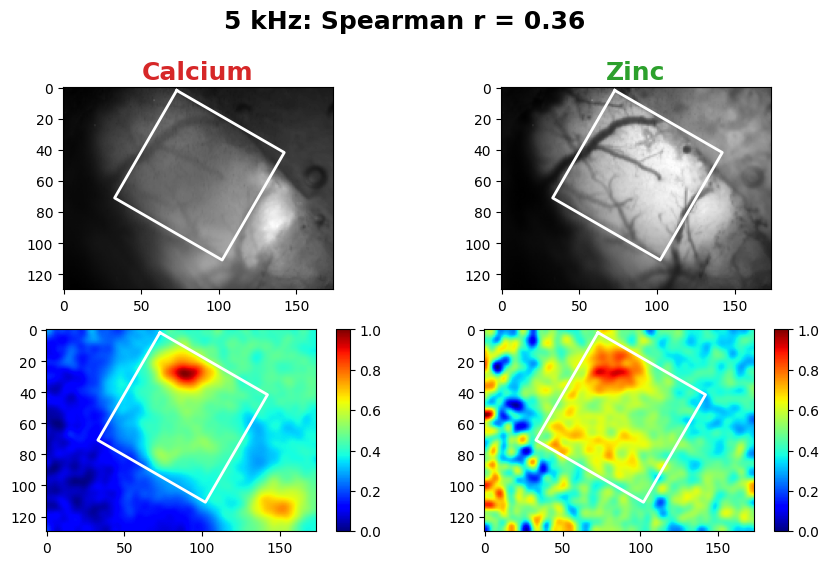

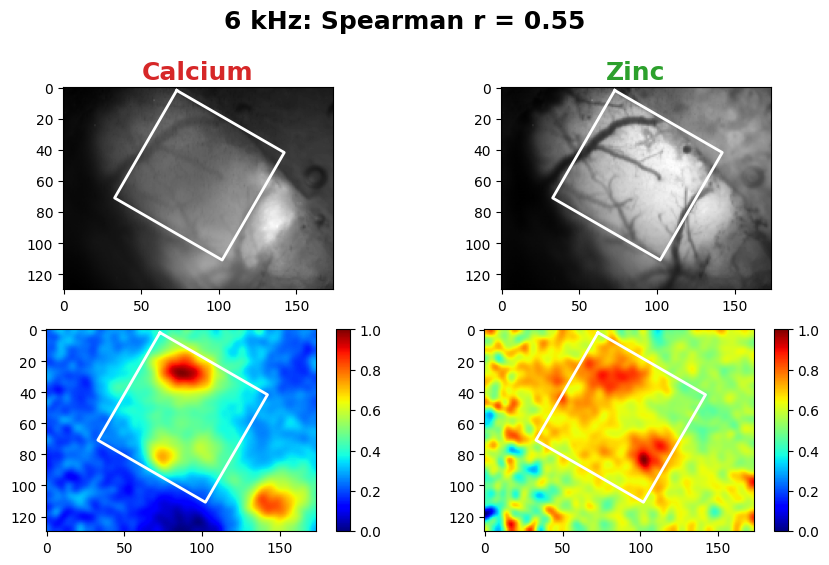

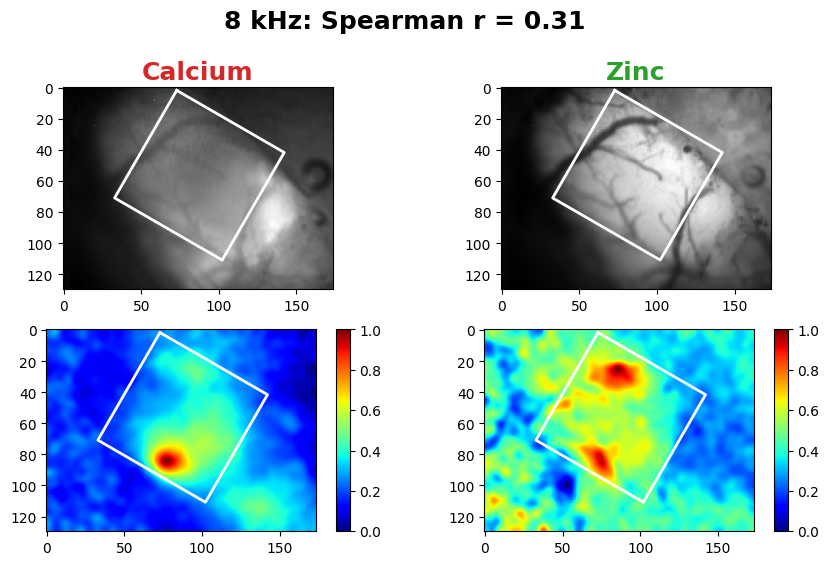

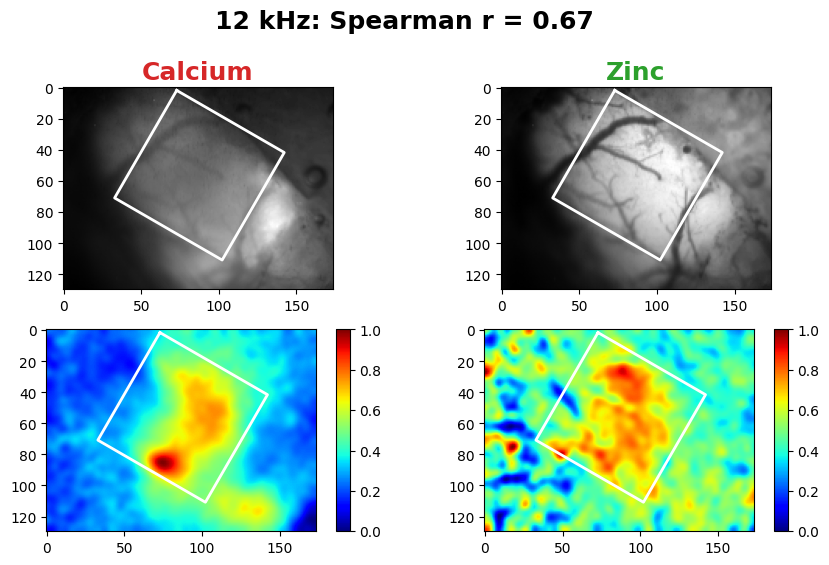

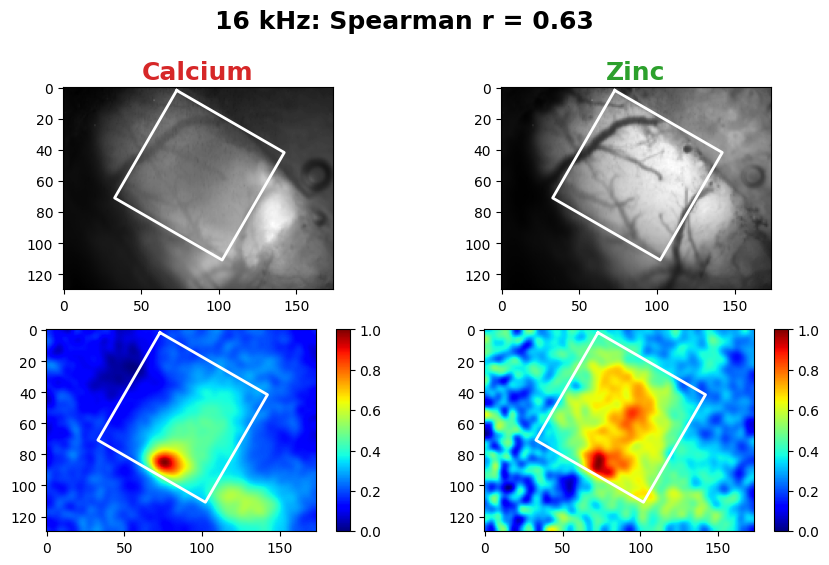

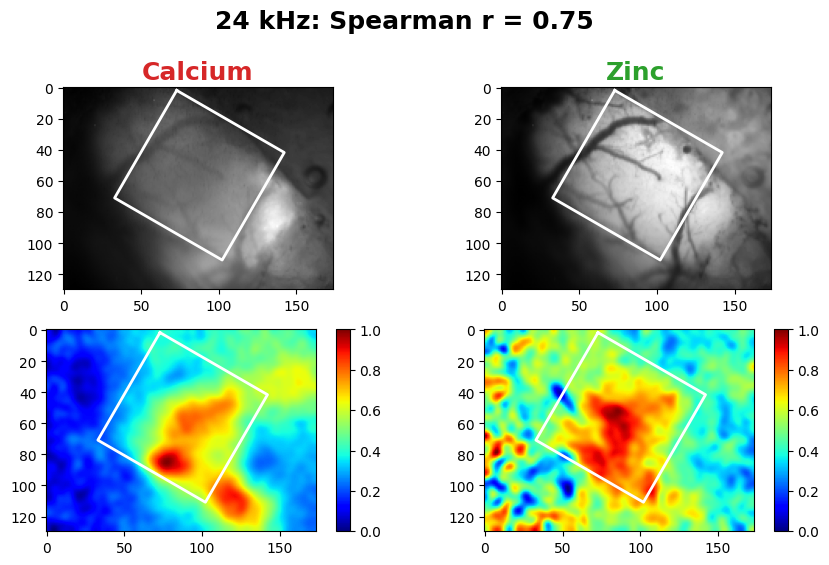

In [20]:
import joblib
import seaborn as sns
import lib.plotting as plotting

# Load binary ROI mask where Spearman correlation is computed
mask = joblib.load(common_path_spatial + r"\20251209\AA0001\response_mask_80by80.joblib")
mask_contour = joblib.load(common_path_spatial + r"\20251209\AA0001\response_mask_contour_80by80.joblib")

# Specify colors for calcium and zinc traces
palette_spatial = [sns.color_palette("tab20")[6], sns.color_palette("tab20")[4]]  # Red for calcium and green for zinc

# Plot blurred spatial DFF and Spearman coefficients for a representative animal (id 20251209)
freq2dFFresp_calcium_represent = freq2dFFresp_calcium['20251209']
freq2dFFresp_zinc_represent = freq2dFFresp_zinc['20251209']

test, _, _ = plotting.plot_blurred_respSpatialDFF(
    freq2dFFresp_calcium_represent, freq2dFFresp_zinc_represent, ksize=(15, 15), 
    display_wideField=True, display_traces=False, palette=palette_spatial, 
    mask=mask, mask_contour=mask_contour
)

### Figure 4E (Spearman coefficient, re frequency)

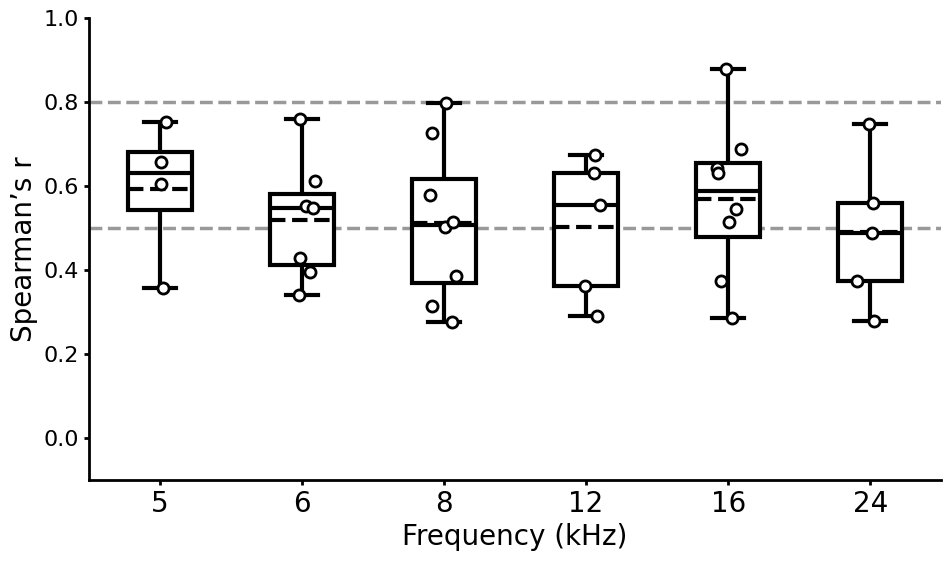

In [21]:
# Plot Spearman coefficients re frequency across animals
import lib.plotting as plotting

palette_spearman = ['k'] * 6
df_spatial = df_spatial.sort_values(by='Frequency (kHz)').reset_index(drop=True)  # Sort DataFrame by frequency in ascending order
plotting.plot_boxplot(df_spatial, x='Frequency (kHz)', y='Spearman_r', id=None, palette=palette_spearman, 
                      offset=0, jitter=0.1, show_xlabel=True, Yaxis_label='Spearman’s r', Yaxis_range=(-0.1, 1), axhline=[0.5, 0.8])

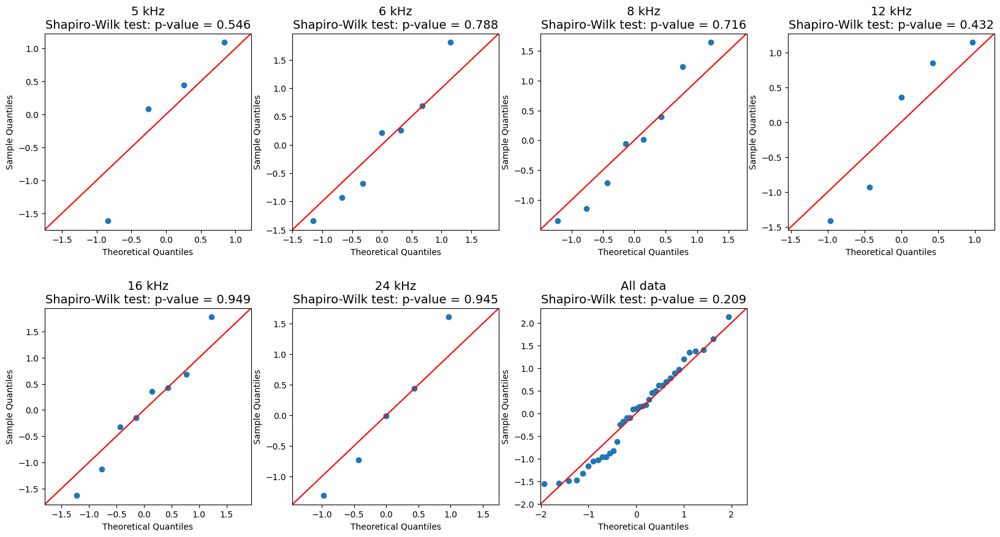

Spearman_r, one-sample t-test, mean vs 0:
5 kHz vs 0, p-value = 0.0059
6 kHz vs 0, p-value = 0.0001
8 kHz vs 0, p-value = 0.0001
12 kHz vs 0, p-value = 0.0026
16 kHz vs 0, p-value = 0.0001
24 kHz vs 0, p-value = 0.0037


In [22]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp

# Map frequencies to their corresponding Spearman_r values for Q-Q plot
qq_data = {
    freq: df_spatial.loc[df_spatial['Frequency (kHz)'] == freq, 'Spearman_r'].values
    for freq in df_spatial['Frequency (kHz)'].unique()
}

# Create Q-Q plot to test normality
fig, ax = plt.subplots(2, 4, figsize=(20, 10))
fig.subplots_adjust(hspace=0.4)
ax = ax.flatten()

# re frequency
for i, freq in enumerate(qq_data.keys()):
    sm.qqplot(qq_data[freq], fit=True, line='45', ax=ax[i])
    ax[i].set_title(
        f'{freq} kHz\nShapiro-Wilk test: p-value = {shapiro(qq_data[freq])[1]:.3f}', fontsize=14)
    
# Data from all frequencies combined
sm.qqplot(np.concatenate(list(qq_data.values())), fit=True, line='45', ax=ax[6])
ax[6].set_title(f'All data\nShapiro-Wilk test: p-value = {shapiro(np.concatenate(list(qq_data.values())))[1]:.3f}', fontsize=14)

# Turn off unused panel
ax[7].axis('off')

plt.show()

# One-sample t-test between mean and 0 re frequency
print('Spearman_r, one-sample t-test, mean vs 0:')
for freq in qq_data.keys():
    print(f'{freq} kHz vs 0, p-value = {ttest_1samp(qq_data[freq], 0)[1]:.4f}')

### Figure 4F (average adaptation trace, A1 vs AAF)

In [23]:
# Plot standard response amplitude (0.5s ISI, A1 vs AAF) re standard tone position (before the first deviant tone)
import numpy as np
import lib.signalProcess as signalProcess

# Exclude animal with old protocol to have more standard responses at the beginning
df_resp_zinc_halfSecISI_adapt = df_resp_trace_zinc_halfSecISI[~df_resp_trace_zinc_halfSecISI['id'].isin(['20250527', '20250530', '20250626'])].copy().reset_index(drop=True)

# Extract standard tone onset times before the first deviant tone
df_resp_zinc_halfSecISI_adapt['standard_times_pre'] = df_resp_zinc_halfSecISI_adapt.apply(
    lambda x: x['standard_times'][x['standard_times'] < x['deviant_times'][0]], 
    axis=1
)

# Have equal number of standard tones before the first deviant and after the last deviant
min_pre = df_resp_zinc_halfSecISI_adapt['standard_times_pre'].apply(len).min()
df_resp_zinc_halfSecISI_adapt['common_standard_times'] = df_resp_zinc_halfSecISI_adapt['standard_times_pre'].apply(lambda x: x[:min_pre])

# Add indices of standard tone positions as: 0, 1, 2, ..., min_pre-1
df_resp_zinc_halfSecISI_adapt['standard_posIDX'] = [np.arange(min_pre)] * len(df_resp_zinc_halfSecISI_adapt)

# Get traces within each common standard response windows and store as 2D array of shape [toneNumber, frame]
df_resp_zinc_halfSecISI_adapt['trace'] = df_resp_zinc_halfSecISI_adapt.apply(
    lambda x: signalProcess.calc_train_peakDFF(x['avg_trace'], x['time'], x['common_standard_times'], 
                                               t_resp=(0.3, 0.475), initial_t_excl=None)[0],  # Do not exclude any initial responses
    axis=1
)

# Calculate peak amplitude within each response window
df_resp_zinc_halfSecISI_adapt['response'] = df_resp_zinc_halfSecISI_adapt.apply(
    lambda x: signalProcess.getBaseResp(x['trace'], signalProcess.getTimeVec(x['trace'].shape[1], delayAdjust = -0.025), 
                                        t_base = (-0.025, -0.025), t_resp = (0.3, 0.475))[1], 
    axis=1
)

# Convert negative traces and responses to NaNs
df_resp_zinc_halfSecISI_adapt['trace'] = df_resp_zinc_halfSecISI_adapt.apply(
    lambda x: np.where((x['response'] < 0)[:, np.newaxis], np.nan, x['trace']),
    axis=1
)
df_resp_zinc_halfSecISI_adapt['response'] = df_resp_zinc_halfSecISI_adapt['response'].apply(lambda x: np.where(x < 0, np.nan, x))

# Average across the two pulse protocols
df_resp_zinc_halfSecISI_adapt = (
    df_resp_zinc_halfSecISI_adapt
    .groupby(['id', 'subfield', 'treatment'], sort=False)
    .agg({'standard_posIDX': 'first', 
          'trace': lambda x: np.nanmean(np.stack(x), axis=0), 
          'response': lambda x: np.nanmean(np.stack(x), axis=0)})
    .reset_index()
)
df_resp_zinc_halfSecISI_adapt.rename(columns={'standard_posIDX': 'Standard Tone Position Index', 'response': 'Response ΔF/F'}, inplace=True)

df_resp_zinc_halfSecISI_adapt

C:\Users\18440\AppData\Local\Temp\ipykernel_7216\3528447481.py:47: RuntimeWarning: Mean of empty slice
  'trace': lambda x: np.nanmean(np.stack(x), axis=0),
C:\Users\18440\AppData\Local\Temp\ipykernel_7216\3528447481.py:48: RuntimeWarning: Mean of empty slice
  'response': lambda x: np.nanmean(np.stack(x), axis=0)})


,id,subfield,treatment,Standard Tone Position Index,trace,Response ΔF/F
0,20251205,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0003279777291977106, 0.00072359925997...","[0.003185595403841456, 0.0003432465251064413, ..."
1,20251205,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.00018714389434396712, 0.0005142093260...","[0.0009161989395827038, 0.0006806222076959857,..."
2,20251209,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0005848528850080032, 0.00136141360527...","[0.006473584932088991, 0.0038747277839160195, ..."
3,20251209,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.00019827521794497073, 0.0003333478644...","[0.0015494120438255014, nan, 0.001836780540281..."
4,20251210,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 8.249752166314666e-05, 0.00028579014702...","[0.0012517207592501732, 0.0031087159963120196,..."
5,20251210,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.0005913567590109877, 0.00118938561745...","[0.00202300744556549, 0.003847485712809193, 0...."
6,20260107,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.00021022339381317488, 0.0004555411497...","[0.0030713327211556313, 0.001114524335480017, ..."
7,20260107,A1,postZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.00010896085557472854, 0.0002504199909...","[0.0007168238731243158, nan, 0.000783172890714..."
8,20260121,A1,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 8.184118364478444e-06, 0.00011480439280...","[0.0025192562355510107, 0.002003936869001122, ..."
9,20251205,AAF,preZX1,"[0, 1, 2, 3, 4, 5, 6, 7, 8]","[[0.0, 0.000303235505373132, 0.000812530132647...","[0.004837949908646409, 0.0012616050614078144, ..."


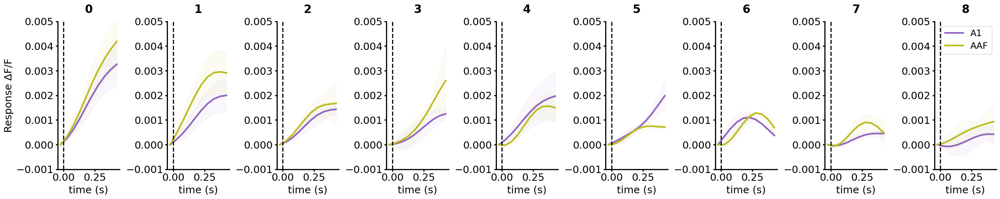

In [24]:
# Plot animal-averaged traces in response to standard tones before the first deviant tone (preZX1, A1 vs AAF)
import seaborn as sns
import lib.plotting as plotting

# Purple for A1 and olive yellow for AAF
zinc_halfSecISI_adapt_A1_AAF_dict = {'A1': sns.color_palette("tab20")[8], 'AAF': sns.color_palette("tab20")[16]}

# Plot preZX1 data only
df_resp_zinc_halfSecISI_adapt_pre = df_resp_zinc_halfSecISI_adapt[df_resp_zinc_halfSecISI_adapt['treatment'] == 'preZX1'].copy()

# Transform the DataFrame to long format
standard_posIDX = df_resp_zinc_halfSecISI_adapt_pre['Standard Tone Position Index'].iloc[0]  # Constant across all rows

id = np.repeat(df_resp_zinc_halfSecISI_adapt_pre['id'].values, len(standard_posIDX))
subfield = np.repeat(df_resp_zinc_halfSecISI_adapt_pre['subfield'].values, len(standard_posIDX))
pos = np.tile(standard_posIDX, len(df_resp_zinc_halfSecISI_adapt_pre))
trace = np.vstack(df_resp_zinc_halfSecISI_adapt_pre['trace'].values)  # 2D array of shape [n_rows*n_pos, frame]

df_resp_zinc_halfSecISI_adapt_A1_AAF = pd.DataFrame({
    'id': id,
    'subfield': subfield,
    'Standard Tone Position Index': pos,
    'trace': list(trace),
})

# Average across animals re subfield/position combination
df_resp_zinc_halfSecISI_adapt_A1_AAF = (
    df_resp_zinc_halfSecISI_adapt_A1_AAF
    .groupby(['subfield', 'Standard Tone Position Index'], sort=False)
    .agg({'trace': lambda x: np.vstack(x.values)})
    .reset_index()
)

fig = plotting.plot_oddball_trace_reTone(df_resp_zinc_halfSecISI_adapt_A1_AAF, x_col='Standard Tone Position Index', y_col=None, within_col='subfield', 
                                         color_palette=zinc_halfSecISI_adapt_A1_AAF_dict, Yaxis_label='Response ΔF/F', Yaxis_range=(-0.001, 0.005), plot_errBar=True)

### Figure 4G (adaptation response, A1 vs AAF)

#### Raw

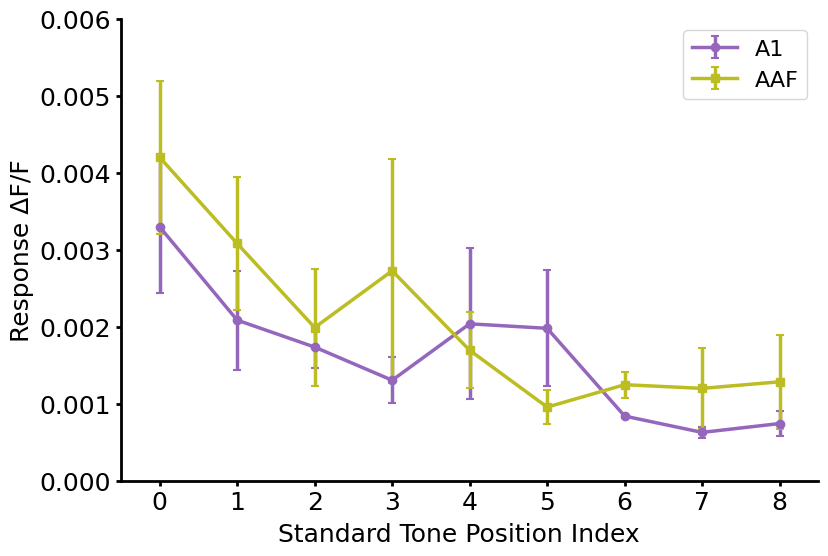

In [25]:
import seaborn as sns
import lib.plotting as plotting

# Purple for A1 and olive yellow for AAF
zinc_adapt_pre_palette = [sns.color_palette("tab20")[8], sns.color_palette("tab20")[16]]

# Raw amplitude
plotting.plot_lineplot_adaptation(df_resp_zinc_halfSecISI_adapt_pre, x='Standard Tone Position Index', y='Response ΔF/F', 
                                  group='subfield', palette=zinc_adapt_pre_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 0.006))

In [26]:
# Test significance of fixed-effect parameters (subfield and standard_posIDX) using mixed linear model regression
import statsmodels.formula.api as smf

df_mlm = df_resp_zinc_halfSecISI_adapt_pre.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Response ΔF/F': 'response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['response'] = df_mlm['response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['response'] = df_mlm['response'].astype(float)

# Drop NaNs
df_mlm = df_mlm.dropna().reset_index(drop=True)

model = smf.mixedlm("response ~ subfield * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                  Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       response
No. Observations:         77            Method:                   REML    
No. Groups:               5             Scale:                    0.0000  
Min. group size:          14            Log-Likelihood:           365.9493
Max. group size:          17            Converged:                Yes     
Mean group size:          15.4                                            
--------------------------------------------------------------------------
                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------------
Intercept                        0.003    0.000  6.040 0.000  0.002  0.004
subfield[T.AAF]                  0.001    0.001  1.475 0.140 -0.000  0.002
standard_posIDX                 -0.000    0.000 -3.109 0.002 -0.000 -0.000
subfield[T.AAF]:standard_posIDX -0.000    0.

C:\Users\18440\AppData\Local\Temp\ipykernel_7216\3641860826.py:18: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  result = model.fit()


#### Normalized

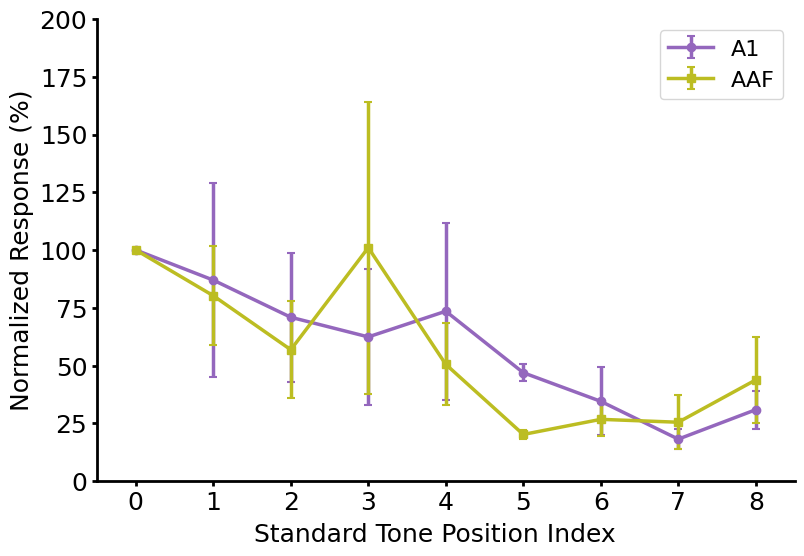

In [27]:
import seaborn as sns
import lib.plotting as plotting

# Normalize to the first standard response for both A1 and AAF
df_resp_zinc_halfSecISI_adapt_pre_norm = df_resp_zinc_halfSecISI_adapt_pre.copy()
df_resp_zinc_halfSecISI_adapt_pre_norm['Normalized Response (%)'] = df_resp_zinc_halfSecISI_adapt_pre_norm['Response ΔF/F'].apply(lambda x: x / x[0] * 100)

# Purple for A1 and olive yellow for AAF
zinc_adapt_pre_palette = [sns.color_palette("tab20")[8], sns.color_palette("tab20")[16]]

plotting.plot_lineplot_adaptation(df_resp_zinc_halfSecISI_adapt_pre_norm, x='Standard Tone Position Index', y='Normalized Response (%)', 
                                  group='subfield', palette=zinc_adapt_pre_palette, 
                                  markers=['o', 's'], Yaxis_range=(0, 200))

In [28]:
# Test significance of fixed-effect parameters (subfield and standard_posIDX) using mixed linear model regression
import statsmodels.formula.api as smf

df_mlm = df_resp_zinc_halfSecISI_adapt_pre_norm.copy()
df_mlm.rename(columns={'Standard Tone Position Index': 'standard_posIDX', 'Normalized Response (%)': 'norm_response'}, inplace=True)

# Convert 1D numpy arrays to lists (df.explode only works with lists)
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].apply(list)
df_mlm['norm_response'] = df_mlm['norm_response'].apply(list)
df_mlm = df_mlm.explode(['standard_posIDX', 'norm_response'])
df_mlm['standard_posIDX'] = df_mlm['standard_posIDX'].astype(int)
df_mlm['norm_response'] = df_mlm['norm_response'].astype(float)

# Skip the first standard response
df_mlm = df_mlm[df_mlm['standard_posIDX'] != 0]
df_mlm = df_mlm.dropna().reset_index(drop=True)  # Drop NaNs

model = smf.mixedlm("norm_response ~ subfield * standard_posIDX", df_mlm, groups=df_mlm['id'])
result = model.fit()
print(result.summary())

                    Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       norm_response
No. Observations:        67            Method:                   REML         
No. Groups:              5             Scale:                    2088.2974    
Min. group size:         12            Log-Likelihood:           -343.2189    
Max. group size:         15            Converged:                Yes          
Mean group size:         13.4                                                 
------------------------------------------------------------------------------
                                 Coef.   Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         93.038   22.227  4.186 0.000  49.473 136.604
subfield[T.AAF]                   -8.523   22.904 -0.372 0.710 -53.414  36.367
standard_posIDX                   -8.091    3.319 -2.438 0.015 -14.595  -

## Figure 5 (calcium & zinc, 1s ISI)

### Calcium

#### Load oddball metadata and process (calcium, A1 & AAF, 1s ISI)

In [29]:
# Initialize experiment group object in A1/AAF with 1s ISI
import pandas as pd
import lib.experiment_oop as exp

# Define path
dPaths_calcium_1SecISI_A1 = [
    common_path_oddball + r"\20250904\AA0001\Oddball\Control", 
    common_path_oddball + r"\20250908\AA0001\Oddball\Control", 
    common_path_oddball + r"\20251002\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251006\AA0001\RGECO\Oddball_70dB", 
    common_path_oddball + r"\20251007\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251104\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251105\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251110\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251205\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20251208\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20251209\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20251210\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20260121\AA0001\RGECO\Oddball_1secISI"
]

dPaths_calcium_1SecISI_AAF = [
    common_path_oddball + r"\20250904\AA0001\Oddball\Control", 
    common_path_oddball + r"\20250908\AA0001\Oddball\Control", 
    common_path_oddball + r"\20251002\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251006\AA0001\RGECO\Oddball_70dB", 
    common_path_oddball + r"\20251007\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251104\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251105\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251110\AA0001\RGECO\Oddball", 
    common_path_oddball + r"\20251205\AA0001\RGECO\Oddball_1secISI", 
    # common_path_oddball + r"\20251208\AA0001\RGECO\Oddball_1secISI",  # Only one hotspot observed (assumed to be A1)
    common_path_oddball + r"\20251209\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20251210\AA0001\RGECO\Oddball_1secISI", 
    common_path_oddball + r"\20260121\AA0001\RGECO\Oddball_1secISI"
]

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.0, 4.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_calcium_1SecISI_A1 = exp.ExperimentGroup(dPaths_calcium_1SecISI_A1, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')
group_calcium_1SecISI_AAF = exp.ExperimentGroup(dPaths_calcium_1SecISI_AAF, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_calcium_1SecISI_A1.load_qcam_data()
group_calcium_1SecISI_AAF.load_qcam_data()

# Process qcam files re saved ROI
group_calcium_1SecISI_A1.process_signal(mask_name='response_mask_A1', add_filtered_data=False, test_negative=False)
group_calcium_1SecISI_AAF.process_signal(mask_name='response_mask_AAF', add_filtered_data=False, test_negative=False)

# Extract oddball trials in A1/AAF and combine
df_oddball_calcium_1SecISI_A1 = group_calcium_1SecISI_A1.df[group_calcium_1SecISI_A1.df['pulse'].str.contains('oddball')].copy()
df_oddball_calcium_1SecISI_A1['subfield'] = 'A1'
df_oddball_calcium_1SecISI_AAF = group_calcium_1SecISI_AAF.df[group_calcium_1SecISI_AAF.df['pulse'].str.contains('oddball')].copy()
df_oddball_calcium_1SecISI_AAF['subfield'] = 'AAF'
df_oddball_calcium_1SecISI = pd.concat([df_oddball_calcium_1SecISI_A1, df_oddball_calcium_1SecISI_AAF], ignore_index=True)
df_oddball_calcium_1SecISI['id'] = df_oddball_calcium_1SecISI['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_calcium_1SecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")


,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 17:55:53,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[7.948218749999995, 8.95446874999999, 8.796968...",6.576344,"[7.802490915771571, 8.811684912422649, 8.65712...",6.633752,"[0.10301136821573399, 0.11605267879454535, 0.1...",0.085231,"[0.10259346237244273, 0.11586316142619406, 0.1...",0.087226,A1,20250904
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 17:59:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[3.7019374999999997, 3.4731875000000088, 2.888...",8.488813,"[3.663467329336129, 3.435494504501065, 2.85189...",8.510185,"[0.05069589056103475, 0.04756329176220677, 0.0...",0.116249,"[0.05174993598683158, 0.04852960452721144, 0.0...",0.120214,A1,20250904
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:02:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[4.10984375000001, 5.385468750000015, 6.106093...",7.061719,"[4.064060588941359, 5.34061050128598, 6.062160...",7.087154,"[0.05616446838813564, 0.07359695593407109, 0.0...",0.096504,"[0.057179553456709144, 0.07514005191770289, 0....",0.099713,A1,20250904
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:04:59,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-2.421406250000004, -2.69140625, -3.178281249...",2.314844,"[-2.574420572326659, -2.8413293738958174, -3.3...",2.387487,"[-0.031523019310061504, -0.0350380078477001, -...",0.030136,"[-0.03423174969401761, -0.037780802783734115, ...",0.031746,A1,20250904
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:07:39,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-1.3383437500000213, -0.7920937500000207, -0....",1.330406,"[-1.3904425332404173, -0.8431400325688969, -0....",1.353035,"[-0.01731414292223237, -0.010247310823775386, ...",0.017211,"[-0.01755646186507678, -0.01064593140301755, -...",0.017084,A1,20250904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,postZX1,1740,2026-01-21 21:20:45,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.5445312499999986, 1.6507812500000014, 1.652...",1.175781,"[1.505140648872164, 1.612186418591918, 1.61423...",1.188116,"[0.028244551815966076, 0.030187525537246546, 0...",0.021501,"[0.027830073388538424, 0.02980935129154745, 0....",0.021968,AAF,20260121
280,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,postZX1,1740,2026-01-21 21:23:23,"(130, 174)","[[False, False, False, False, False, False, Fa...",..

In [1]:
import joblib
# joblib.dump(df_oddball_calcium_1SecISI, '../data/cache/oddball_calcium_1SecISI.joblib')

df_oddball_calcium_1SecISI = joblib.load('../data/cache/oddball_calcium_1SecISI.joblib')
df_oddball_calcium_1SecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_raw,dF_ROI_raw_peak,dF_ROI_linFilt,dF_ROI_linFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_linFilt,dFF_ROI_linFilt_peak,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 17:55:53,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[7.948218749999995, 8.95446874999999, 8.796968...",6.576344,"[7.802490915771571, 8.811684912422649, 8.65712...",6.633752,"[0.10301136821573399, 0.11605267879454535, 0.1...",0.085231,"[0.10259346237244273, 0.11586316142619406, 0.1...",0.087226,A1,20250904
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 17:59:07,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[3.7019374999999997, 3.4731875000000088, 2.888...",8.488813,"[3.663467329336129, 3.435494504501065, 2.85189...",8.510185,"[0.05069589056103475, 0.04756329176220677, 0.0...",0.116249,"[0.05174993598683158, 0.04852960452721144, 0.0...",0.120214,A1,20250904
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:02:10,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[4.10984375000001, 5.385468750000015, 6.106093...",7.061719,"[4.064060588941359, 5.34061050128598, 6.062160...",7.087154,"[0.05616446838813564, 0.07359695593407109, 0.0...",0.096504,"[0.057179553456709144, 0.07514005191770289, 0....",0.099713,A1,20250904
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:04:59,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-2.421406250000004, -2.69140625, -3.178281249...",2.314844,"[-2.574420572326659, -2.8413293738958174, -3.3...",2.387487,"[-0.031523019310061504, -0.0350380078477001, -...",0.030136,"[-0.03423174969401761, -0.037780802783734115, ...",0.031746,A1,20250904
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-09-04 18:07:39,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[-1.3383437500000213, -0.7920937500000207, -0....",1.330406,"[-1.3904425332404173, -0.8431400325688969, -0....",1.353035,"[-0.01731414292223237, -0.010247310823775386, ...",0.017211,"[-0.01755646186507678, -0.01064593140301755, -...",0.017084,A1,20250904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,postZX1,1740,2026-01-21 21:20:45,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,"[1.5445312499999986, 1.6507812500000014, 1.652...",1.175781,"[1.505140648872164, 1.612186418591918, 1.61423...",1.188116,"[0.028244551815966076, 0.030187525537246546, 0...",0.021501,"[0.027830073388538424, 0.02980935129154745, 0....",0.021968,AAF,20260121
280,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,postZX1,1740,2026-01-21 21:23:23,"(130, 174)","[[False, False, False, False, False, False, Fa...",..

In [2]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_calcium_1SecISI_old = [71, 63, 13, 33, 53, 10, 61, 21]  # id 20251208, 20251209, 20251210
deviant_pos_calcium_1SecISI_new = [13, 28, 32, 34, 56, 57, 71, 74]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_calcium_1SecISI_old = signalProcess.get_oddball_pos(deviant_pos_calcium_1SecISI_old, stim_ISI=1, stim_count=80)
onset_times_calcium_1SecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_1SecISI_new, stim_ISI=1, stim_count=80)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_calcium_1SecISI_all = {
    '20250904': onset_times_calcium_1SecISI_new,
    '20250908': onset_times_calcium_1SecISI_new,
    '20251002': onset_times_calcium_1SecISI_new,
    '20251006': onset_times_calcium_1SecISI_new,
    '20251007': onset_times_calcium_1SecISI_new,
    '20251104': onset_times_calcium_1SecISI_new,
    '20251105': onset_times_calcium_1SecISI_new,
    '20251110': onset_times_calcium_1SecISI_new,
    '20251205': onset_times_calcium_1SecISI_new,
    '20260121': onset_times_calcium_1SecISI_new,

    '20251208': onset_times_calcium_1SecISI_old,
    '20251209': onset_times_calcium_1SecISI_old,
    '20251210': onset_times_calcium_1SecISI_old
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_calcium_temp = []

for (id, subfield), df_sub_calcium in df_oddball_calcium_1SecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_calcium = onset_times_calcium_1SecISI_all[id]
    
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False  # t_resp consistent with 0.5s-ISI
    )

    # Restore metadata columns
    df_resp_trace_calcium['id'] = id
    df_resp_trace_calcium['subfield'] = subfield

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_trace_calcium_1SecISI = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_trace_calcium_1SecISI = df_resp_trace_calcium_1SecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_calcium_1SecISI

,id,subfield,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20250904,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.10259346237244273, 0.11586316142619406, 0....","[0.025470274402813613, 0.03285036217472832, 0....","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
1,20250904,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.05174993598683158, 0.04852960452721144, 0....","[-0.007703327796077152, -0.0034300105750910445...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
2,20250908,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.029173585403298473, 0.02904181900535734, 0...","[0.00889531704973676, 0.009106146634261084, 0....","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
3,20250908,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.034959228442413476, 0.028777894757598194, ...","[0.00819289621517519, 0.005131433990253751, 0....","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
4,20251002,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.04653145235148447, -0.0389094066899858, -...","[-0.018299443924364903, -0.014210287564915332,...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
...,...,...,...,...,...,...,...,...,...
67,20251210,AAF,postZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.03193405613694662, 0.016549894157809646, 0...","[0.0031200827586159905, -0.0013613514289468349...","[12.0, 15.0, 23.0, 35.0, 55.0, 63.0, 65.0, 73.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
68,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.006854163706024218, 0.00882281938015153, 0...","[0.005755234564162235, 0.006935570519740701, 0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
69,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[-0.0019431826451642928, 0.000210246588159866...","[-0.004140327644786001, -0.0056855936557243, -...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
70,20260121,AAF,postZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.027830073388538424, 0.02980935129154745, 0...","[0.013160931312024463, 0.009606090952316371, 0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."


In [3]:
# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_calcium_temp = []

for (id, subfield), df_sub_calcium in df_resp_trace_calcium_1SecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_calcium = signalProcess.add_oddball_respData(df_sub_calcium, t_resp=(0, 0.475))  # t_resp consistent with 0.5s-ISI

    # Restore metadata columns
    df_resp_peak_calcium['id'] = id
    df_resp_peak_calcium['subfield'] = subfield

    df_resp_peak_calcium_temp.append(df_resp_peak_calcium)

df_resp_peak_calcium_1SecISI = pd.concat(df_resp_peak_calcium_temp, ignore_index=True)
df_resp_peak_calcium_1SecISI = df_resp_peak_calcium_1SecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_calcium_1SecISI

,id,subfield,treatment,pulse,stimulus,trace,response
0,20250904,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0003983522424036729, 0.00187035819687...",0.022886
1,20250904,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.001457175431534525, -0.0010742946045...",0.008129
2,20250904,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0013268330166771672, -0.001961834478...",0.003926
3,20250904,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0043103205158516456, -0.005162894009...",0.009318
4,20250908,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.002237220812043759, 0.014401118475573...",0.030086
...,...,...,...,...,...,...,...
139,20260121,AAF,postZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.004074071125915228, 0.009411882398232...",0.009286
140,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0009956331888207118, 0.0089011081927...",0.006821
141,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0011186456147705276, 0.0038685030119...",0.005474
142,20260121,AAF,postZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0009398342570057731, -0.002009551517...",0.001680


#### Figure 5A (response, Deviant vs Standard, re subfield, 1s ISI)

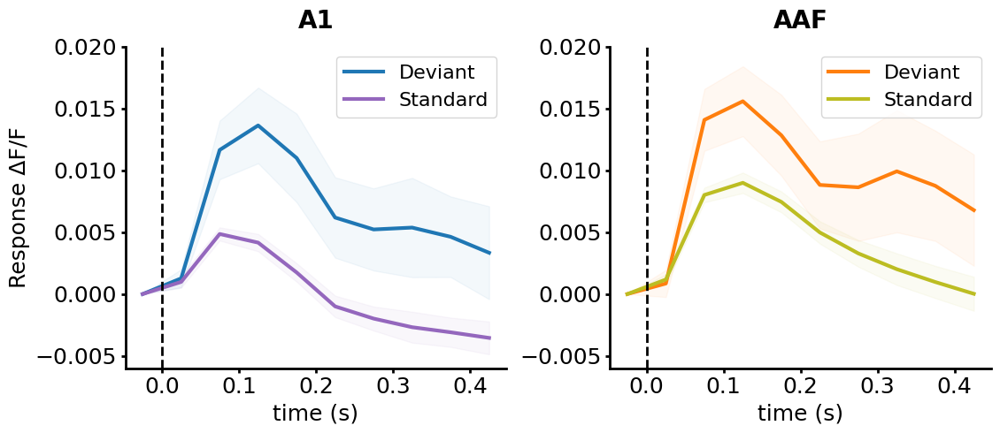

In [4]:
# Plot representative traces Deviant vs Standard re subfield
import seaborn as sns
import lib.plotting as plotting

df_resp_calcium_1SecISI_subfield = df_resp_peak_calcium_1SecISI[df_resp_peak_calcium_1SecISI['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_resp_calcium_1SecISI_subfield[['dev_freq', 'std_freq']] = df_resp_calcium_1SecISI_subfield['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_calcium_1SecISI_subfield['Frequency'] = df_resp_calcium_1SecISI_subfield.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_calcium_1SecISI_subfield.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_calcium_1SecISI_subfield = df_resp_calcium_1SecISI_subfield[['id', 'subfield', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
calcium_resp_subfield_palette = {('A1', 'Deviant'): sns.color_palette("tab20")[0], ('A1', 'Standard'): sns.color_palette("tab20")[8], 
                                 ('AAF', 'Deviant'): sns.color_palette("tab20")[2], ('AAF', 'Standard'): sns.color_palette("tab20")[16]}

# Representative animal: 20251205, 16kHz
df_resp_calcium_1SecISI_subfield_represent = df_resp_calcium_1SecISI_subfield[
    (df_resp_calcium_1SecISI_subfield['id'] == '20251205') & (df_resp_calcium_1SecISI_subfield['Frequency'] == '16kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_calcium_1SecISI_subfield_represent, trace_col='trace', x_col='subfield', y_col=None, within_col='stimulus', 
                                         color_palette=calcium_resp_subfield_palette, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.006, 0.02), plot_errBar=True)

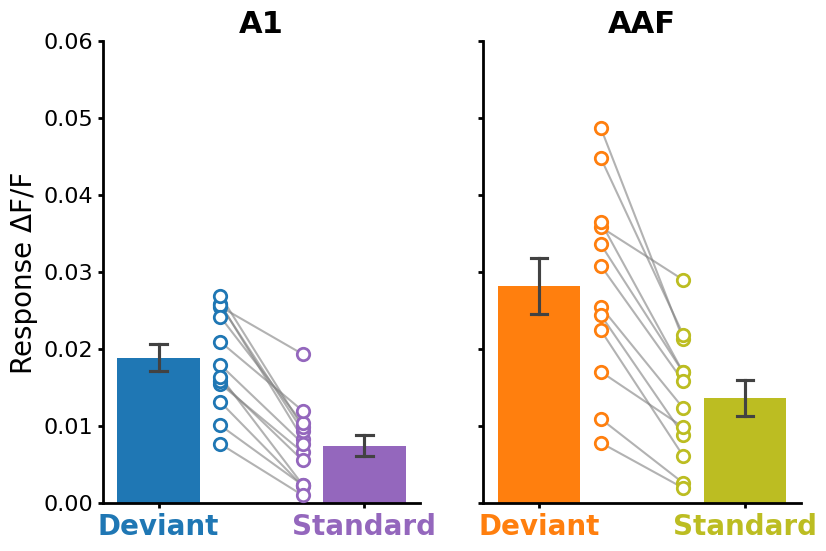

In [5]:
# Plot response amplitudes Deviant vs Standard re subfield

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
calcium_resp_subfield_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[8], 
                                 sns.color_palette("tab20")[2], sns.color_palette("tab20")[16]]

# Average across the two pulse protocols
df_resp_calcium_1SecISI_subfield = (
    df_resp_calcium_1SecISI_subfield.copy()
    .groupby(['id', 'subfield', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_calcium_1SecISI_subfield, x='stimulus', y='Response ΔF/F', group='subfield', id='id', 
                      palette=calcium_resp_subfield_palette, offset=0.3, Yaxis_range=(0, 0.06), title_color='k')

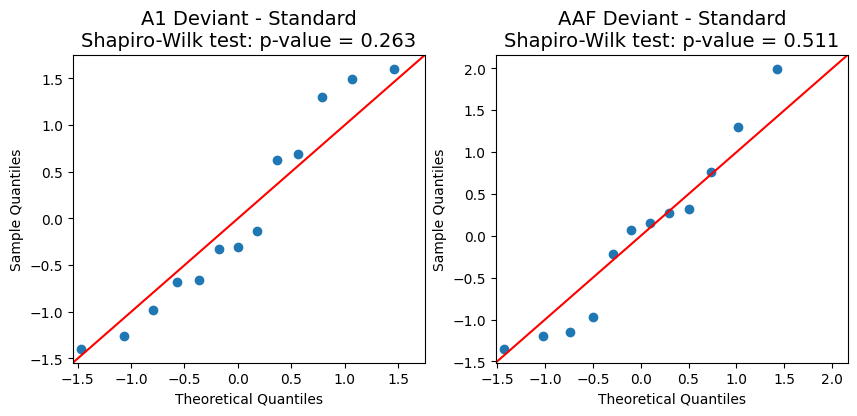

Response amplitude, A1 Deviant vs Standard, paired t-test, p-value = 0.0000
Response amplitude, AAF Deviant vs Standard, paired t-test, p-value = 0.0000


In [6]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each stimulus re subfield paired by id
df_pivot_A1 = (
    df_resp_calcium_1SecISI_subfield[df_resp_calcium_1SecISI_subfield['subfield'] == 'A1'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_A1 = df_pivot_A1.columns.tolist()
groups_A1 = [df_pivot_A1[col].to_numpy() for col in group_label_A1]

df_pivot_AAF = (
    df_resp_calcium_1SecISI_subfield[df_resp_calcium_1SecISI_subfield['subfield'] == 'AAF'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of the differences between Deviant and Standard re subfield
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_A1[0] - groups_A1[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_AAF[0] - groups_AAF[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'A1 {group_label_A1[0]} - {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[0] - groups_A1[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'AAF {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0] - groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between Deviant and Standard re subfield
print(f"Response amplitude, A1 {group_label_A1[0]} vs {group_label_A1[1]}, paired t-test, p-value = {ttest_rel(groups_A1[0], groups_A1[1])[1]:.4f}")
print(f"Response amplitude, AAF {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

#### Figure 5B (SI, 0.5s vs 1s ISI, re subfield)

In [7]:
# Load calcium oddball data with 0.5s ISI

import joblib
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

df_oddball_calcium_halfSecISI = joblib.load('../data/cache/oddball_calcium_halfSecISI.joblib')

# Load deviant tone positions
deviant_pos_calcium_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20251110
deviant_pos_calcium_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_calcium_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_calcium_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_calcium_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_calcium_halfSecISI_all = {
    '20251110': onset_times_calcium_halfSecISI_old,

    '20251205': onset_times_calcium_halfSecISI_new,
    '20251208': onset_times_calcium_halfSecISI_new,
    '20251209': onset_times_calcium_halfSecISI_new,
    '20251210': onset_times_calcium_halfSecISI_new,
    '20260121': onset_times_calcium_halfSecISI_new,
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_calcium_temp = []

for (id, subfield), df_sub_calcium in df_oddball_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_calcium = onset_times_calcium_halfSecISI_all[id]
    
    df_resp_trace_calcium = plotting.plot_oddball_wholeTrace(
        df_sub_calcium, onset_times_calcium, resp_col='dFF_ROI_linFilt', t_resp=(0, 0.475), plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_calcium['id'] = id
    df_resp_trace_calcium['subfield'] = subfield

    df_resp_trace_calcium_temp.append(df_resp_trace_calcium)

df_resp_trace_calcium_halfSecISI = pd.concat(df_resp_trace_calcium_temp, ignore_index=True)
df_resp_trace_calcium_halfSecISI = df_resp_trace_calcium_halfSecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]

# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_calcium_temp = []

for (id, subfield), df_sub_calcium in df_resp_trace_calcium_halfSecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_calcium = signalProcess.add_oddball_respData(df_sub_calcium, t_resp=(0, 0.475))

    # Restore metadata columns
    df_resp_peak_calcium['id'] = id
    df_resp_peak_calcium['subfield'] = subfield

    df_resp_peak_calcium_temp.append(df_resp_peak_calcium)

df_resp_peak_calcium_halfSecISI = pd.concat(df_resp_peak_calcium_temp, ignore_index=True)
df_resp_peak_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]

# Only keep animals with both 0.5s ISI and 1s ISI data
df_SI_calcium_halfSecISI = df_resp_peak_calcium_halfSecISI[
    (df_resp_peak_calcium_halfSecISI['id'].isin(['20251110', '20251205', '20251208', '20251209', '20251210', '20260121'])) & 
    (df_resp_peak_calcium_halfSecISI['treatment'] == 'preZX1')
].copy().reset_index(drop=True)
df_SI_calcium_halfSecISI['ISI'] = '0.5s'

df_SI_calcium_halfSecISI

,id,subfield,treatment,pulse,stimulus,trace,response,ISI
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978,0.5s
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318,0.5s
2,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0001977644519279842, 0.0030473702945...",0.005420,0.5s
3,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0051201483196876285, -0.001174362491...",0.003888,0.5s
4,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.002609966556585158, 0.01193033963723...",0.008015,0.5s
5,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0037381759274491295, 0.0253122985214...",0.020646,0.5s
6,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0004612914563719775, 0.0122983964906...",0.006683,0.5s
7,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.007192571032494519, -0.0130844991142...",0.002554,0.5s
8,20251208,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.001958009624494106, 0.00546761041867...",0.009879,0.5s
9,20251208,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.002948853225363876, 0.019679239515430...",0.027646,0.5s


In [8]:
# Concatenate with 1s ISI data
df_SI_calcium_1SecISI = df_resp_peak_calcium_1SecISI[
    (df_resp_peak_calcium_1SecISI['id'].isin(['20251110', '20251205', '20251208', '20251209', '20251210', '20260121'])) & 
    (df_resp_peak_calcium_1SecISI['treatment'] == 'preZX1')
].copy().reset_index(drop=True)
df_SI_calcium_1SecISI['ISI'] = '1s'

df_SI_calcium = pd.concat([df_SI_calcium_halfSecISI, df_SI_calcium_1SecISI], ignore_index=True)
df_SI_calcium

,id,subfield,treatment,pulse,stimulus,trace,response,ISI
0,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0036751536877816238, 0.01346523312156...",0.032978,0.5s
1,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0030805470865800932, -0.001219469400...",0.008318,0.5s
2,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0001977644519279842, 0.0030473702945...",0.005420,0.5s
3,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, -0.0051201483196876285, -0.001174362491...",0.003888,0.5s
4,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.002609966556585158, 0.01193033963723...",0.008015,0.5s
...,...,...,...,...,...,...,...,...
83,20251210,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.000328421021705938, -0.00218599881943...",0.002021,1s
84,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0019431188673065787, 0.0070888814735...",0.014339,1s
85,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0004160312219793126, 0.0085154930712...",0.030595,1s
86,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0009956331888207118, 0.0089011081927...",0.006821,1s


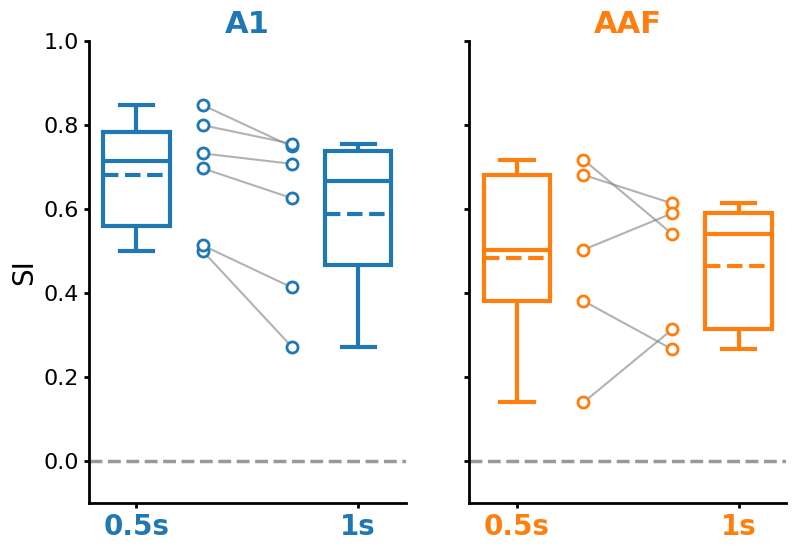

In [9]:
# Plot normalized stimulus-specific adaptation indices (SI) re subfield (0.5s vs 1s ISI)
import seaborn as sns
import lib.plotting as plotting

# Blue for A1, orange for AAF
calcium_ISI_subfield_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[0], 
                                sns.color_palette("tab20")[2], sns.color_palette("tab20")[2]]
df_SI_calcium_plot = df_SI_calcium.copy()

# Extract Deviant and Standard frequencies
df_SI_calcium_plot[['dev_freq', 'std_freq']] = df_SI_calcium_plot['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_plot['Frequency'] = df_SI_calcium_plot.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/ISI/subfield/frequency combination
df_SI_calcium_plot = (
    df_SI_calcium_plot
    .pivot_table(index=['id', 'ISI', 'subfield', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_calcium_plot = (
    df_SI_calcium_plot
    .groupby(['id', 'ISI', 'subfield'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_plot, x='ISI', y='SI', group='subfield', id='id', 
                      palette=calcium_ISI_subfield_palette, Yaxis_range=(-0.1, 1))

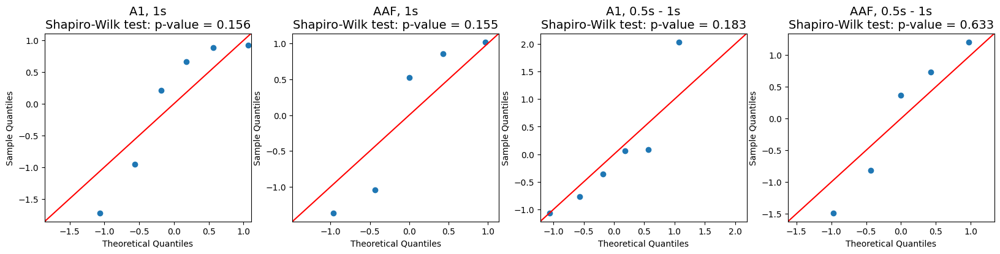

SI, A1, 1s vs 0, one-sample t-test, p-value = 0.0008
SI, AAF, 1s vs 0, one-sample t-test, p-value = 0.0031
SI, A1, 0.5s vs 1s, paired t-test, p-value = 0.0234
SI, AAF, 0.5s vs 1s, paired t-test, p-value = 0.7761


In [10]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each ISI paired by id re subfield
df_pivot_A1 = df_SI_calcium_plot[df_SI_calcium_plot['subfield'] == 'A1'].pivot_table(index='id', columns='ISI', values='SI', sort=False)
group_label_A1 = df_pivot_A1.columns.tolist()
groups_A1 = [df_pivot_A1[col].to_numpy() for col in group_label_A1]

df_pivot_AAF = df_SI_calcium_plot[df_SI_calcium_plot['subfield'] == 'AAF'].pivot_table(index='id', columns='ISI', values='SI', sort=False)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of 1s ISI and the differences between 0.5s and 1s ISI re subfield
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups_A1[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_AAF[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups_A1[0]-groups_A1[1], fit=True, line='45', ax=ax[2])
sm.qqplot(groups_AAF[0]-groups_AAF[1], fit=True, line='45', ax=ax[3])
ax[0].set_title(f'A1, {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'AAF, {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'A1, {group_label_A1[0]} - {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[0]-groups_A1[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'AAF, {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0]-groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 for 1s ISI re subfield
print(f"SI, A1, {group_label_A1[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_A1[1], 0)[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_AAF[1], 0)[1]:.4f}")

# Paired t-test between 0.5s and 1s ISI re subfield
print(f"SI, A1, {group_label_A1[0]} vs {group_label_A1[1]}, paired t-test, p-value = {ttest_rel(groups_A1[0], groups_A1[1])[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

#### Figure 5C (SI, preZX1 vs postZX1, re subfield, 1s ISI)

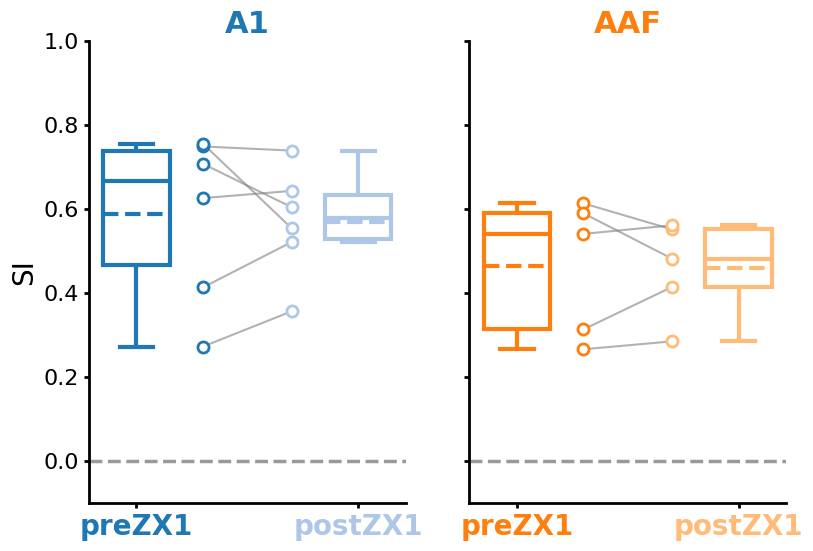

In [11]:
# Plot normalized stimulus-specific adaptation indices (SI) preZX1 vs postZX1 re subfield
import seaborn as sns
import lib.plotting as plotting

# Blue for A1, orange for AAF. Darker color for preZX1, lighter color for postZX1
calcium_prePost_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[1], 
                           sns.color_palette("tab20")[2], sns.color_palette("tab20")[3]]
df_SI_calcium_1SecISI = df_resp_peak_calcium_1SecISI[
    df_resp_peak_calcium_1SecISI['id'].isin(['20251110', '20251205', '20251208', '20251209', '20251210', '20260121'])
].copy()
# df_SI_calcium_1SecISI = df_SI_calcium_1SecISI[df_SI_calcium_1SecISI['id'] != '20251208'].copy()  # Exclude animal with only A1 identified

# Extract Deviant and Standard frequencies
df_SI_calcium_1SecISI[['dev_freq', 'std_freq']] = df_SI_calcium_1SecISI['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_1SecISI['Frequency'] = df_SI_calcium_1SecISI.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/subfield/treatment/frequency combination
df_SI_calcium_1SecISI = (
    df_SI_calcium_1SecISI
    .pivot_table(index=['id', 'subfield', 'treatment', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_calcium_1SecISI = (
    df_SI_calcium_1SecISI
    .groupby(['id', 'subfield', 'treatment'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_1SecISI, x='treatment', y='SI', group='subfield', id='id', 
                      palette=calcium_prePost_palette, offset=0.3, Yaxis_range=(-0.1, 1))

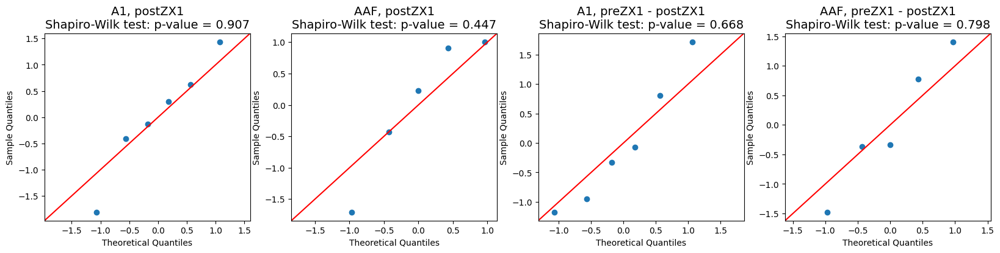

SI, A1, postZX1 vs 0, one-sample t-test, p-value = 0.0001
SI, AAF, postZX1 vs 0, one-sample t-test, p-value = 0.0008
SI, A1, preZX1 vs postZX1, paired t-test, p-value = 0.7287
SI, AAF, preZX1 vs postZX1, paired t-test, p-value = 0.8784


In [12]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each treatment paired by id re subfield
df_pivot_A1 = df_SI_calcium_1SecISI[df_SI_calcium_1SecISI['subfield'] == 'A1'].pivot_table(index='id', columns='treatment', values='SI', sort=False)
group_label_A1 = df_pivot_A1.columns.tolist()
groups_A1 = [df_pivot_A1[col].to_numpy() for col in group_label_A1]

df_pivot_AAF = df_SI_calcium_1SecISI[df_SI_calcium_1SecISI['subfield'] == 'AAF'].pivot_table(index='id', columns='treatment', values='SI', sort=False)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of postZX1 and the differences between preZX1 and postZX1 re subfield
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups_A1[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_AAF[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups_A1[0]-groups_A1[1], fit=True, line='45', ax=ax[2])
sm.qqplot(groups_AAF[0]-groups_AAF[1], fit=True, line='45', ax=ax[3])
ax[0].set_title(f'A1, {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'AAF, {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'A1, {group_label_A1[0]} - {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[0]-groups_A1[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'AAF, {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0]-groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 for postZX1 re subfield
print(f"SI, A1, {group_label_A1[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_A1[1], 0)[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups_AAF[1], 0)[1]:.4f}")

# Paired t-test between preZX1 and postZX1 re subfield
print(f"SI, A1, {group_label_A1[0]} vs {group_label_A1[1]}, paired t-test, p-value = {ttest_rel(groups_A1[0], groups_A1[1])[1]:.4f}")
print(f"SI, AAF, {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

#### Figure 5D (SI, A1 vs AAF, 1s ISI)

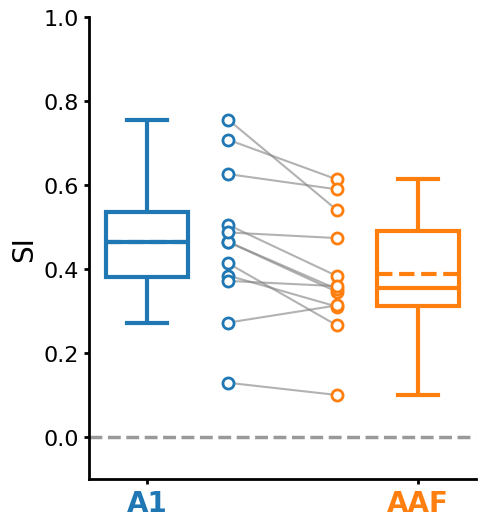

In [13]:
# Plot normalized stimulus-specific adaptation indices (SI) A1 vs AAF (preZX1)
import seaborn as sns
import lib.plotting as plotting

calcium_A1_AAF_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[2]]  # Blue for A1, orange for AAF
df_SI_calcium_1SecISI_A1_AAF = df_resp_peak_calcium_1SecISI[(df_resp_peak_calcium_1SecISI['treatment'] == 'preZX1') & 
                                                            (df_resp_peak_calcium_1SecISI['id'] != '20251208')].copy()  # Exclude animal with only A1 identified

# Extract Deviant and Standard frequencies
df_SI_calcium_1SecISI_A1_AAF[['dev_freq', 'std_freq']] = df_SI_calcium_1SecISI_A1_AAF['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_calcium_1SecISI_A1_AAF['Frequency'] = df_SI_calcium_1SecISI_A1_AAF.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/subfield/frequency combination
df_SI_calcium_1SecISI_A1_AAF = (
    df_SI_calcium_1SecISI_A1_AAF
    .pivot_table(index=['id', 'subfield', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_calcium_1SecISI_A1_AAF = (
    df_SI_calcium_1SecISI_A1_AAF
    .groupby(['id', 'subfield'], sort=False)['SI']
    .mean()
    .reset_index()
)

plotting.plot_boxplot(df_SI_calcium_1SecISI_A1_AAF, x='subfield', y='SI', id='id', 
                      palette=calcium_A1_AAF_palette, offset=0.3, Yaxis_range=(-0.1, 1))

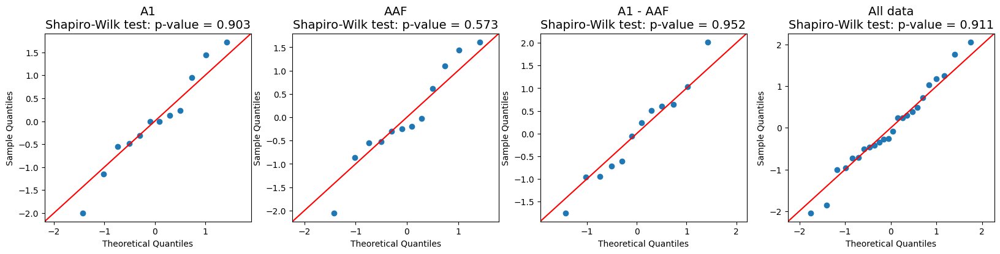

SI, A1 vs 0, one-sample t-test, p-value = 0.0000
SI, AAF vs 0, one-sample t-test, p-value = 0.0000
SI, A1 vs AAF, paired t-test, p-value = 0.0029


In [14]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_1samp, ttest_rel

# Extract SI values for each subfield paired by id
df_pivot = df_SI_calcium_1SecISI_A1_AAF.pivot_table(index='id', columns='subfield', values='SI', sort=False)
group_label = df_pivot.columns.tolist()
groups = [df_pivot[col].to_numpy() for col in group_label]

# Create Q-Q plot to test normality of each subfield and the differences between A1 and AAF
fig, ax = plt.subplots(1, 4, figsize=(20, 4))
sm.qqplot(groups[0], fit=True, line='45', ax=ax[0])
sm.qqplot(groups[1], fit=True, line='45', ax=ax[1])
sm.qqplot(groups[0]-groups[1], fit=True, line='45', ax=ax[2])
sm.qqplot(np.concatenate(groups), fit=True, line='45', ax=ax[3])
ax[0].set_title(f'{group_label[0]}\nShapiro-Wilk test: p-value = {shapiro(groups[0])[1]:.3f}', fontsize=14)
ax[1].set_title(f'{group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[1])[1]:.3f}', fontsize=14)
ax[2].set_title(f'{group_label[0]} - {group_label[1]}\nShapiro-Wilk test: p-value = {shapiro(groups[0]-groups[1])[1]:.3f}', fontsize=14)
ax[3].set_title(f'All data\nShapiro-Wilk test: p-value = {shapiro(np.concatenate(groups))[1]:.3f}', fontsize=14)
plt.show()

# One-sample t-test between mean and 0 re subfield
print(f"SI, {group_label[0]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[0], 0)[1]:.4f}")
print(f"SI, {group_label[1]} vs 0, one-sample t-test, p-value = {ttest_1samp(groups[1], 0)[1]:.4f}")

# Paired t-test between A1 and AAF
print(f"SI, {group_label[0]} vs {group_label[1]}, paired t-test, p-value = {ttest_rel(groups[0], groups[1])[1]:.4f}")

### Zinc

#### Load oddball metadata and process (zinc, A1 & AAF, 1s ISI)

In [17]:
# Initialize experiment group object in A1/AAF with 1s ISI
import pandas as pd
import lib.experiment_oop as exp

# Define path
dPaths_zinc_1SecISI_A1 = [
    common_path_oddball + r"\20250715\AA0001\Oddball_1secISI", 
    common_path_oddball + r"\20250820\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251002\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251105\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251110\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251202\AA0001\GRISZ\Oddball", 
    common_path_oddball + r"\20251205\AA0001\GRISZ\Oddball_1secISI", 
    common_path_oddball + r"\20251209\AA0001\GRISZ\Oddball_1secISI", 
    common_path_oddball + r"\20251210\AA0001\GRISZ\Oddball_1secISI", 
    common_path_oddball + r"\20260107\AA0001\GRISZ\Oddball_1secISI", 
    common_path_oddball + r"\20260121\AA0001\GRISZ\Oddball_1secISI", 
]

dPaths_zinc_1SecISI_AAF = dPaths_zinc_1SecISI_A1.copy()  # Both A1 and AAF are identified in all animals

# Define baseline and response windows
t_base = (2.0, 3.0)
t_resp = (3.3, 5.0)

# subfolder (bool): Whether to search recursively within subfolders for qcam files
group_zinc_1SecISI_A1 = exp.ExperimentGroup(dPaths_zinc_1SecISI_A1, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')
group_zinc_1SecISI_AAF = exp.ExperimentGroup(dPaths_zinc_1SecISI_AAF, subfolder=True, drop_missing_dB=False, t_base=t_base, t_resp=t_resp, format='SHY')

# Load qcam data
group_zinc_1SecISI_A1.load_qcam_data()
group_zinc_1SecISI_AAF.load_qcam_data()

# Process qcam files re saved ROI
cutoff_freq = 2  # Cutoff frequency of low-pass Butterworth filter
group_zinc_1SecISI_A1.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_A1')
group_zinc_1SecISI_AAF.process_signal(cutoff_freq=cutoff_freq, subLogFit=True, mask_name='response_mask_AAF')

# Extract oddball trials in A1/AAF and combine
df_oddball_zinc_1SecISI_A1 = group_zinc_1SecISI_A1.df[group_zinc_1SecISI_A1.df['pulse'].str.contains('oddball')].copy()
df_oddball_zinc_1SecISI_A1['subfield'] = 'A1'
df_oddball_zinc_1SecISI_AAF = group_zinc_1SecISI_AAF.df[group_zinc_1SecISI_AAF.df['pulse'].str.contains('oddball')].copy()
df_oddball_zinc_1SecISI_AAF['subfield'] = 'AAF'
df_oddball_zinc_1SecISI = pd.concat([df_oddball_zinc_1SecISI_A1, df_oddball_zinc_1SecISI_AAF], ignore_index=True)
df_oddball_zinc_1SecISI['id'] = df_oddball_zinc_1SecISI['dir'].str.extract(r'\\(\d{8})\\')  # Add animal ID
df_oddball_zinc_1SecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b) + c
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:832: UserWarning: Traces have more than one frame count. Ensure time windows are adjusted.
  warnings.warn("Traces have more than one frame count. Ensure time windows are adjusted.")
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\signalProcess.py:236: RuntimeWarning: invalid value encountered in log
  return a * np.log(x + b

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:23:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.848890,"[0.025144071253834246, 0.01902478485034565, 0....",0.008158,"[0.015490756950530862, 0.00956049400906493, 0....",0.012976,"[0.01551160500609924, 0.012714696903688457, 0....",0.009496,True,A1,20250715
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:26:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.263780,"[0.018936880633811628, 0.017740563959926525, 0...",0.002831,"[0.009038588437973026, 0.00806854570629487, 0....",0.006151,"[0.009181890224394591, 0.00718302504609163, 0....",0.003130,True,A1,20250715
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:31:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.303404,"[0.02463938371787967, 0.018696321102026396, 0....",0.002387,"[0.015388681967279516, 0.009638910926444037, 0...",0.005755,"[0.015314476234686401, 0.012765959380515276, 0...",0.003643,True,A1,20250715
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:34:29,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.426098,"[0.022294350229710908, 0.020813719170799945, 0...",0.005558,"[0.015820746641081393, 0.014479378186861984, 0...",0.009795,"[0.01582982080188859, 0.014862927531991423, 0....",0.005300,True,A1,20250715
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-08-20 18:52:12,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.971333,"[0.046600579818573046, 0.03880108482184608, 0....",0.025914,"[0.03774162434932195, 0.03001398610324176, 0.0...",0.032191,"[0.037792608732997716, 0.03266634955609074, 0....",0.030016,True,A1,20250820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2026-01-07 19:35:46,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.162876,"[0.017322152014804606, 0.019248049238580717, 0...",0.001145,"[-0.015286384181102383, -0.00689725468540256, ...",0.005078,"[-0.015267418698263273, -0.011001615139096907,...",0.001489,True,AAF,20260107
126,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2026-01-21 19:17:01,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.155481,"[0.03998920896018939, 0.029417945927769838, 0....",-0.001027,"[0.0006956112707174462, 0.0004152158035992288,...",0.003852,"[0.0007319892143161079, -8.94860186800706e-05,...",0.001367,True,AAF,20260121
127,D:\learning\Overseas Research\Dat

In [ ]:
import joblib
# joblib.dump(df_oddball_zinc_1SecISI, '../data/cache/oddball_zinc_1SecISI.joblib')

df_oddball_zinc_1SecISI = joblib.load('../data/cache/oddball_zinc_1SecISI.joblib')
df_oddball_zinc_1SecISI

,qcam,dir,xsg,pulse,dB,treatment,nFrames,timestamp_init,dim_YX,ROImask,...,dF_ROI_logFilt_butterFilt_peak,dFF_ROI_raw,dFF_ROI_raw_peak,dFF_ROI_logFilt,dFF_ROI_logFilt_peak,dFF_ROI_logFilt_butterFilt,dFF_ROI_logFilt_butterFilt_peak,valid,subfield,id
0,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:23:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.848890,"[0.025144071253834246, 0.01902478485034565, 0....",0.008158,"[0.015490756950530862, 0.00956049400906493, 0....",0.012976,"[0.01551160500609924, 0.012714696903688457, 0....",0.009496,True,A1,20250715
1,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:26:28,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.263780,"[0.018936880633811628, 0.017740563959926525, 0...",0.002831,"[0.009038588437973026, 0.00806854570629487, 0....",0.006151,"[0.009181890224394591, 0.00718302504609163, 0....",0.003130,True,A1,20250715
2,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:31:56,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.303404,"[0.02463938371787967, 0.018696321102026396, 0....",0.002387,"[0.015388681967279516, 0.009638910926444037, 0...",0.005755,"[0.015314476234686401, 0.012765959380515276, 0...",0.003643,True,A1,20250715
3,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-07-15 16:34:29,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.426098,"[0.022294350229710908, 0.020813719170799945, 0...",0.005558,"[0.015820746641081393, 0.014479378186861984, 0...",0.009795,"[0.01582982080188859, 0.014862927531991423, 0....",0.005300,True,A1,20250715
4,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2025-08-20 18:52:12,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,1.971333,"[0.046600579818573046, 0.03880108482184608, 0....",0.025914,"[0.03774162434932195, 0.03001398610324176, 0.0...",0.032191,"[0.037792608732997716, 0.03266634955609074, 0....",0.030016,True,A1,20250820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_15422Hz_std_7711Hz_70dB_1000msISI_100m...,None,preZX1,1740,2026-01-07 19:35:46,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.162876,"[0.017322152014804606, 0.019248049238580717, 0...",0.001145,"[-0.015286384181102383, -0.00689725468540256, ...",0.005078,"[-0.015267418698263273, -0.011001615139096907,...",0.001489,True,AAF,20260107
126,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,D:\learning\Overseas Research\Data\Shengjie Da...,oddball_7711Hz_std_15422Hz_70dB_1000msISI_100m...,None,preZX1,1740,2026-01-21 19:17:01,"(130, 174)","[[False, False, False, False, False, False, Fa...",...,0.155481,"[0.03998920896018939, 0.029417945927769838, 0....",-0.001027,"[0.0006956112707174462, 0.0004152158035992288,...",0.003852,"[0.0007319892143161079, -8.94860186800706e-05,...",0.001367,True,AAF,20260121
127,D:\learning\Overseas Research\Dat

In [19]:
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

# Load deviant tone positions
deviant_pos_zinc_1SecISI_old = [71, 63, 13, 33, 53, 10, 61, 21]  # id 20250715, 20251209, 20251210
deviant_pos_zinc_1SecISI_new = [13, 28, 32, 34, 56, 57, 71, 74]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_zinc_1SecISI_old = signalProcess.get_oddball_pos(deviant_pos_zinc_1SecISI_old, stim_ISI=1.0, stim_count=80)
onset_times_zinc_1SecISI_new = signalProcess.get_oddball_pos(deviant_pos_zinc_1SecISI_new, stim_ISI=1.0, stim_count=80)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_zinc_1SecISI_all = {
    '20250715': onset_times_zinc_1SecISI_old,
    '20251209': onset_times_zinc_1SecISI_old,
    '20251210': onset_times_zinc_1SecISI_old,

    '20250820': onset_times_zinc_1SecISI_new,
    '20251002': onset_times_zinc_1SecISI_new,
    '20251105': onset_times_zinc_1SecISI_new,
    '20251110': onset_times_zinc_1SecISI_new,
    '20251202': onset_times_zinc_1SecISI_new,
    '20251205': onset_times_zinc_1SecISI_new,
    '20260107': onset_times_zinc_1SecISI_new,
    '20260121': onset_times_zinc_1SecISI_new,
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_zinc_temp = []

for (id, subfield), df_sub_zinc in df_oddball_zinc_1SecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_zinc = onset_times_zinc_1SecISI_all[id]

    df_resp_trace_zinc = plotting.plot_oddball_wholeTrace(
        df_sub_zinc, onset_times_zinc, 
        resp_col='dFF_ROI_logFilt_butterFilt', 
        negative_exclude=True,  # Exclude windows of negative responses
        t_resp=(0.3, 0.475),  # Skip first 300ms after tone onset to avoid motion artifacts
        plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_zinc['id'] = id
    df_resp_trace_zinc['subfield'] = subfield

    df_resp_trace_zinc_temp.append(df_resp_trace_zinc)

df_resp_trace_zinc_1SecISI = pd.concat(df_resp_trace_zinc_temp, ignore_index=True)
df_resp_trace_zinc_1SecISI = df_resp_trace_zinc_1SecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]
df_resp_trace_zinc_1SecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Igno

,id,subfield,treatment,pulse,time,individual_traces,avg_trace,deviant_times,standard_times
0,20250715,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.01551160500609924, 0.012714696903688457, 0...","[0.01541304062039282, 0.012740328142101867, 0....","[12.0, 15.0, 23.0, 35.0, 55.0, 63.0, 65.0, 73.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
1,20250715,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.009181890224394591, 0.00718302504609163, 0...","[0.012505855513141591, 0.011022976289041527, 0...","[12.0, 15.0, 23.0, 35.0, 55.0, 63.0, 65.0, 73.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
2,20250820,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.04601496381626771, 0.039042538453629934, 0...","[0.04568482635682256, 0.03936573299683454, 0.0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
3,20250820,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.037792608732997716, 0.03266634955609074, 0...","[0.03908877204727424, 0.03305690239509821, 0.0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
4,20251002,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.036907952168436085, 0.030711699926365042, ...","[0.03510678466909269, 0.028264761005074118, 0....","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
5,20251002,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.026275511864384152, 0.018895103810720362, ...","[0.03572518367294188, 0.02907434555000854, 0.0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
6,20251105,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.02236952719558732, 0.020085652545756012, 0...","[0.008847414549739115, 0.009527371177920888, 0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
7,20251105,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.015441080063995883, 0.012413566187975634, ...","[0.013782376130664985, 0.011206181312712338, 0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
8,20251110,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.06998389777627903, 0.06092875087419763, 0....","[0.057321514886457696, 0.04837867551478708, 0....","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."
9,20251110,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,"[0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.3...","[[0.04757113274016566, 0.03848361958443322, 0....","[0.030101875864400877, 0.028205146029799386, 0...","[15.0, 30.0, 34.0, 36.0, 58.0, 59.0, 73.0, 76.0]","[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0..."


In [20]:
# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_zinc_temp = []

for (id, subfield), df_sub_zinc in df_resp_trace_zinc_1SecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_zinc = signalProcess.add_oddball_respData(df_sub_zinc, t_resp=(0.3, 0.475))
    
    # Restore metadata columns
    df_resp_peak_zinc['id'] = id
    df_resp_peak_zinc['subfield'] = subfield

    df_resp_peak_zinc_temp.append(df_resp_peak_zinc)

df_resp_peak_zinc_1SecISI = pd.concat(df_resp_peak_zinc_temp, ignore_index=True)
df_resp_peak_zinc_1SecISI = df_resp_peak_zinc_1SecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]
df_resp_peak_zinc_1SecISI

,id,subfield,treatment,pulse,stimulus,trace,response
0,20250715,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.00076512970503511, 0.0014057334573017...",0.001642
1,20250715,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.00032775631283183705, -0.00059983187...",0.002074
2,20250715,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, 0.00023508097020968552, 0.0003414011744...",0.001909
3,20250715,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.00036827584240292036, 0.0005477528302...",0.000980
4,20250820,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.0003329234132589849, 0.00067065252338...",0.003952
...,...,...,...,...,...,...,...
83,20260107,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 1.2763147539137428e-05, -1.218769160329...",0.001268
84,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.00024077620448732188, 0.0004598507363...",0.001420
85,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.00017216841649761298, -0.00030128718...",0.001502
86,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.00028145006971371867, -0.00036028566...",0.002565


#### Figure 5E (response, Deviant vs Standard, re subfield, 1s ISI)

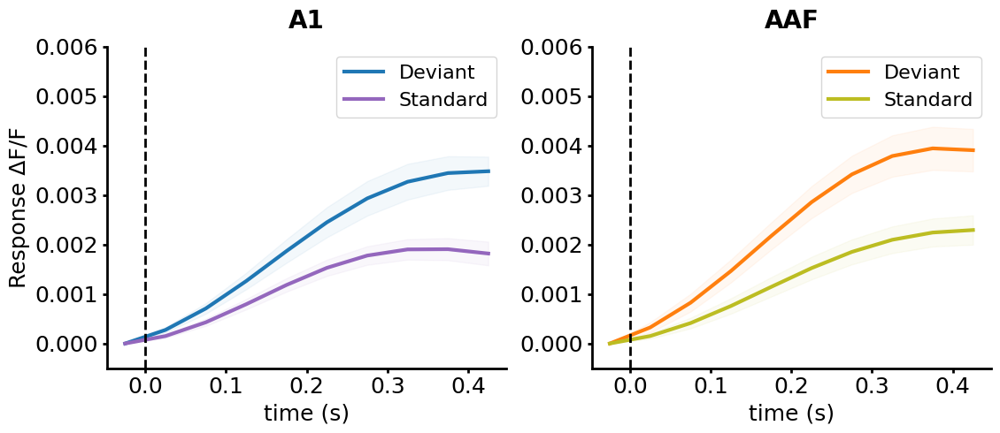

In [21]:
# Plot representative traces Deviant vs Standard re subfield
import seaborn as sns
import lib.plotting as plotting

df_resp_zinc_1SecISI_subfield = df_resp_peak_zinc_1SecISI[df_resp_peak_zinc_1SecISI['treatment'] == 'preZX1'].copy()

# Extract Deviant and Standard frequencies
df_resp_zinc_1SecISI_subfield[['dev_freq', 'std_freq']] = df_resp_zinc_1SecISI_subfield['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'frequency' column based on stimulus type
df_resp_zinc_1SecISI_subfield['Frequency'] = df_resp_zinc_1SecISI_subfield.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

df_resp_zinc_1SecISI_subfield.rename(columns={'response': 'Response ΔF/F'}, inplace=True)
df_resp_zinc_1SecISI_subfield = df_resp_zinc_1SecISI_subfield[['id', 'subfield', 'Frequency', 'stimulus', 'trace', 'Response ΔF/F']]

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
zinc_resp_subfield_palette = {('A1', 'Deviant'): sns.color_palette("tab20")[0], ('A1', 'Standard'): sns.color_palette("tab20")[8], 
                              ('AAF', 'Deviant'): sns.color_palette("tab20")[2], ('AAF', 'Standard'): sns.color_palette("tab20")[16]}

# Representative animal: 20251110, 8kHz
df_resp_zinc_1SecISI_subfield_represent = df_resp_zinc_1SecISI_subfield[
    (df_resp_zinc_1SecISI_subfield['id'] == '20251110') & (df_resp_zinc_1SecISI_subfield['Frequency'] == '8kHz')
].copy()

fig = plotting.plot_oddball_trace_reTone(df_resp_zinc_1SecISI_subfield_represent, trace_col='trace', x_col='subfield', y_col=None, within_col='stimulus', 
                                         color_palette=zinc_resp_subfield_palette, Yaxis_label='Response ΔF/F', 
                                         Yaxis_range=(-0.0005, 0.006), plot_errBar=True)

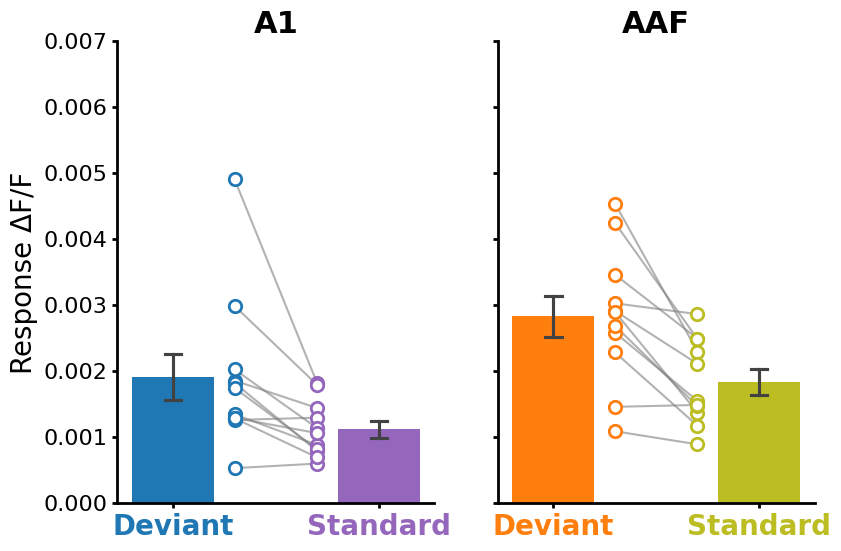

In [22]:
# Plot response amplitudes Deviant vs Standard re subfield

# Blue for A1 Deviant, purple for A1 Standard, orange for AAF Deviant, olive yellow for AAF Standard
zinc_resp_subfield_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[8], sns.color_palette("tab20")[2], sns.color_palette("tab20")[16]]

# Average across the two pulse protocols
df_resp_zinc_1SecISI_subfield = (
    df_resp_zinc_1SecISI_subfield.copy()
    .groupby(['id', 'subfield', 'stimulus'], sort=False)['Response ΔF/F']
    .mean()
    .reset_index()
)

plotting.plot_barplot(df_resp_zinc_1SecISI_subfield, x='stimulus', y='Response ΔF/F', group='subfield', 
                      id='id', palette=zinc_resp_subfield_palette, offset=0.3, Yaxis_range=(0, 0.007), title_color='k')

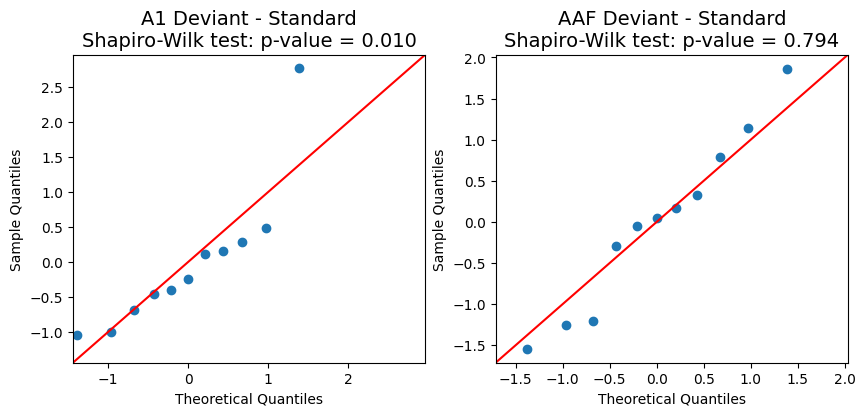

Response amplitude, A1 Deviant vs Standard, paired t-test, p-value = 0.0127
Response amplitude, AAF Deviant vs Standard, paired t-test, p-value = 0.0008


In [23]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro, ttest_rel

# Extract response amplitude values for each stimulus re subfield paired by id
df_pivot_A1 = (
    df_resp_zinc_1SecISI_subfield[df_resp_zinc_1SecISI_subfield['subfield'] == 'A1'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_A1 = df_pivot_A1.columns.tolist()
groups_A1 = [df_pivot_A1[col].to_numpy() for col in group_label_A1]

df_pivot_AAF = (
    df_resp_zinc_1SecISI_subfield[df_resp_zinc_1SecISI_subfield['subfield'] == 'AAF'].copy()
    .pivot_table(index='id', columns='stimulus', values='Response ΔF/F', sort=False)
)
group_label_AAF = df_pivot_AAF.columns.tolist()
groups_AAF = [df_pivot_AAF[col].to_numpy() for col in group_label_AAF]

# Create Q-Q plot to test normality of the differences between Deviant and Standard re subfield
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sm.qqplot(groups_A1[0] - groups_A1[1], fit=True, line='45', ax=ax[0])
sm.qqplot(groups_AAF[0] - groups_AAF[1], fit=True, line='45', ax=ax[1])
ax[0].set_title(f'A1 {group_label_A1[0]} - {group_label_A1[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_A1[0] - groups_A1[1])[1]:.3f}', fontsize=14)
ax[1].set_title(f'AAF {group_label_AAF[0]} - {group_label_AAF[1]}\nShapiro-Wilk test: p-value = {shapiro(groups_AAF[0] - groups_AAF[1])[1]:.3f}', fontsize=14)
plt.show()

# Paired t-test between Deviant and Standard re subfield
print(f"Response amplitude, A1 {group_label_A1[0]} vs {group_label_A1[1]}, paired t-test, p-value = {ttest_rel(groups_A1[0], groups_A1[1])[1]:.4f}")
print(f"Response amplitude, AAF {group_label_AAF[0]} vs {group_label_AAF[1]}, paired t-test, p-value = {ttest_rel(groups_AAF[0], groups_AAF[1])[1]:.4f}")

#### Figure 5F (SI, 0.5s vs 1s ISI, A1 vs AAF)

In [24]:
# Reload zinc oddball data with 0.5s ISI

import joblib
import pandas as pd
import lib.signalProcess as signalProcess
import lib.plotting as plotting

df_oddball_zinc_halfSecISI = joblib.load('../data/cache/oddball_zinc_halfSecISI.joblib')

# Load deviant tone positions
deviant_pos_zinc_halfSecISI_old = [12, 86, 82, 57, 61, 21, 9, 63, 8, 6, 118, 59]  # id 20250527, 20250626
deviant_pos_zinc_halfSecISI_new = [114, 71, 63, 113, 13, 33, 53, 80, 10, 61, 21, 92]  # All other ids

# Calculate deviant/standard tone onset times
onset_times_zinc_halfSecISI_old = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_old, stim_ISI=0.5, stim_count=120)
onset_times_zinc_halfSecISI_new = signalProcess.get_oddball_pos(deviant_pos_zinc_halfSecISI_new, stim_ISI=0.5, stim_count=120)

# Map id to corresponding tuple (deviant_times, standard_times)
onset_times_zinc_halfSecISI_all = {
    '20250527': onset_times_zinc_halfSecISI_old,
    '20250530': onset_times_zinc_halfSecISI_old,
    '20250626': onset_times_zinc_halfSecISI_old,
    '20251205': onset_times_zinc_halfSecISI_new,
    '20251209': onset_times_zinc_halfSecISI_new,
    '20251210': onset_times_zinc_halfSecISI_new,
    '20260107': onset_times_zinc_halfSecISI_new,
    '20260121': onset_times_zinc_halfSecISI_new
}

# Calculate averaged whole traces re id/subfield combination
df_resp_trace_zinc_temp = []

for (id, subfield), df_sub_zinc in df_oddball_zinc_halfSecISI.groupby(['id', 'subfield'], sort=False):
    onset_times_zinc = onset_times_zinc_halfSecISI_all[id]

    df_resp_trace_zinc = plotting.plot_oddball_wholeTrace(
        df_sub_zinc, onset_times_zinc, 
        resp_col='dFF_ROI_logFilt_butterFilt', 
        negative_exclude=True,  # Exclude windows of negative responses
        t_resp=(0.3, 0.475),  # Skip first 300ms after tone onset to avoid motion artifacts
        plot_traces=False
    )

    # Restore metadata columns
    df_resp_trace_zinc['id'] = id
    df_resp_trace_zinc['subfield'] = subfield

    df_resp_trace_zinc_temp.append(df_resp_trace_zinc)

df_resp_trace_zinc_halfSecISI = pd.concat(df_resp_trace_zinc_temp, ignore_index=True)
df_resp_trace_zinc_halfSecISI = df_resp_trace_zinc_halfSecISI[
    ['id', 'subfield', 'treatment', 'pulse', 'time', 'individual_traces', 'avg_trace', 'deviant_times', 'standard_times']
]

# Calculate deviant/standard peak response re id/subfield combination
df_resp_peak_zinc_temp = []

for (id, subfield), df_sub_zinc in df_resp_trace_zinc_halfSecISI.groupby(['id', 'subfield'], sort=False):
    df_resp_peak_zinc = signalProcess.add_oddball_respData(df_sub_zinc, t_resp=(0.3, 0.475))
    
    # Restore metadata columns
    df_resp_peak_zinc['id'] = id
    df_resp_peak_zinc['subfield'] = subfield

    df_resp_peak_zinc_temp.append(df_resp_peak_zinc)

df_resp_peak_zinc_halfSecISI = pd.concat(df_resp_peak_zinc_temp, ignore_index=True)
df_resp_peak_zinc_halfSecISI = df_resp_peak_zinc_halfSecISI[['id', 'subfield', 'treatment', 'pulse', 'stimulus', 'trace', 'response']]

# Only keep animals with both 0.5s ISI and 1s ISI data
df_SI_zinc_halfSecISI = df_resp_peak_zinc_halfSecISI[
    (df_resp_peak_zinc_halfSecISI['id'].isin(['20251205', '20251209', '20251210', '20260107', '20260121'])) & 
    (df_resp_peak_zinc_halfSecISI['treatment'] == 'preZX1')
].copy().reset_index(drop=True)
df_SI_zinc_halfSecISI['ISI'] = '0.5s'

df_SI_zinc_halfSecISI

d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Ignore NaN values (negative responses)
d:\learning\Overseas Research\Scripts\Python\pyFluo\src\lib\plotting.py:1944: RuntimeWarning: Mean of empty slice
  traces_negExcl_mean = np.nanmean(traces, axis=0)  # Igno

,id,subfield,treatment,pulse,stimulus,trace,response,ISI
0,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.00021270772057393507, -0.00037830757...",0.001421,0.5s
1,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.0002640029169276572, 0.00068136628516...",0.002768,0.5s
2,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -7.926422247604877e-05, -3.439244402435...",0.001532,0.5s
3,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 1.5497651646044584e-05, 8.2413579254849...",0.000726,0.5s
4,20251209,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0007329884365775002, -0.001396722647...",0.001927,0.5s
5,20251209,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.0002522066316787315, -0.000388044492...",0.003601,0.5s
6,20251209,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.0002823350978826758, -0.000590193841...",0.000724,0.5s
7,20251209,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 0.0007812455221829322, 0.00161337772961...",0.001300,0.5s
8,20251210,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[nan, nan, nan, nan, nan, nan, nan, nan, nan,...",0.002763,0.5s
9,20251210,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[nan, nan, nan, nan, nan, nan, nan, nan, nan,...",0.001364,0.5s


In [25]:
# Concatenate with 1s ISI data
df_SI_zinc_1SecISI = df_resp_peak_zinc_1SecISI[
    (df_resp_peak_zinc_1SecISI['id'].isin(['20251205', '20251209', '20251210', '20260107', '20260121'])) & 
    (df_resp_peak_zinc_1SecISI['treatment'] == 'preZX1')
].copy().reset_index(drop=True)
df_SI_zinc_1SecISI['ISI'] = '1s'

df_SI_zinc = pd.concat([df_SI_zinc_halfSecISI, df_SI_zinc_1SecISI], ignore_index=True)
df_SI_zinc

,id,subfield,treatment,pulse,stimulus,trace,response,ISI
0,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.00021270772057393507, -0.00037830757...",0.001421,0.5s
1,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, 0.0002640029169276572, 0.00068136628516...",0.002768,0.5s
2,20251205,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -7.926422247604877e-05, -3.439244402435...",0.001532,0.5s
3,20251205,A1,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 1.5497651646044584e-05, 8.2413579254849...",0.000726,0.5s
4,20251209,A1,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, -0.0007329884365775002, -0.001396722647...",0.001927,0.5s
...,...,...,...,...,...,...,...,...
75,20260107,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Standard,"[[0.0, 1.2763147539137428e-05, -1.218769160329...",0.001268,1s
76,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Deviant,"[[0.0, 0.00024077620448732188, 0.0004598507363...",0.001420,1s
77,20260121,AAF,preZX1,Deviant: 8kHz\nStandard: 16kHz,Deviant,"[[0.0, -0.00017216841649761298, -0.00030128718...",0.001502,1s
78,20260121,AAF,preZX1,Deviant: 16kHz\nStandard: 8kHz,Standard,"[[0.0, -0.00028145006971371867, -0.00036028566...",0.002565,1s


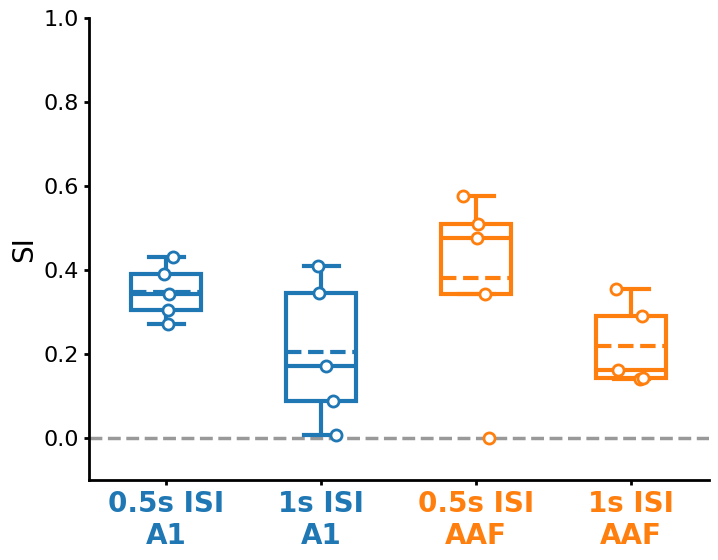

In [26]:
# Plot normalized stimulus-specific adaptation indices (SI) 0.5s vs 1s ISI, A1 vs AAF
import seaborn as sns
import lib.plotting as plotting

# Blue for A1, orange for AAF
zinc_ISI_subfield_palette = [sns.color_palette("tab20")[0], sns.color_palette("tab20")[0], 
                             sns.color_palette("tab20")[2], sns.color_palette("tab20")[2]]
df_SI_zinc_plot = df_SI_zinc.copy()

# Extract Deviant and Standard frequencies
df_SI_zinc_plot[['dev_freq', 'std_freq']] = df_SI_zinc_plot['pulse'].str.extract(
    r'Deviant:\s*(\d+kHz)\nStandard:\s*(\d+kHz)'
)

# Add 'Frequency' column based on stimulus type
df_SI_zinc_plot['Frequency'] = df_SI_zinc_plot.apply(
    lambda x: x['dev_freq'] if x['stimulus'] == 'Deviant' else x['std_freq'],
    axis=1
)

# Calculate SI (stimulus-specific adaptation index) re id/ISI/subfield/frequency combination
df_SI_zinc_plot = (
    df_SI_zinc_plot
    .pivot_table(index=['id', 'ISI', 'subfield', 'Frequency'], columns='stimulus', values='response', sort=False)
    .assign(SI=lambda df: (df['Deviant']-df['Standard']) / (df['Deviant']+df['Standard']))
    .reset_index()
)

# Average across the two frequencies
df_SI_zinc_plot = (
    df_SI_zinc_plot
    .groupby(['id', 'ISI', 'subfield'], sort=False)['SI']
    .mean()
    .reset_index()
)
df_SI_zinc_plot = df_SI_zinc_plot.sort_values(by=['id', 'subfield', 'ISI']).reset_index(drop=True)
df_SI_zinc_plot['ISI_subfield'] = df_SI_zinc_plot['ISI'] + ' ISI' + '\n' + df_SI_zinc_plot['subfield']

plotting.plot_boxplot(df_SI_zinc_plot, x='ISI_subfield', y='SI', id=None, 
                      palette=zinc_ISI_subfield_palette, offset=0, jitter=0.1, Yaxis_range=(-0.1, 1))

In [27]:
# Test significance of fixed-effect parameters (ISI and subfield) using 2-way repeated measures ANOVA
import statsmodels.stats.anova as sm_anova

df_SI_zinc_anova = df_SI_zinc_plot.copy()
model = sm_anova.AnovaRM(data=df_SI_zinc_anova, depvar='SI', subject='id', within=['ISI', 'subfield'])
result = model.fit()
print("SI, 2-way repeated measures ANOVA:")
print(result.summary())

SI, 2-way repeated measures ANOVA:
                  Anova
             F Value Num DF Den DF Pr > F
-----------------------------------------
ISI          22.6668 1.0000 4.0000 0.0089
subfield      0.2842 1.0000 4.0000 0.6222
ISI:subfield  0.0193 1.0000 4.0000 0.8962

